In [62]:
import pandas as pd
import numpy as np
import itertools
import operator

#Plotting libraries
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import seaborn as sns
import altair as alt
mpl.use('Agg')
plt.style.use('seaborn-white')
pd.plotting.register_matplotlib_converters()
mpl.rcParams['axes.unicode_minus'] = False
%matplotlib inline

#statistics libraries
import math
import statsmodels.api as sm
import scipy
from scipy import signal, stats

# Suppress Deprecation and Incorrect Usage Warnings
import warnings
warnings.filterwarnings('ignore')

In [63]:
#Printing library versions
import sys

print('Python:', sys.version)
print('Pandas:', pd.__version__)
print('Statsmodels:', sm.__version__)
print('Scipy:', scipy.__version__)
print('Numpy:', np.__version__)
print ('matplolib:', mpl.__version__)

Python: 3.7.9 (default, Aug 31 2020, 17:10:11) [MSC v.1916 64 bit (AMD64)]
Pandas: 1.2.2
Statsmodels: 0.12.2
Scipy: 1.6.0
Numpy: 1.19.2
matplolib: 3.3.4


In [64]:
# matplolib korean setting
font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')
f =[(f.name, f.fname) for f in fm.fontManager.ttflist if 'Nanum' in f.name]
fontprop = fm.FontProperties(fname=f[0][1], size=18)
plt.rcParams["font.family"] = f[0]
plt.rcParams["font.size"] = 15
plt.rcParams["figure.figsize"] = (14,4)
print('font-size:', plt.rcParams['font.size'] )
print('font-family:', plt.rcParams['font.family'][0])

font-size: 15.0
font-family: NanumSquareRound


In [65]:
import os
from os.path import isfile, join
data_path = os.getcwd() + "\\data" 
files_list = [f for f in os.listdir(data_path) if isfile(join(data_path, f))]
print(len(files_list))
print(files_list)

6
['2019-03-15_jobs.csv', '2019-03-15_rejects.csv', '2019-03-15_reject_details.csv', '2019-03-15_users.csv', '2019-03-15_user_details.csv', 'outf.csv']


In [66]:
# data load
print(files_list[5])
data = pd.read_csv(join(data_path, files_list[5]), encoding="utf-8")

outf.csv


In [67]:
print(data.head())
print(data.describe())
print(data.dtypes)

   Unnamed: 0  user_id             birthday  gender  photo_count  \
0           0  1867728  1997-02-06 00:00:00       1            6   
1           1  1867729  1999-06-14 00:00:00       1            3   
2           2  1867731  2000-06-16 00:00:00       1            4   
3           3  1867733  1997-10-01 00:00:00       1            6   
4           4  1867734  1993-03-03 00:00:00       1            4   

   profile_score profile_tier                                bio characters  \
0          59.98         Gold                                NaN        NaN   
1          49.67       Silver                                NaN        NaN   
2          66.88      Diamond                                NaN        NaN   
3          54.04         Gold                                NaN        NaN   
4          87.65      Diamond  혼자사는데   저랑 술친구 밥친구 톡친구 해요  카톡T886        NaN   

   height  ...     stage_updated_at     last_activity_at   age  \
0   156.0  ...  2019-02-21 15:26:14  2019-02-21 15

# Category x categpry`

In [68]:
data.columns

Index(['Unnamed: 0', 'user_id', 'birthday', 'gender', 'photo_count',
       'profile_score', 'profile_tier', 'bio', 'characters', 'height',
       'body_type', 'blood_type', 'education', 'school', 'job', 'company',
       'religion', 'smoking', 'drinking', 'region', 'state', 'locality',
       'longitude', 'latitude', 'current_region', 'language', 'is_out',
       'is_deactivated', 'is_blocked', 'phone_number',
       'facebook_email_address', 'account_created_at', 'is_confirm',
       'confirm_admin_id', 'admin_confirmed_at', 'rating_completed_at',
       'sign_up_completed', 'stage', 'stage_updated_at', 'last_activity_at',
       'age', 'StandardScaler_age', 'rating_p', 'activate_p', 'active_p',
       'character_response', 'weekdays', 'sign_hours'],
      dtype='object')

In [69]:
category_col = ['profile_tier',
       'body_type', 'blood_type', 'education', 
       'religion', 'smoking', 'drinking', 'region', 'current_region', 'language', 'is_out',
       'is_deactivated', 'is_blocked', 'is_confirm',
       'sign_up_completed', 'stage', 'weekdays', 'sign_hours']

In [70]:
data.pivot_table(index="profile_tier", columns="body_type", aggfunc="size")

body_type,BF00,BF01,BF02,BF03,BF04,BF05,BM00,BM02
profile_tier,,,,,,,,
Bronze,1.0,NaN,6.0,2.0,4.0,5.0,NaN,NaN
Diamond,398.0,1270.0,3169.0,600.0,365.0,661.0,1.0,6.0
Gold,128.0,265.0,1209.0,271.0,255.0,799.0,NaN,1.0
Silver,30.0,37.0,213.0,81.0,201.0,297.0,NaN,NaN


<AxesSubplot:xlabel='body_type', ylabel='profile_tier'>

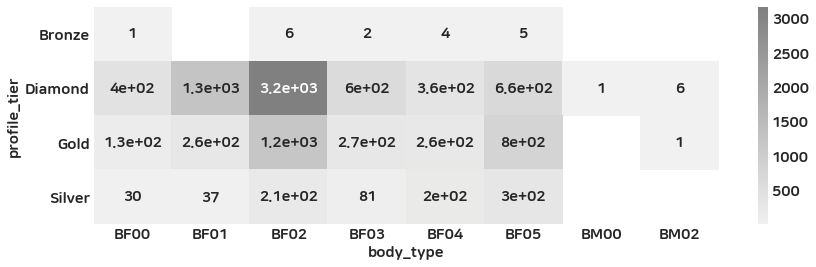

In [71]:
sns.heatmap(data.pivot_table(index="profile_tier", columns="body_type", aggfunc="size"),
            cmap=sns.light_palette("gray", as_cmap=True), annot=True)
# plt.show()

profile_tier  Bronze  Diamond    Gold  Silver
profile_tier                                 
Bronze          18.0      NaN     NaN     NaN
Diamond          NaN   6470.0     NaN     NaN
Gold             NaN      NaN  2928.0     NaN
Silver           NaN      NaN     NaN   859.0


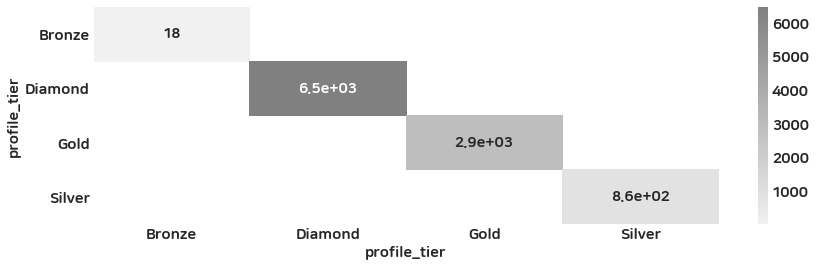

body_type      BF00    BF01    BF02   BF03   BF04   BF05  BM00  BM02
profile_tier                                                        
Bronze          1.0     NaN     6.0    2.0    4.0    5.0   NaN   NaN
Diamond       398.0  1270.0  3169.0  600.0  365.0  661.0   1.0   6.0
Gold          128.0   265.0  1209.0  271.0  255.0  799.0   NaN   1.0
Silver         30.0    37.0   213.0   81.0  201.0  297.0   NaN   NaN


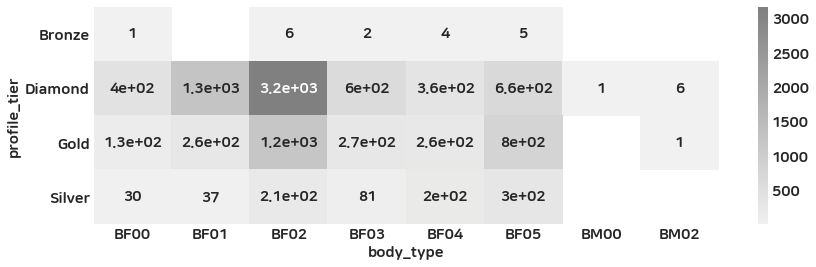

blood_type        A     AB      B      O
profile_tier                            
Bronze          1.0    NaN    1.0    2.0
Diamond       522.0  186.0  453.0  550.0
Gold          286.0   97.0  201.0  285.0
Silver         67.0   39.0   46.0   86.0


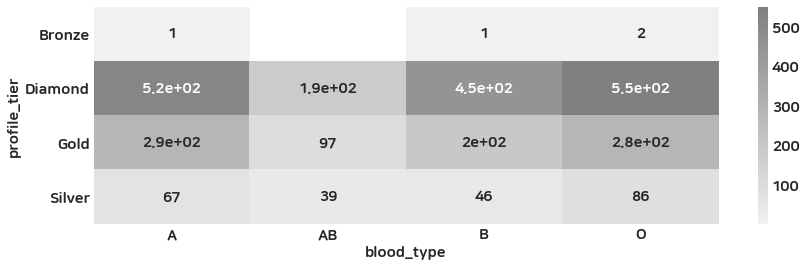

education      UE01    UE02    UE03   UE04  UE05   UE06
profile_tier                                           
Bronze         11.0     1.0     5.0    NaN   NaN    1.0
Diamond       973.0  1138.0  3508.0  274.0  33.0  464.0
Gold          683.0   480.0  1425.0   96.0  13.0  197.0
Silver        338.0    63.0   346.0   24.0   2.0   73.0


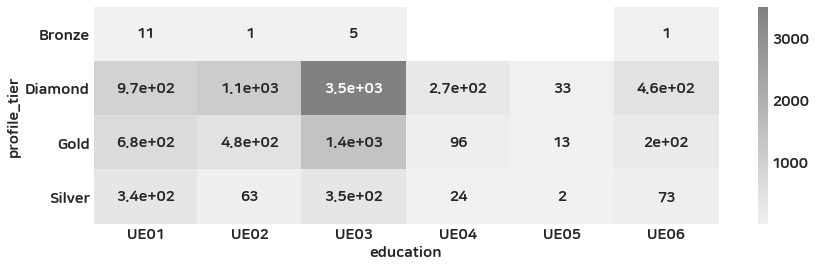

religion        UR00    UR01   UR02   UR03  UR04  UR05  UR06  UR07  UR08  \
profile_tier                                                               
Bronze           4.0    10.0    NaN    1.0   NaN   1.0   NaN   NaN   NaN   
Diamond       4419.0  1196.0  199.0  458.0   NaN  51.0  23.0   1.0   2.0   
Gold          1770.0   649.0  127.0  233.0   1.0  18.0   7.0   1.0   NaN   
Silver         350.0   291.0   26.0   88.0   NaN  13.0   3.0   2.0   NaN   

religion      UR09  UR10  UR11   UR99  
profile_tier                           
Bronze         NaN   NaN   NaN    2.0  
Diamond        NaN   1.0   1.0  119.0  
Gold           1.0   1.0   2.0  118.0  
Silver         NaN   NaN   NaN   86.0  


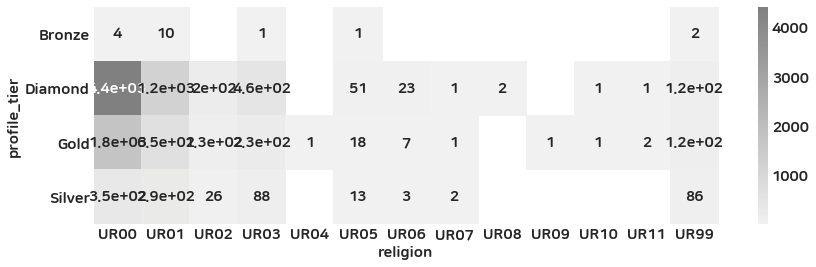

smoking       SM00  SM01  SM02
profile_tier                  
Bronze           1     5    12
Diamond        270   763  5437
Gold           182   341  2405
Silver          71   137   651


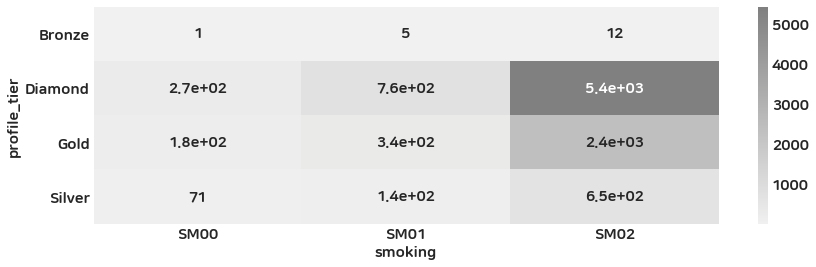

drinking      DR00  DR01  DR02
profile_tier                  
Bronze           1     9     8
Diamond        473  4971  1026
Gold           225  2152   551
Silver          33   564   262


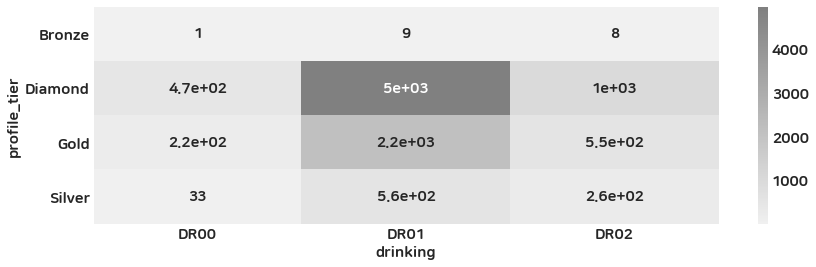

region         AE   AR    AU   AZ   BE   BH   BR   BY   CA   CL  ...   SG  \
profile_tier                                                     ...        
Bronze        NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
Diamond       6.0  3.0  15.0  NaN  1.0  1.0  5.0  1.0  8.0  3.0  ...  1.0   
Gold          1.0  NaN   1.0  1.0  NaN  NaN  1.0  NaN  5.0  NaN  ...  5.0   
Silver        NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  1.0   

region         TH   TN   TR   TW   TZ   UA     US   VN   ZA  
profile_tier                                                 
Bronze        NaN  NaN  NaN  NaN  NaN  NaN   18.0  NaN  NaN  
Diamond       7.0  2.0  8.0  NaN  1.0  3.0  927.0  4.0  8.0  
Gold          1.0  NaN  1.0  1.0  NaN  1.0  839.0  1.0  NaN  
Silver        NaN  NaN  NaN  NaN  NaN  NaN  598.0  NaN  NaN  

[4 rows x 56 columns]


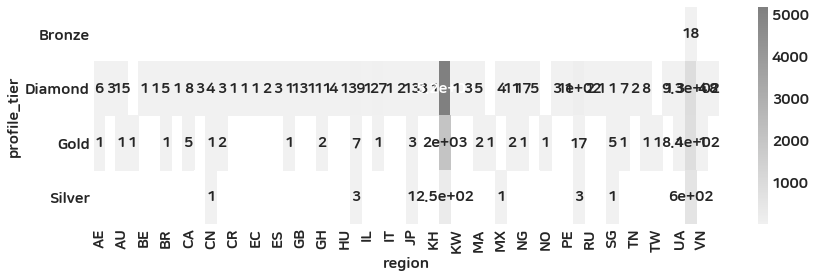

current_region   AE   AR   AT    AU   AZ   BD   BE   BH   BJ   BR  ...   TH  \
profile_tier                                                       ...        
Bronze          NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
Diamond         9.0  3.0  NaN  15.0  NaN  3.0  1.0  1.0  1.0  5.0  ...  7.0   
Gold            1.0  5.0  1.0   2.0  1.0  NaN  NaN  NaN  1.0  4.0  ...  2.0   
Silver          1.0  2.0  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   

current_region   TN   TR   TW   TZ   UA     US   VE    VN   ZA  
profile_tier                                                    
Bronze          NaN  NaN  NaN  NaN  NaN   17.0  NaN   NaN  NaN  
Diamond         3.0  2.0  3.0  1.0  3.0  771.0  NaN  10.0  8.0  
Gold            NaN  4.0  1.0  NaN  1.0  825.0  NaN   4.0  NaN  
Silver          NaN  NaN  1.0  NaN  NaN  600.0  1.0   NaN  NaN  

[4 rows x 70 columns]


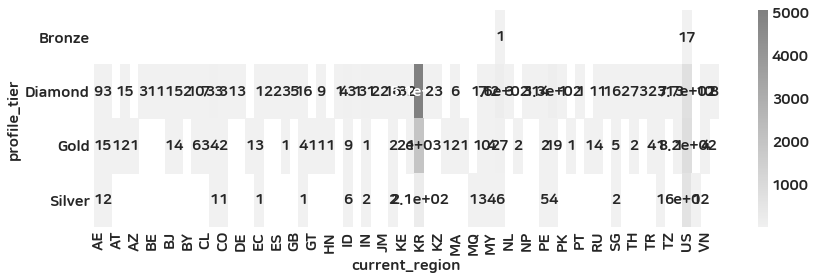

language       de      en    es   fr    in   iw   ja      ko   nb   pt   ru  \
profile_tier                                                                  
Bronze        NaN    18.0   NaN  NaN   NaN  NaN  NaN     NaN  NaN  NaN  NaN   
Diamond       1.0  1306.0  24.0  5.0  19.0  1.0  NaN  5092.0  NaN  4.0  6.0   
Gold          NaN   991.0  30.0  3.0   4.0  NaN  NaN  1884.0  1.0  3.0  5.0   
Silver        NaN   661.0  13.0  1.0   3.0  NaN  1.0   177.0  NaN  1.0  1.0   

language       th   tr   uk   vi   zh  
profile_tier                           
Bronze        NaN  NaN  NaN  NaN  NaN  
Diamond       2.0  2.0  2.0  1.0  5.0  
Gold          NaN  2.0  NaN  NaN  5.0  
Silver        1.0  NaN  NaN  NaN  NaN  


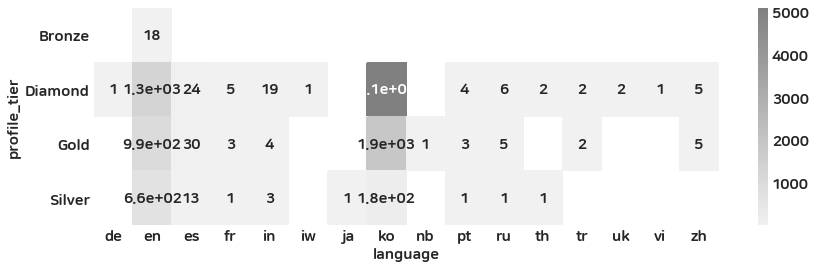

is_out           N     Y
profile_tier            
Bronze          15     3
Diamond       3674  2796
Gold          1635  1293
Silver         586   273


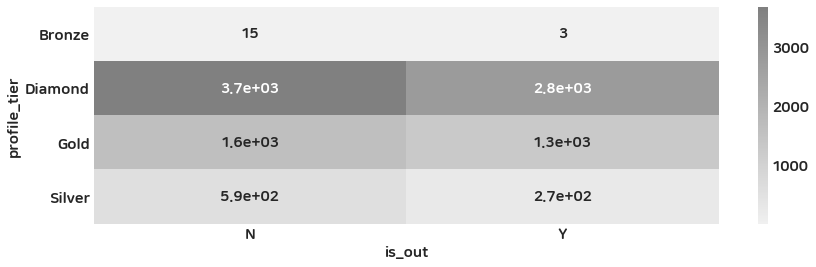

is_deactivated     N     Y
profile_tier              
Bronze            11     7
Diamond         3476  2994
Gold            1448  1480
Silver           380   479


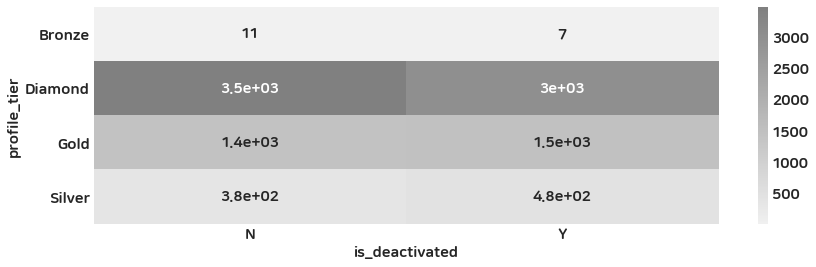

is_blocked      Y
profile_tier     
Diamond       272
Gold            6


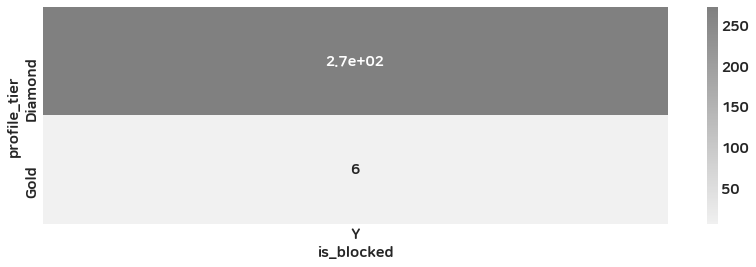

is_confirm       Y
profile_tier      
Bronze          18
Diamond       6470
Gold          2928
Silver         859


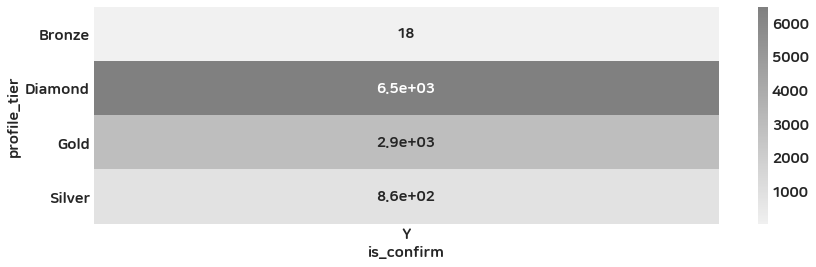

sign_up_completed    N     Y
profile_tier                
Bronze               4    14
Diamond            128  6342
Gold                99  2829
Silver              84   775


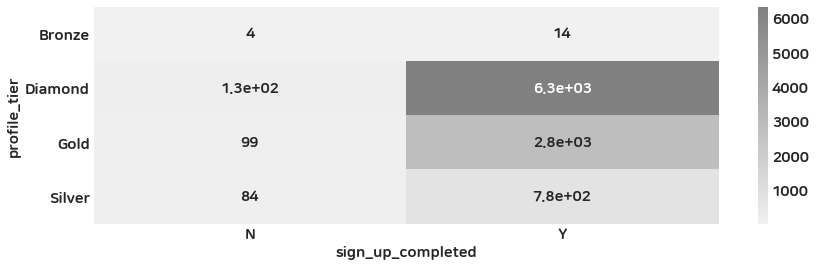

stage         Attraction  Interest  Review
profile_tier                              
Bronze               NaN       NaN     4.0
Diamond              NaN       NaN   128.0
Gold                 1.0       1.0    97.0
Silver               1.0       2.0    81.0


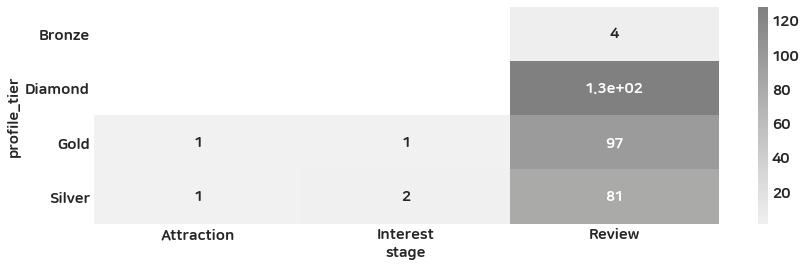

weekdays        0    1    2    3    4    5     6
profile_tier                                    
Bronze          2    1    2    4    1    4     4
Diamond       924  838  778  803  989  987  1151
Gold          426  355  363  377  424  464   519
Silver        141  121  127  129   99  119   123


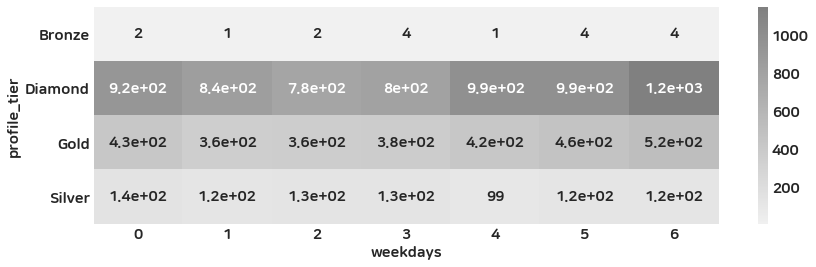

sign_hours       0      1      2      3      4      5      6      7      8   \
profile_tier                                                                  
Bronze          1.0    1.0    1.0    NaN    NaN    NaN    2.0    5.0    2.0   
Diamond       163.0  215.0  224.0  266.0  251.0  297.0  255.0  290.0  262.0   
Gold          116.0  109.0  133.0  106.0  156.0  133.0  138.0  109.0  108.0   
Silver         54.0   31.0   46.0   45.0   57.0   41.0   42.0   40.0   30.0   

sign_hours       9   ...     14     15     16     17     18     19     20  \
profile_tier         ...                                                    
Bronze          NaN  ...    NaN    NaN    NaN    1.0    NaN    1.0    1.0   
Diamond       286.0  ...  542.0  504.0  365.0  247.0  189.0  129.0  104.0   
Gold          101.0  ...  204.0  194.0  163.0  119.0   86.0   65.0   69.0   
Silver         19.0  ...   34.0   40.0   32.0   32.0   26.0   32.0   31.0   

sign_hours       21     22     23  
profile_tier              

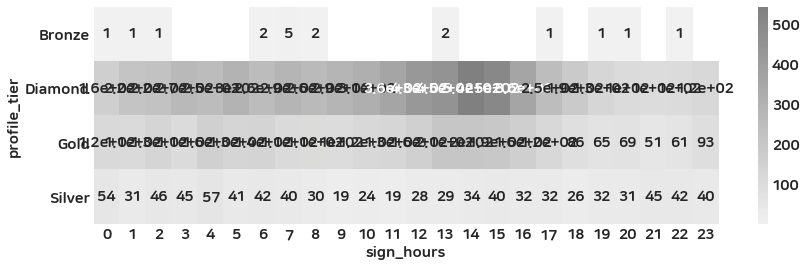

profile_tier  Bronze  Diamond    Gold  Silver
body_type                                    
BF00             1.0    398.0   128.0    30.0
BF01             NaN   1270.0   265.0    37.0
BF02             6.0   3169.0  1209.0   213.0
BF03             2.0    600.0   271.0    81.0
BF04             4.0    365.0   255.0   201.0
BF05             5.0    661.0   799.0   297.0
BM00             NaN      1.0     NaN     NaN
BM02             NaN      6.0     1.0     NaN


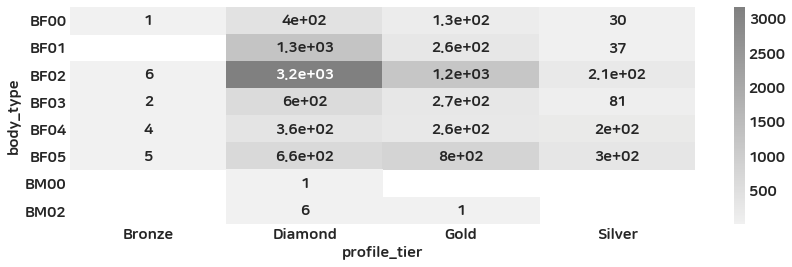

body_type   BF00    BF01    BF02    BF03    BF04    BF05  BM00  BM02  BM04
body_type                                                                 
BF00       766.0     NaN     NaN     NaN     NaN     NaN   NaN   NaN   NaN
BF01         NaN  1946.0     NaN     NaN     NaN     NaN   NaN   NaN   NaN
BF02         NaN     NaN  5497.0     NaN     NaN     NaN   NaN   NaN   NaN
BF03         NaN     NaN     NaN  1178.0     NaN     NaN   NaN   NaN   NaN
BF04         NaN     NaN     NaN     NaN  1009.0     NaN   NaN   NaN   NaN
BF05         NaN     NaN     NaN     NaN     NaN  2034.0   NaN   NaN   NaN
BM00         NaN     NaN     NaN     NaN     NaN     NaN   2.0   NaN   NaN
BM02         NaN     NaN     NaN     NaN     NaN     NaN   NaN   8.0   NaN
BM04         NaN     NaN     NaN     NaN     NaN     NaN   NaN   NaN   2.0


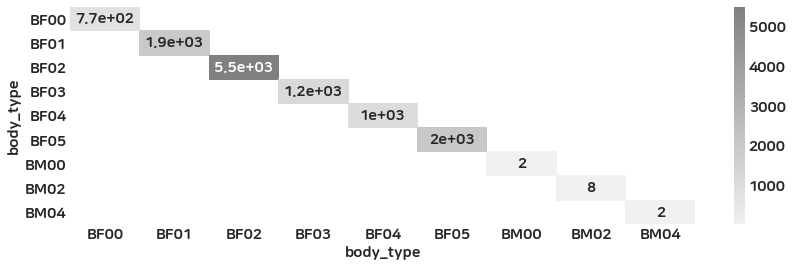

blood_type      A     AB      B      O
body_type                             
BF00         37.0   11.0   41.0   44.0
BF01        149.0   51.0  114.0  147.0
BF02        388.0  152.0  300.0  392.0
BF03         93.0   29.0   83.0   90.0
BF04         61.0   31.0   48.0   85.0
BF05        189.0   61.0  146.0  194.0
BM02          NaN    1.0    1.0    NaN


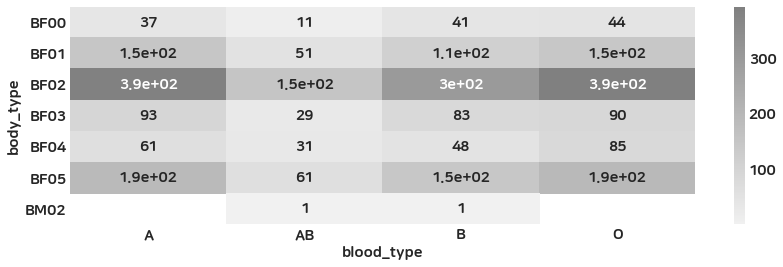

education   UE01   UE02    UE03   UE04  UE05   UE06
body_type                                          
BF00       196.0   90.0   371.0   27.0   5.0   65.0
BF01       285.0  271.0  1093.0  110.0  10.0  142.0
BF02       988.0  897.0  2862.0  210.0  24.0  448.0
BF03       229.0  179.0   618.0   51.0   8.0   77.0
BF04       302.0   83.0   480.0   30.0   6.0  100.0
BF05       555.0  414.0   812.0   50.0   7.0  159.0
BM00         NaN    NaN     2.0    NaN   NaN    NaN
BM02         2.0    1.0     3.0    1.0   NaN    1.0
BM04         1.0    NaN     NaN    NaN   NaN    1.0


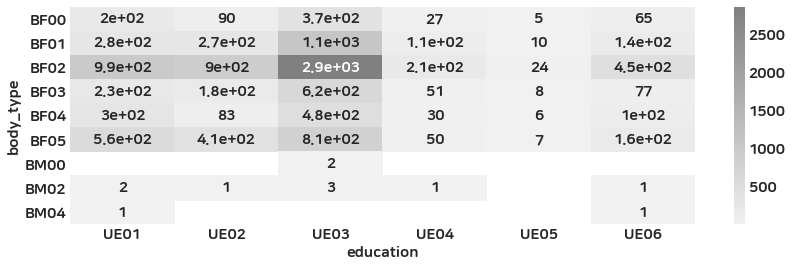

religion     UR00    UR01   UR02   UR03  UR04  UR05  UR06  UR07  UR08  UR09  \
body_type                                                                     
BF00        490.0   154.0   28.0   52.0   1.0   7.0   2.0   NaN   NaN   NaN   
BF01       1249.0   379.0   61.0  147.0   1.0  25.0  13.0   3.0   2.0   NaN   
BF02       3501.0  1144.0  178.0  429.0   NaN  44.0  23.0   3.0   1.0   1.0   
BF03        719.0   269.0   31.0   80.0   1.0   8.0   3.0   1.0   1.0   1.0   
BF04        530.0   271.0   34.0   93.0   NaN   3.0   2.0   NaN   NaN   NaN   
BF05       1294.0   376.0   90.0  162.0   1.0  21.0   8.0   1.0   NaN   NaN   
BM00          2.0     NaN    NaN    NaN   NaN   NaN   NaN   NaN   NaN   NaN   
BM02          4.0     2.0    1.0    NaN   NaN   NaN   NaN   NaN   NaN   NaN   
BM04          1.0     NaN    NaN    NaN   NaN   NaN   NaN   NaN   NaN   NaN   

religion   UR10  UR11   UR99  
body_type                     
BF00        NaN   1.0   31.0  
BF01        1.0   2.0   62.0  
BF02  

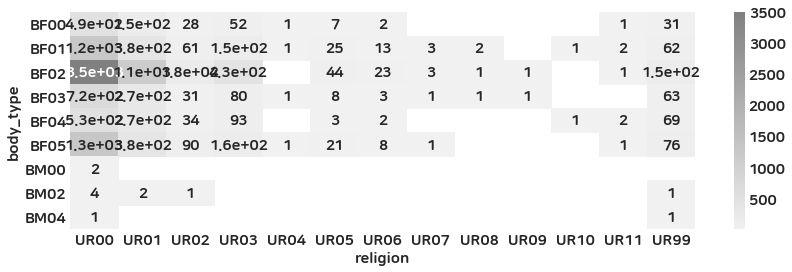

smoking     SM00   SM01    SM02
body_type                      
BF00        56.0   82.0   628.0
BF01        97.0  227.0  1620.0
BF02       240.0  649.0  4585.0
BF03        57.0  163.0   956.0
BF04        64.0  166.0   775.0
BF05       178.0  297.0  1555.0
BM00         NaN    1.0     1.0
BM02         2.0    NaN     6.0
BM04         1.0    NaN     1.0


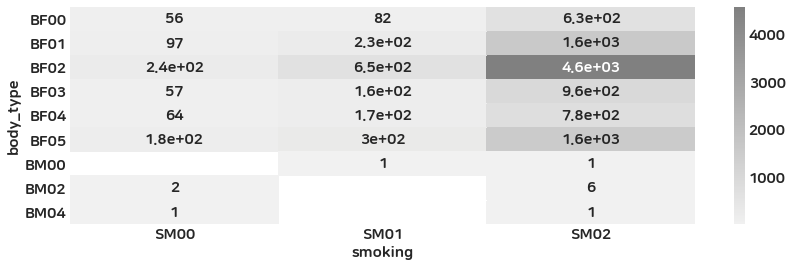

drinking    DR00    DR01    DR02
body_type                       
BF00        75.0   473.0   218.0
BF01       126.0  1431.0   388.0
BF02       381.0  4065.0  1030.0
BF03        91.0   891.0   194.0
BF04        78.0   725.0   202.0
BF05       216.0  1448.0   366.0
BM00         NaN     2.0     NaN
BM02         1.0     4.0     3.0
BM04         NaN     2.0     NaN


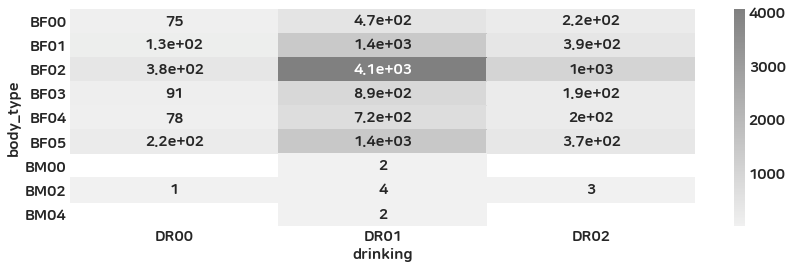

region      AE   AL   AR    AU   AZ   BE   BH   BO   BR   BY  ...   TH   TN  \
body_type                                                     ...             
BF00       NaN  NaN  NaN   2.0  NaN  NaN  1.0  1.0  4.0  NaN  ...  3.0  NaN   
BF01       3.0  NaN  NaN   3.0  NaN  NaN  NaN  1.0  NaN  NaN  ...  2.0  NaN   
BF02       9.0  NaN  4.0  10.0  NaN  NaN  NaN  NaN  3.0  1.0  ...  4.0  1.0   
BF03       NaN  NaN  NaN   2.0  1.0  1.0  NaN  NaN  NaN  NaN  ...  2.0  NaN   
BF04       NaN  1.0  2.0   4.0  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  1.0   
BF05       2.0  NaN  NaN   1.0  NaN  NaN  NaN  NaN  1.0  NaN  ...  1.0  NaN   
BM00       NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
BM02       NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
BM04       NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   

region      TR   TT   TW   TZ   UA      US   VN   ZA  
body_type                                             
BF00       1.0  NaN 

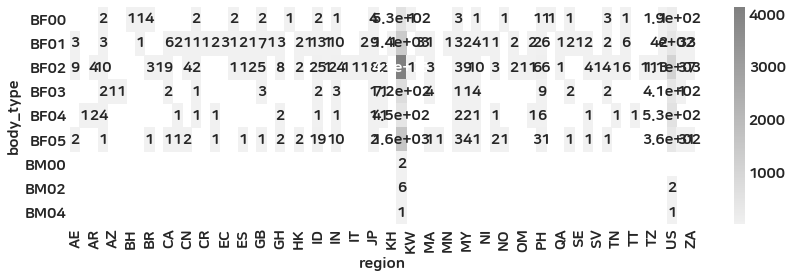

current_region    AE   AL   AR   AT    AU   AZ   BD   BE   BH   BJ  ...   TR  \
body_type                                                           ...        
BF00             1.0  NaN  1.0  NaN   1.0  NaN  NaN  NaN  1.0  NaN  ...  1.0   
BF01             3.0  NaN  2.0  NaN   5.0  NaN  2.0  NaN  NaN  1.0  ...  5.0   
BF02            13.0  NaN  9.0  1.0  12.0  1.0  1.0  NaN  NaN  1.0  ...  3.0   
BF03             NaN  NaN  NaN  NaN   3.0  1.0  NaN  1.0  NaN  NaN  ...  1.0   
BF04             NaN  1.0  3.0  NaN   4.0  NaN  NaN  NaN  NaN  1.0  ...  NaN   
BF05             3.0  NaN  NaN  NaN   1.0  NaN  NaN  NaN  NaN  NaN  ...  NaN   
BM00             NaN  NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
BM02             NaN  NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
BM04             NaN  NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   

current_region   TT   TW   TZ   UA     US   VE   VN   ZA   ZW  
body_type                                              

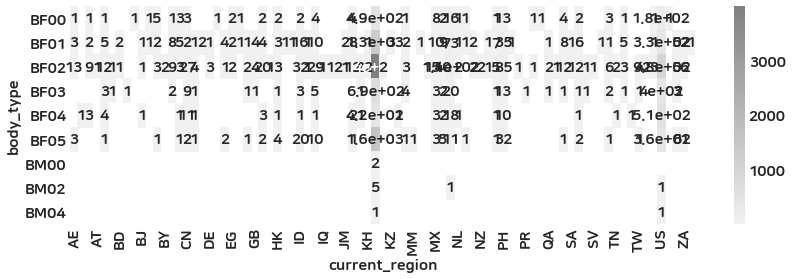

language    ar   de      en    es   fr    in   iw   ja      ko   nb   pt   ru  \
body_type                                                                       
BF00       NaN  NaN   237.0  21.0  2.0   1.0  NaN  NaN   492.0  NaN  4.0  5.0   
BF01       1.0  NaN   578.0  26.0  2.0   7.0  1.0  NaN  1314.0  NaN  2.0  7.0   
BF02       NaN  NaN  1437.0  30.0  3.0  14.0  1.0  NaN  3987.0  NaN  5.0  5.0   
BF03       NaN  1.0   489.0   5.0  2.0   NaN  NaN  NaN   679.0  NaN  NaN  NaN   
BF04       NaN  NaN   577.0   9.0  1.0   NaN  NaN  NaN   420.0  NaN  NaN  NaN   
BF05       NaN  NaN   456.0  11.0  1.0  12.0  NaN  1.0  1548.0  1.0  NaN  1.0   
BM00       NaN  NaN     NaN   NaN  NaN   NaN  NaN  NaN     2.0  NaN  NaN  NaN   
BM02       NaN  NaN     3.0   NaN  NaN   NaN  NaN  NaN     5.0  NaN  NaN  NaN   
BM04       NaN  NaN     1.0   NaN  NaN   NaN  NaN  NaN     1.0  NaN  NaN  NaN   

language    sq   th   tr   uk   vi    zh  
body_type                                 
BF00       NaN  1.0  1

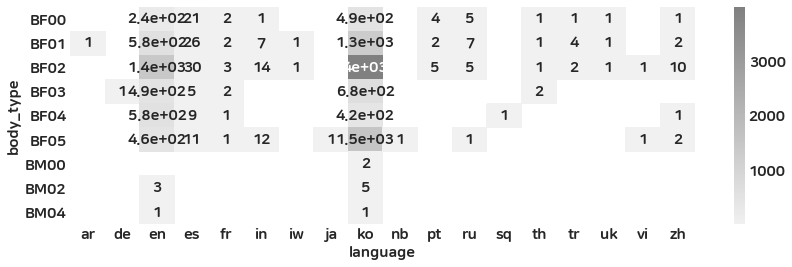

is_out          N       Y
body_type                
BF00        474.0   292.0
BF01       1155.0   791.0
BF02       3233.0  2264.0
BF03        729.0   449.0
BF04        689.0   320.0
BF05       1216.0   818.0
BM00          NaN     2.0
BM02          7.0     1.0
BM04          1.0     1.0


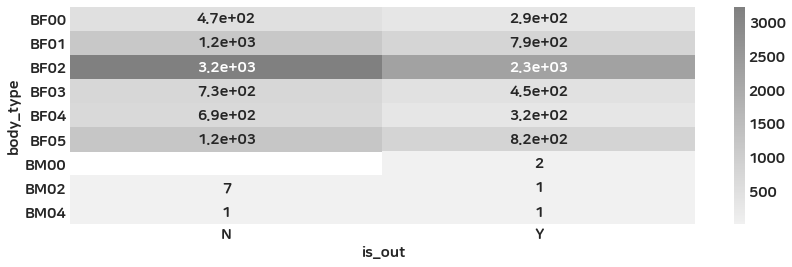

is_deactivated       N       Y
body_type                     
BF00             282.0   484.0
BF01             883.0  1063.0
BF02            2661.0  2836.0
BF03             564.0   614.0
BF04             439.0   570.0
BF05            1030.0  1004.0
BM00               1.0     1.0
BM02               3.0     5.0
BM04               NaN     2.0


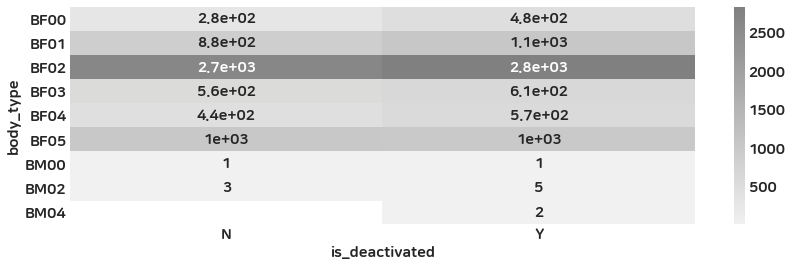

is_blocked    Y
body_type      
BF00         75
BF01        124
BF02        193
BF03         91
BF04         80
BF05          3


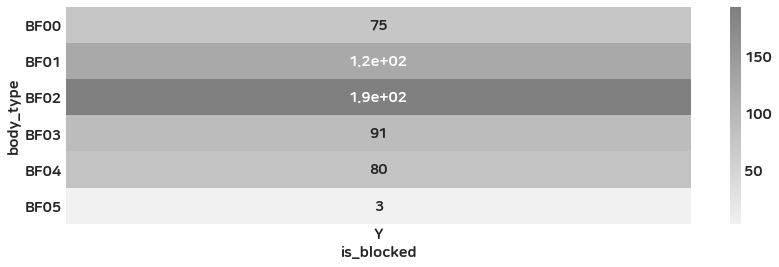

is_confirm      N       Y
body_type                
BF00         67.0   557.0
BF01         97.0  1573.0
BF02        187.0  4597.0
BF03         61.0   954.0
BF04         51.0   825.0
BF05         19.0  1762.0
BM00          NaN     1.0
BM02          NaN     7.0


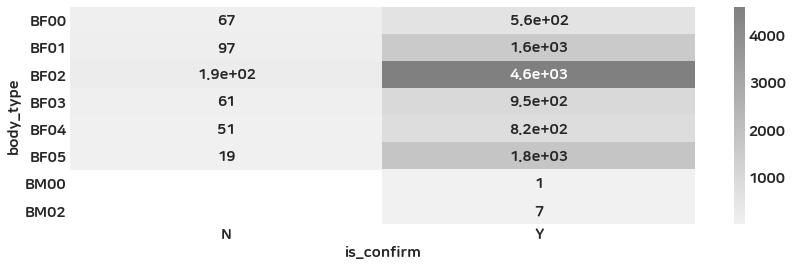

sign_up_completed       N       Y
body_type                        
BF00                233.0   533.0
BF01                419.0  1527.0
BF02               1020.0  4477.0
BF03                260.0   918.0
BF04                227.0   782.0
BF05                319.0  1715.0
BM00                  1.0     1.0
BM02                  1.0     7.0
BM04                  2.0     NaN


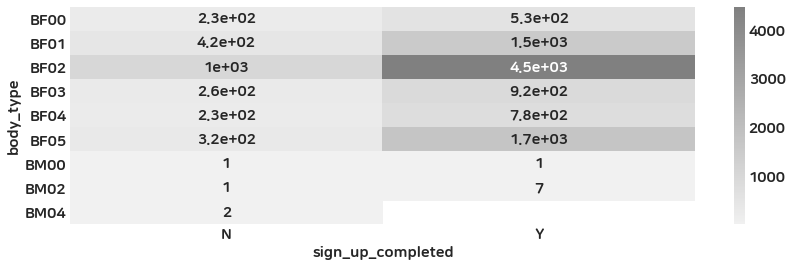

stage      Attraction  Drinking  Education  Height  Interest   Job  \
body_type                                                            
BF00              NaN       NaN        NaN     NaN       NaN   NaN   
BF01              1.0       1.0        NaN     1.0       NaN   2.0   
BF02              NaN       NaN        2.0     1.0       3.0  15.0   
BF03              NaN       1.0        NaN     NaN       NaN   1.0   
BF04              1.0       1.0        2.0     NaN       NaN   2.0   
BF05              NaN       NaN        NaN     NaN       NaN   6.0   
BM00              NaN       NaN        NaN     NaN       NaN   NaN   
BM02              NaN       NaN        NaN     NaN       NaN   NaN   
BM04              NaN       NaN        NaN     NaN       NaN   NaN   

stage      MatchSetting  Picture  ProfileEdit  Religion  Review  Smoking  
body_type                                                                 
BF00                4.0     32.0         59.0       NaN   138.0      NaN  
BF01

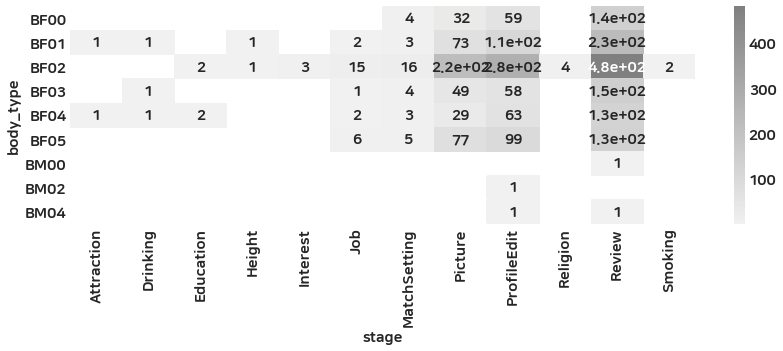

weekdays       0      1      2      3      4      5      6
body_type                                                 
BF00       131.0   90.0  102.0   86.0  113.0  130.0  114.0
BF01       260.0  257.0  232.0  217.0  333.0  301.0  346.0
BF02       764.0  687.0  661.0  757.0  799.0  851.0  978.0
BF03       187.0  133.0  145.0  144.0  177.0  209.0  183.0
BF04       154.0  138.0  138.0  125.0  145.0  159.0  150.0
BF05       315.0  266.0  250.0  269.0  284.0  327.0  323.0
BM00         NaN    NaN    1.0    1.0    NaN    NaN    NaN
BM02         1.0    1.0    2.0    NaN    1.0    1.0    2.0
BM04         2.0    NaN    NaN    NaN    NaN    NaN    NaN


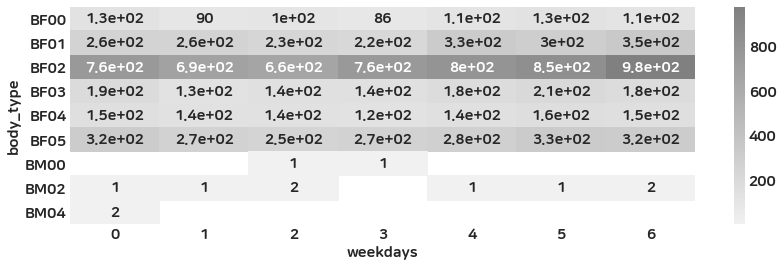

sign_hours     0      1      2      3      4      5      6      7      8   \
body_type                                                                   
BF00         37.0   17.0   31.0   35.0   38.0   36.0   25.0   34.0   30.0   
BF01         56.0   69.0   55.0   78.0   92.0   88.0   79.0   79.0   84.0   
BF02        156.0  180.0  209.0  226.0  215.0  228.0  207.0  218.0  221.0   
BF03         33.0   49.0   51.0   52.0   45.0   39.0   52.0   53.0   53.0   
BF04         51.0   39.0   59.0   45.0   48.0   52.0   48.0   60.0   49.0   
BF05         75.0   63.0   82.0   70.0   91.0   81.0   96.0   76.0   76.0   
BM00          NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
BM02          NaN    NaN    NaN    NaN    NaN    NaN    NaN    1.0    NaN   
BM04          NaN    NaN    NaN    NaN    1.0    NaN    NaN    NaN    NaN   

sign_hours     9   ...     14     15     16     17     18     19     20    21  \
body_type          ...                                                 

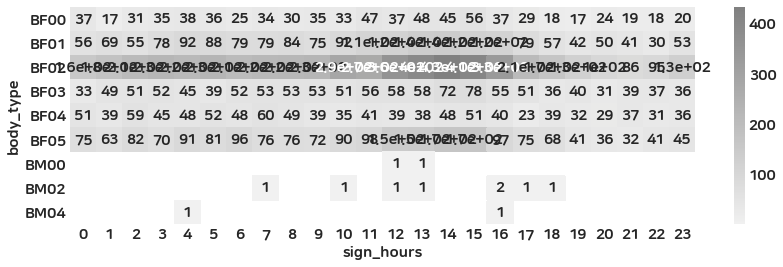

profile_tier  Bronze  Diamond   Gold  Silver
blood_type                                  
A                1.0    522.0  286.0    67.0
AB               NaN    186.0   97.0    39.0
B                1.0    453.0  201.0    46.0
O                2.0    550.0  285.0    86.0


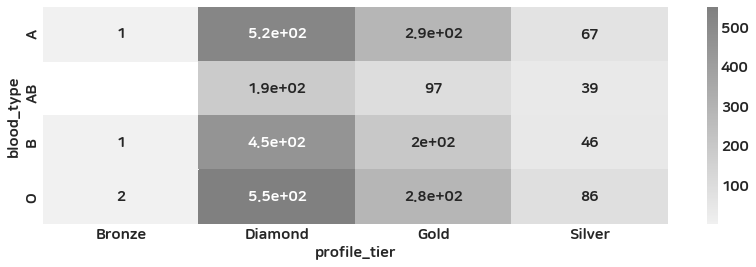

body_type   BF00   BF01   BF02  BF03  BF04   BF05  BM02
blood_type                                             
A           37.0  149.0  388.0  93.0  61.0  189.0   NaN
AB          11.0   51.0  152.0  29.0  31.0   61.0   1.0
B           41.0  114.0  300.0  83.0  48.0  146.0   1.0
O           44.0  147.0  392.0  90.0  85.0  194.0   NaN


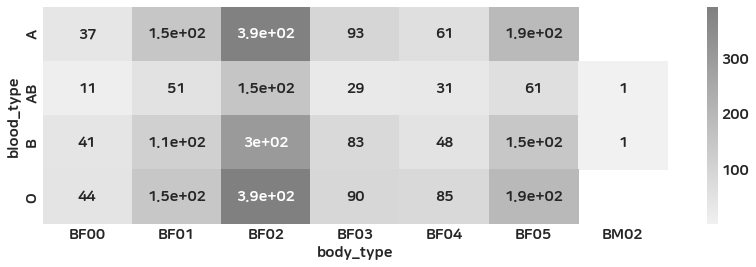

blood_type      A     AB      B      O
blood_type                            
A           917.0    NaN    NaN    NaN
AB            NaN  336.0    NaN    NaN
B             NaN    NaN  733.0    NaN
O             NaN    NaN    NaN  952.0


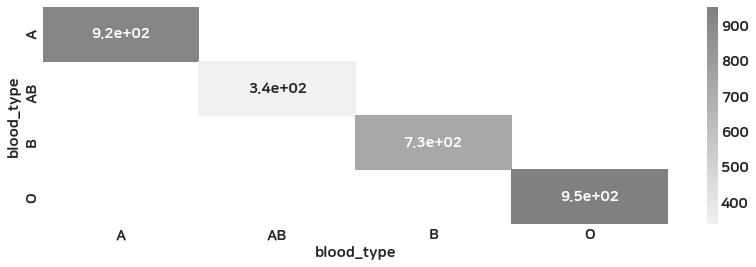

education   UE01  UE02  UE03  UE04  UE05  UE06
blood_type                                    
A            211   160   430    47     5    59
AB            81    53   168     6     2    24
B            145   139   350    32     2    57
O            195   136   508    37     3    69


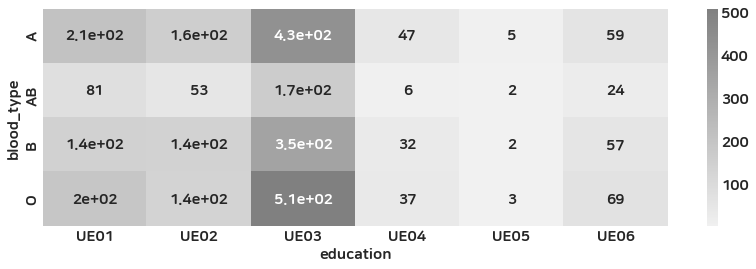

religion     UR00   UR01  UR02  UR03  UR04  UR05  UR06  UR07  UR08  UR09  \
blood_type                                                                 
A           549.0  226.0  37.0  74.0   NaN   5.0   2.0   NaN   1.0   NaN   
AB          199.0   74.0  10.0  36.0   NaN   1.0   3.0   1.0   NaN   NaN   
B           453.0  164.0  31.0  47.0   1.0  13.0   2.0   NaN   NaN   NaN   
O           545.0  208.0  35.0  99.0   NaN  14.0   2.0   1.0   1.0   1.0   

religion    UR10  UR11  UR99  
blood_type                    
A            NaN   1.0  22.0  
AB           NaN   1.0  11.0  
B            NaN   NaN  22.0  
O            1.0   NaN  45.0  


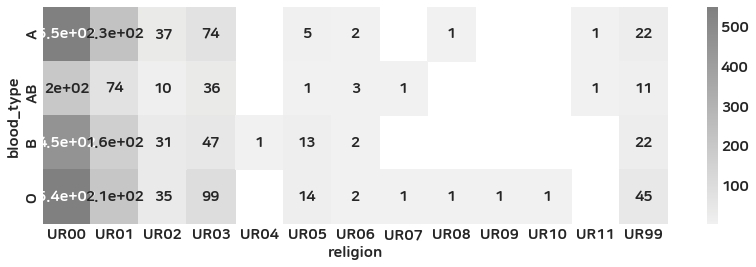

smoking     SM00  SM01  SM02
blood_type                  
A             53    86   778
AB            11    58   267
B             35    90   608
O             40   122   790


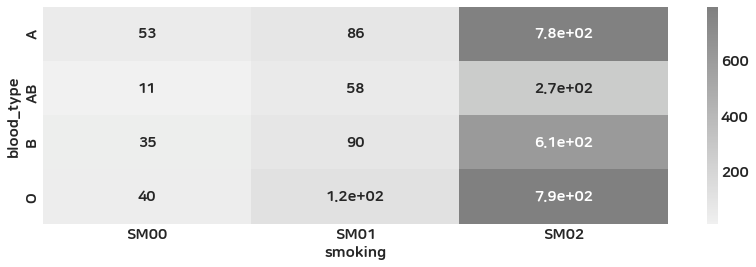

drinking    DR00  DR01  DR02
blood_type                  
A             51   682   184
AB            23   252    61
B             42   540   151
O             61   727   164


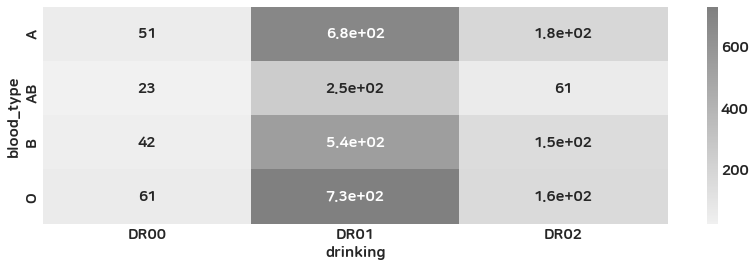

region       AU   AZ   BE   BO   CA   CL   CN   CO   DE   ES  ...   MY   NG  \
blood_type                                                    ...             
A           2.0  1.0  NaN  1.0  5.0  NaN  NaN  1.0  NaN  NaN  ...  1.0  1.0   
AB          NaN  NaN  1.0  NaN  NaN  NaN  1.0  NaN  1.0  1.0  ...  NaN  NaN   
B           1.0  NaN  NaN  NaN  2.0  NaN  2.0  NaN  NaN  NaN  ...  1.0  1.0   
O           NaN  NaN  NaN  NaN  1.0  1.0  NaN  NaN  NaN  NaN  ...  5.0  3.0   

region       NP    PH   RU   SG   TH   TR   TZ     US  
blood_type                                             
A           2.0  11.0  NaN  1.0  NaN  NaN  NaN  217.0  
AB          NaN   2.0  NaN  NaN  NaN  NaN  NaN   97.0  
B           NaN   4.0  1.0  NaN  1.0  1.0  NaN  103.0  
O           NaN  18.0  NaN  NaN  2.0  1.0  1.0  264.0  

[4 rows x 32 columns]


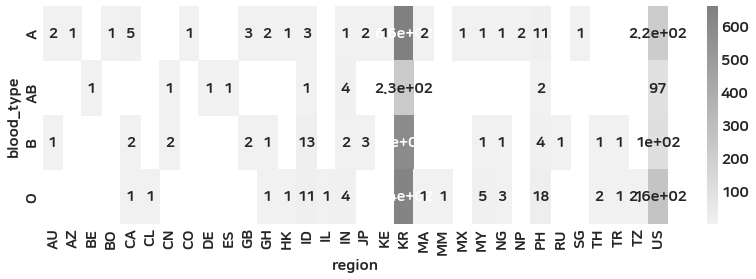

current_region   AE   AR   AU   AZ   BE   BJ   BO   BR   CA   CL  ...   RS  \
blood_type                                                        ...        
A               1.0  NaN  3.0  1.0  NaN  2.0  1.0  1.0  5.0  2.0  ...  NaN   
AB              NaN  1.0  NaN  NaN  1.0  NaN  NaN  NaN  1.0  NaN  ...  NaN   
B               NaN  NaN  1.0  NaN  NaN  NaN  NaN  NaN  3.0  NaN  ...  NaN   
O               1.0  NaN  1.0  NaN  NaN  NaN  NaN  NaN  NaN  2.0  ...  1.0   

current_region   RU   SG   TH   TN   TR   TW   TZ     US   VN  
blood_type                                                     
A               NaN  2.0  1.0  1.0  3.0  NaN  NaN  184.0  NaN  
AB              NaN  NaN  NaN  NaN  NaN  NaN  NaN   90.0  NaN  
B               1.0  NaN  NaN  NaN  NaN  NaN  NaN   97.0  NaN  
O               NaN  NaN  2.0  NaN  1.0  1.0  1.0  259.0  1.0  

[4 rows x 46 columns]


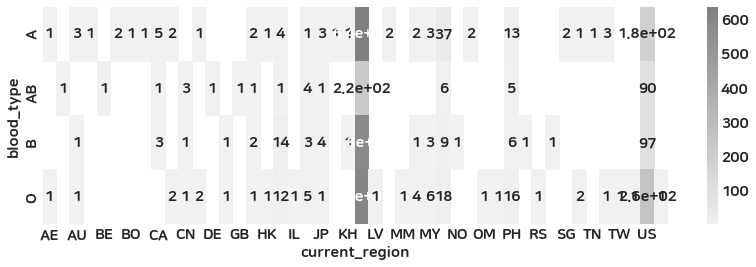

language     de     en   es   fr   in   iw     ko   pt   ru   th   tr   zh
blood_type                                                                
A           NaN  281.0  7.0  1.0  2.0  NaN  621.0  1.0  1.0  NaN  2.0  1.0
AB          1.0  110.0  2.0  NaN  NaN  NaN  222.0  NaN  NaN  NaN  NaN  1.0
B           NaN  153.0  3.0  NaN  5.0  NaN  569.0  NaN  2.0  NaN  NaN  1.0
O           NaN  341.0  7.0  2.0  7.0  1.0  592.0  NaN  NaN  1.0  1.0  NaN


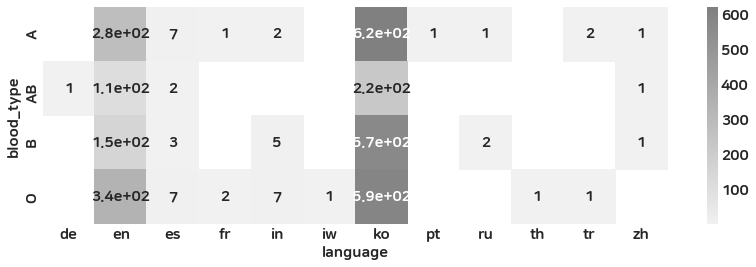

is_out        N    Y
blood_type          
A           600  317
AB          214  122
B           437  296
O           586  366


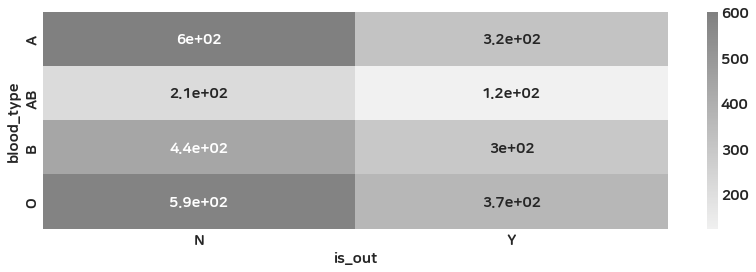

is_deactivated    N    Y
blood_type              
A               534  383
AB              184  152
B               439  294
O               550  402


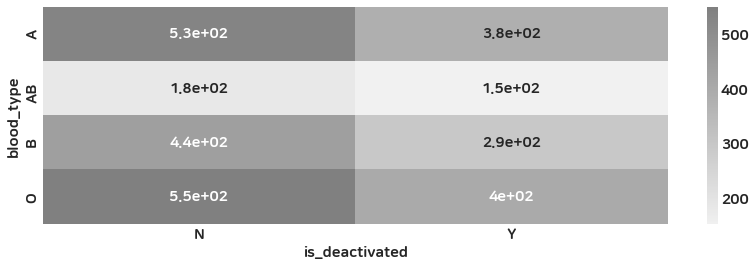

is_blocked  Y
blood_type   
A           3
AB          6
B           5
O           8


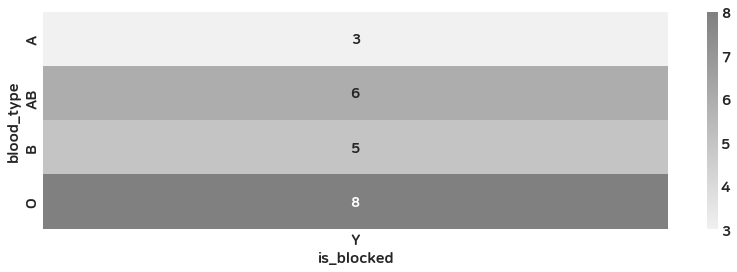

is_confirm   N    Y
blood_type         
A           14  876
AB           5  322
B           13  701
O            9  923


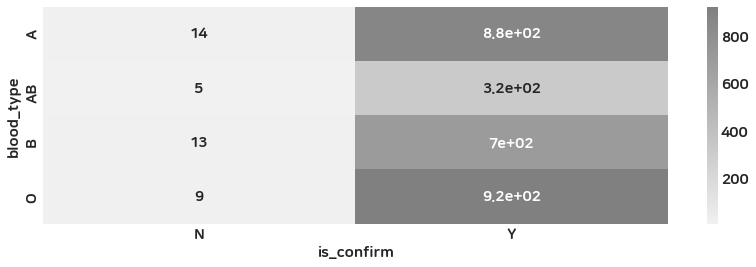

sign_up_completed   N    Y
blood_type                
A                  62  855
AB                 19  317
B                  39  694
O                  47  905


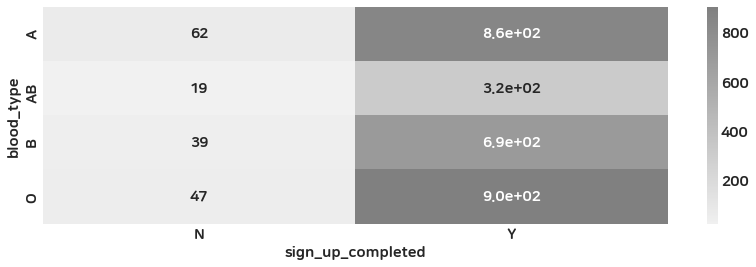

stage       ProfileEdit  Review
blood_type                     
A                    14      48
AB                    6      13
B                    10      29
O                    10      37


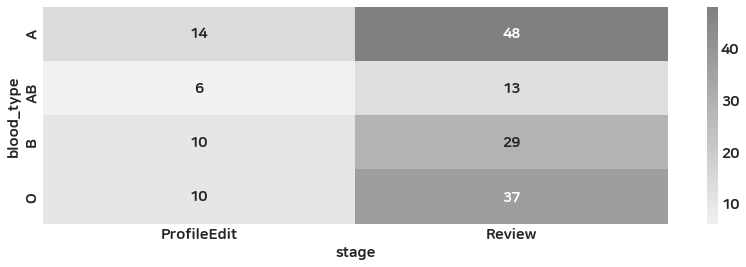

weekdays      0    1    2    3    4    5    6
blood_type                                   
A           136  103  109  119  127  145  178
AB           57   49   39   42   39   46   64
B           101  106   93   86   95  117  135
O           137  123  136  121  135  142  158


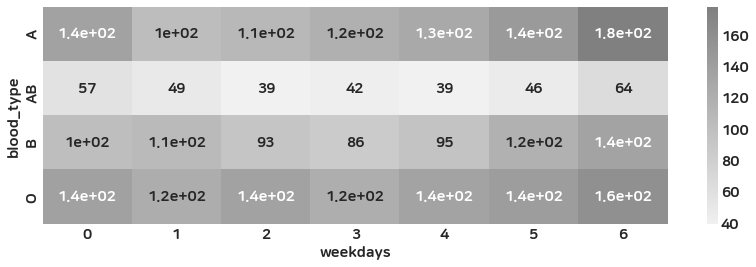

sign_hours  0   1   2   3   4   5   6   7   8   9   ...  14  15  16  17  18  \
blood_type                                          ...                       
A           30  28  31  40  45  37  47  29  32  38  ...  67  56  59  39  21   
AB          10  14  11   9  17  16  13  17  15  11  ...  22  17  19  13   7   
B           27  32  26  28  30  32  26  40  29  19  ...  65  48  41  35  25   
O           39  30  36  45  47  45  43  45  35  32  ...  72  59  52  41  32   

sign_hours  19  20  21  22  23  
blood_type                      
A           24  18  24  18  25  
AB          11   8   8  15  12  
B           17  11  11   9  13  
O           31  22  20  19  21  

[4 rows x 24 columns]


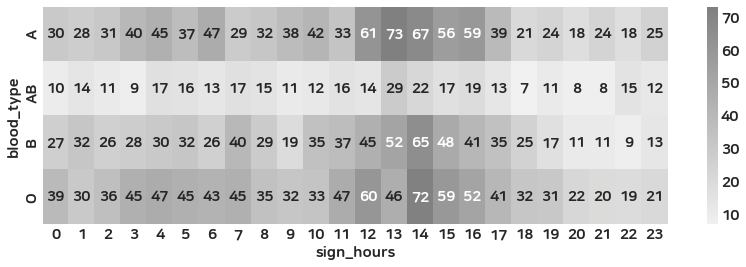

profile_tier  Bronze  Diamond    Gold  Silver
education                                    
UE01            11.0    973.0   683.0   338.0
UE02             1.0   1138.0   480.0    63.0
UE03             5.0   3508.0  1425.0   346.0
UE04             NaN    274.0    96.0    24.0
UE05             NaN     33.0    13.0     2.0
UE06             1.0    464.0   197.0    73.0


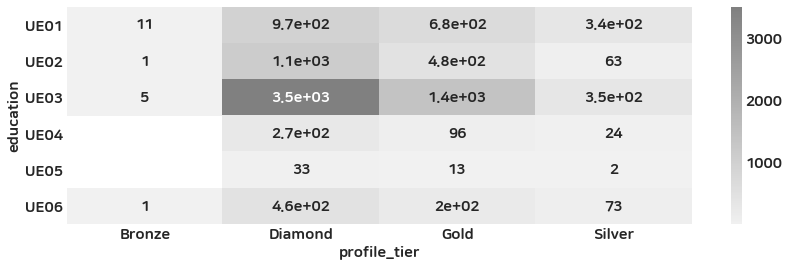

body_type   BF00    BF01    BF02   BF03   BF04   BF05  BM00  BM02  BM04
education                                                              
UE01       196.0   285.0   988.0  229.0  302.0  555.0   NaN   2.0   1.0
UE02        90.0   271.0   897.0  179.0   83.0  414.0   NaN   1.0   NaN
UE03       371.0  1093.0  2862.0  618.0  480.0  812.0   2.0   3.0   NaN
UE04        27.0   110.0   210.0   51.0   30.0   50.0   NaN   1.0   NaN
UE05         5.0    10.0    24.0    8.0    6.0    7.0   NaN   NaN   NaN
UE06        65.0   142.0   448.0   77.0  100.0  159.0   NaN   1.0   1.0


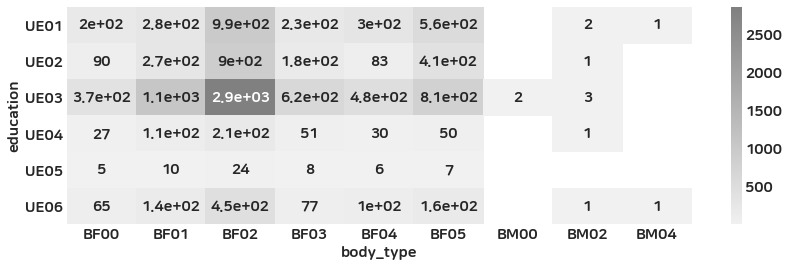

blood_type    A   AB    B    O
education                     
UE01        211   81  145  195
UE02        160   53  139  136
UE03        430  168  350  508
UE04         47    6   32   37
UE05          5    2    2    3
UE06         59   24   57   69


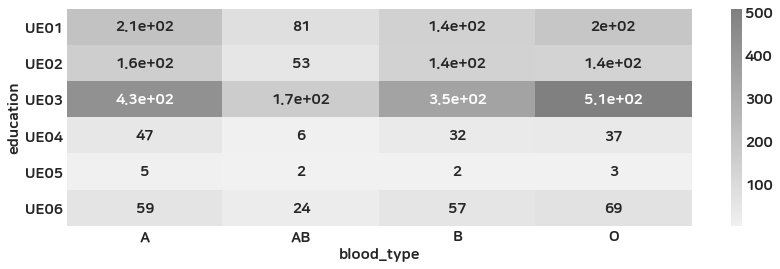

education    UE01    UE02    UE03   UE04  UE05   UE06
education                                            
UE01       2558.0     NaN     NaN    NaN   NaN    NaN
UE02          NaN  1935.0     NaN    NaN   NaN    NaN
UE03          NaN     NaN  6241.0    NaN   NaN    NaN
UE04          NaN     NaN     NaN  479.0   NaN    NaN
UE05          NaN     NaN     NaN    NaN  60.0    NaN
UE06          NaN     NaN     NaN    NaN   NaN  993.0


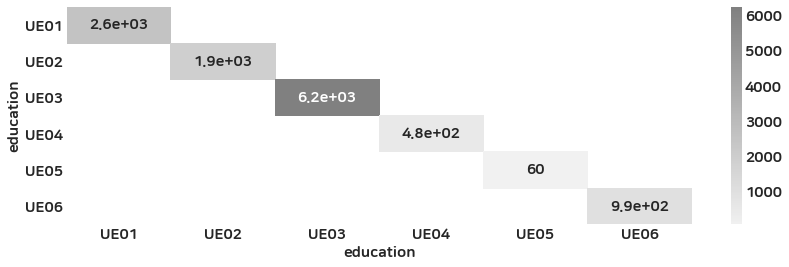

religion     UR00    UR01   UR02   UR03  UR04  UR05  UR06  UR07  UR08  UR09  \
education                                                                     
UE01       1503.0   597.0   83.0  193.0   NaN  27.0   9.0   1.0   2.0   NaN   
UE02       1453.0   287.0   77.0   90.0   NaN   3.0   5.0   NaN   NaN   NaN   
UE03       3911.0  1294.0  204.0  546.0   1.0  52.0  18.0   7.0   2.0   1.0   
UE04        224.0   147.0   16.0   54.0   2.0   8.0  13.0   NaN   NaN   NaN   
UE05         29.0    16.0    3.0    8.0   NaN   NaN   1.0   NaN   NaN   NaN   
UE06        586.0   216.0   33.0   57.0   1.0  17.0   5.0   NaN   NaN   NaN   

religion   UR10  UR11   UR99  
education                     
UE01        NaN   1.0  135.0  
UE02        NaN   NaN   17.0  
UE03        2.0   3.0  189.0  
UE04        NaN   1.0   14.0  
UE05        NaN   NaN    3.0  
UE06        NaN   1.0   74.0  


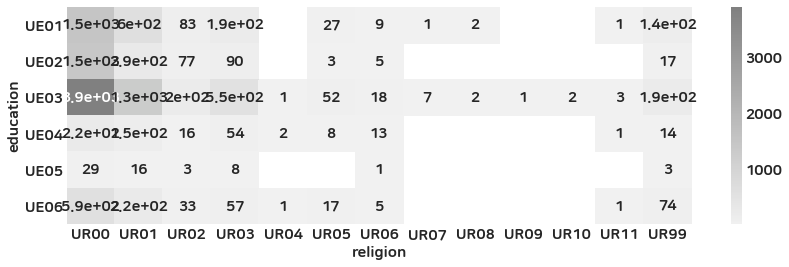

smoking    SM00  SM01  SM02
education                  
UE01        310   509  1731
UE02         82   248  1602
UE03        190   602  5436
UE04         13    44   422
UE05          2     8    50
UE06         87   151   751


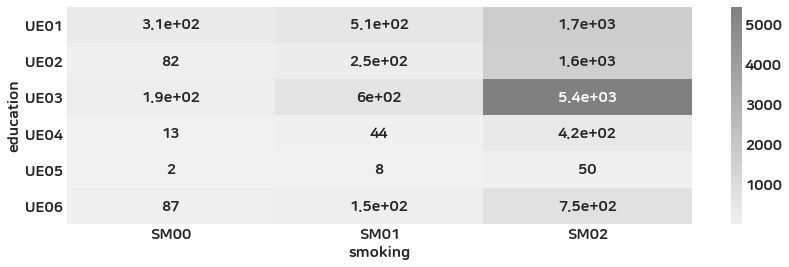

drinking   DR00  DR01  DR02
education                  
UE01        243  1603   705
UE02        166  1524   242
UE03        429  4767  1033
UE04         36   325   118
UE05          3    39    18
UE06         76   667   247


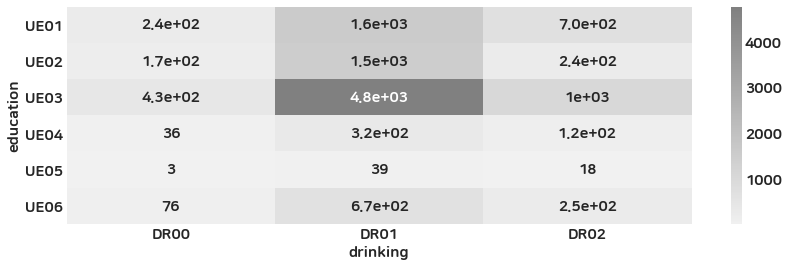

region      AE   AL   AR    AU   AZ   BE   BH   BO   BR   BY  ...   TH   TN  \
education                                                     ...             
UE01       2.0  NaN  4.0   5.0  1.0  1.0  NaN  1.0  3.0  NaN  ...  5.0  NaN   
UE02       NaN  NaN  NaN   1.0  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
UE03       8.0  NaN  NaN  10.0  NaN  NaN  1.0  1.0  3.0  NaN  ...  6.0  NaN   
UE04       NaN  1.0  NaN   1.0  NaN  NaN  NaN  NaN  NaN  1.0  ...  NaN  NaN   
UE05       NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  1.0   
UE06       2.0  NaN  2.0   5.0  NaN  NaN  NaN  NaN  2.0  NaN  ...  1.0  1.0   

region      TR   TT   TW   TZ   UA      US   VN   ZA  
education                                             
UE01       1.0  1.0  NaN  NaN  NaN  1025.0  3.0  3.0  
UE02       NaN  NaN  NaN  NaN  1.0    97.0  1.0  NaN  
UE03       8.0  NaN  1.0  NaN  2.0  1397.0  3.0  6.0  
UE04       1.0  NaN  NaN  NaN  3.0   134.0  1.0  1.0  
UE05       1.0  NaN  NaN  NaN  NaN   

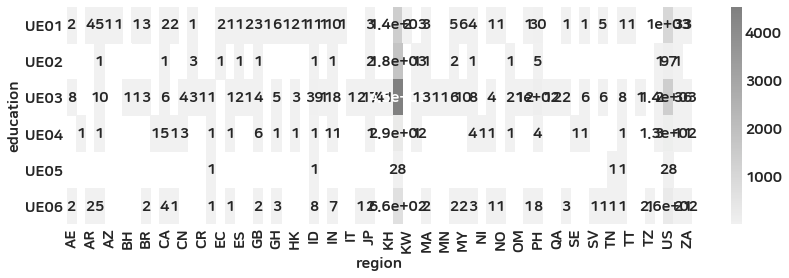

current_region    AE   AL   AR   AT    AU   AZ   BD   BE   BH   BJ  ...   TR  \
education                                                           ...        
UE01             2.0  NaN  7.0  NaN   6.0  2.0  NaN  1.0  NaN  NaN  ...  4.0   
UE02             NaN  NaN  1.0  NaN   2.0  NaN  NaN  NaN  NaN  NaN  ...  1.0   
UE03            13.0  NaN  2.0  1.0  12.0  NaN  1.0  NaN  1.0  1.0  ...  3.0   
UE04             NaN  1.0  NaN  NaN   3.0  NaN  NaN  NaN  NaN  2.0  ...  1.0   
UE05             NaN  NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
UE06             3.0  NaN  5.0  NaN   3.0  NaN  2.0  NaN  NaN  NaN  ...  1.0   

current_region   TT   TW   TZ   UA      US   VE   VN   ZA   ZW  
education                                                       
UE01            1.0  NaN  NaN  NaN   977.0  1.0  6.0  3.0  NaN  
UE02            NaN  NaN  NaN  NaN    95.0  NaN  1.0  NaN  NaN  
UE03            NaN  6.0  1.0  2.0  1296.0  NaN  9.0  4.0  1.0  
UE04            NaN  NaN  NaN  3.0

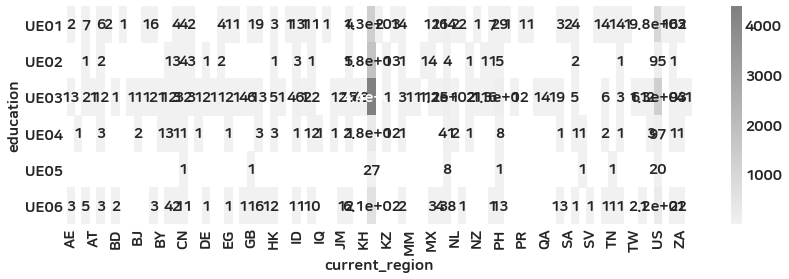

language    ar   de      en    es   fr    in   iw   ja      ko   nb   pt   ru  \
education                                                                       
UE01       1.0  NaN  1160.0  41.0  3.0   7.0  1.0  NaN  1327.0  NaN  6.0  4.0   
UE02       NaN  NaN   113.0  13.0  NaN   1.0  NaN  NaN  1805.0  NaN  NaN  2.0   
UE03       NaN  NaN  1854.0  30.0  4.0  18.0  1.0  1.0  4309.0  NaN  1.0  6.0   
UE04       NaN  NaN   220.0   1.0  1.0   NaN  NaN  NaN   249.0  NaN  NaN  3.0   
UE05       NaN  NaN    32.0   NaN  1.0   NaN  NaN  NaN    27.0  NaN  NaN  NaN   
UE06       NaN  1.0   326.0  15.0  2.0   8.0  NaN  NaN   630.0  1.0  4.0  3.0   

language    sq   th   tr   uk   vi   zh  
education                                
UE01       NaN  2.0  3.0  NaN  NaN  3.0  
UE02       NaN  NaN  1.0  NaN  NaN  NaN  
UE03       NaN  3.0  1.0  2.0  2.0  9.0  
UE04       1.0  NaN  1.0  1.0  NaN  2.0  
UE05       NaN  NaN  NaN  NaN  NaN  NaN  
UE06       NaN  NaN  1.0  NaN  NaN  2.0  


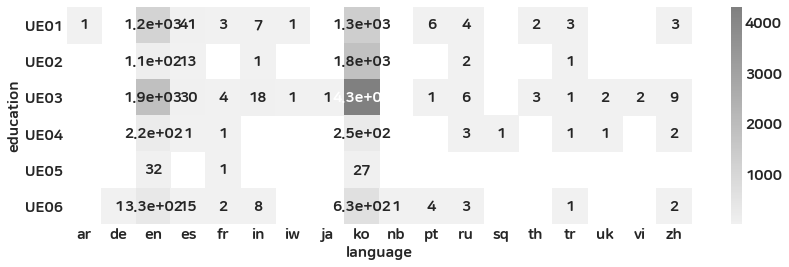

is_out        N     Y
education            
UE01       1674   884
UE02       1106   829
UE03       3605  2636
UE04        303   176
UE05         40    20
UE06        659   334


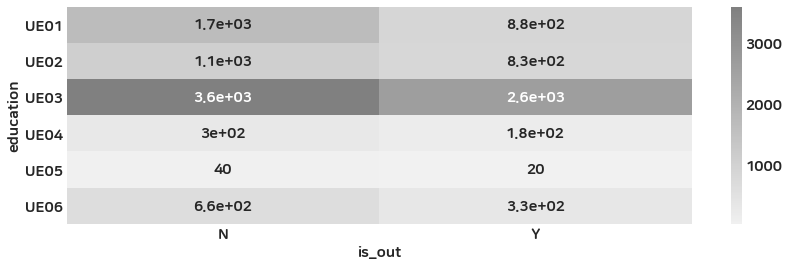

is_deactivated     N     Y
education                 
UE01            1119  1439
UE02             990   945
UE03            2974  3267
UE04             233   246
UE05              22    38
UE06             444   549


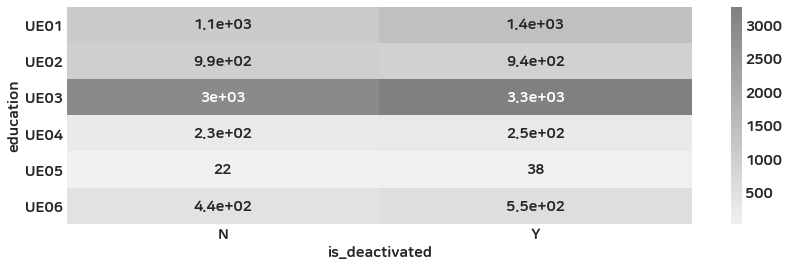

is_blocked    Y
education      
UE01         47
UE02        115
UE03        305
UE04          7
UE05          2
UE06         90


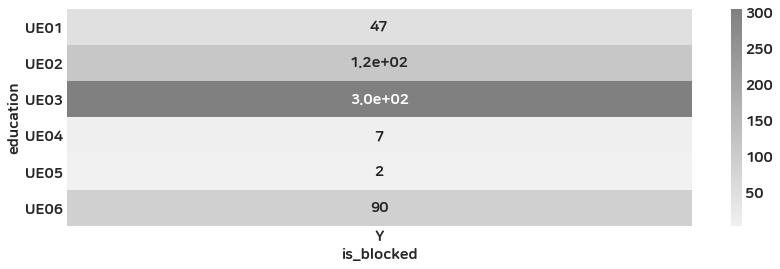

is_confirm    N     Y
education            
UE01         70  2005
UE02         72  1682
UE03        244  5285
UE04         13   394
UE05          2    48
UE06         79   735


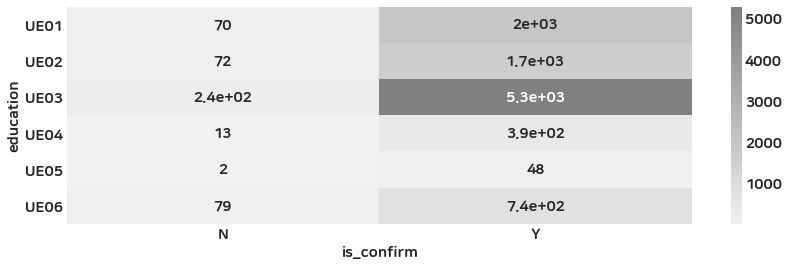

sign_up_completed     N     Y
education                    
UE01                658  1900
UE02                279  1656
UE03               1087  5154
UE04                 94   385
UE05                 14    46
UE06                296   697


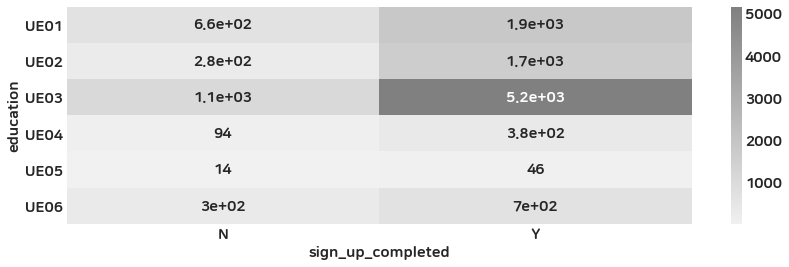

stage      Attraction  Drinking  Height  Interest   Job  MatchSetting  \
education                                                               
UE01              1.0       1.0     NaN       2.0   8.0          14.0   
UE02              NaN       NaN     NaN       NaN   3.0           6.0   
UE03              1.0       1.0     1.0       1.0  10.0          10.0   
UE04              NaN       NaN     1.0       NaN   NaN           1.0   
UE05              NaN       NaN     NaN       NaN   NaN           NaN   
UE06              NaN       1.0     NaN       NaN   3.0           4.0   

stage      Picture  ProfileEdit  Religion  Review  Smoking  
education                                                   
UE01         100.0        204.0       NaN   327.0      1.0  
UE02          81.0         57.0       1.0   131.0      NaN  
UE03         225.0        277.0       1.0   559.0      1.0  
UE04          23.0         25.0       NaN    44.0      NaN  
UE05           3.0          3.0       NaN     8.0

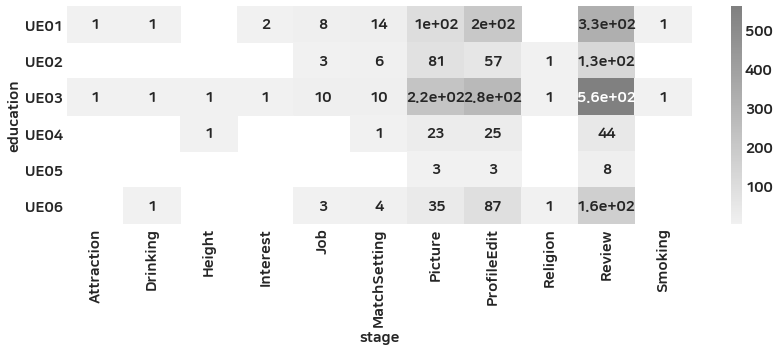

weekdays     0    1    2    3    4     5     6
education                                     
UE01       385  354  320  340  364   388   407
UE02       291  246  241  218  311   288   340
UE03       897  763  744  804  935  1043  1055
UE04        64   59   55   63   69    85    84
UE05         4    8    6    9   10    12    11
UE06       154  122  143  138  138   134   164


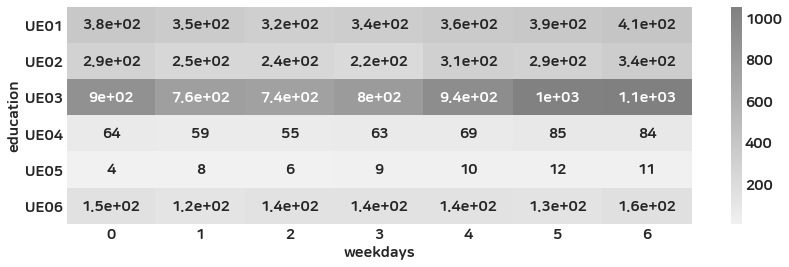

sign_hours     0      1      2      3      4      5      6      7      8   \
education                                                                   
UE01        122.0  110.0  130.0  126.0  111.0   99.0  120.0   85.0   82.0   
UE02         46.0   59.0   64.0   72.0   83.0   66.0   72.0   76.0   70.0   
UE03        178.0  196.0  220.0  243.0  277.0  285.0  262.0  261.0  274.0   
UE04         15.0   14.0   26.0   23.0   12.0   20.0   15.0   24.0   13.0   
UE05          2.0    3.0    2.0    2.0    1.0    1.0    2.0    4.0    2.0   
UE06         40.0   28.0   39.0   37.0   40.0   48.0   33.0   58.0   65.0   

sign_hours     9   ...     14     15     16     17     18     19     20  \
education          ...                                                    
UE01         78.0  ...  169.0  153.0  111.0  106.0   88.0   81.0   82.0   
UE02         89.0  ...  165.0  157.0  109.0   58.0   55.0   33.0   18.0   
UE03        261.0  ...  465.0  464.0  374.0  247.0  201.0  134.0  125.0   
UE04    

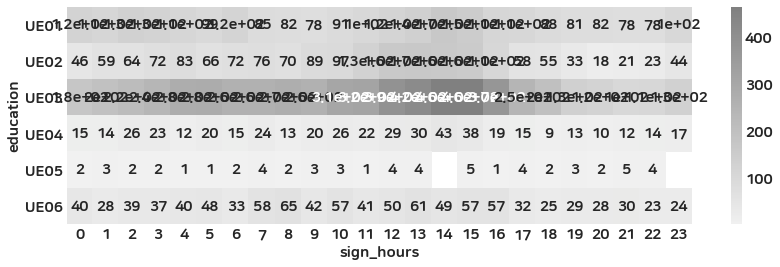

profile_tier  Bronze  Diamond    Gold  Silver
religion                                     
UR00             4.0   4419.0  1770.0   350.0
UR01            10.0   1196.0   649.0   291.0
UR02             NaN    199.0   127.0    26.0
UR03             1.0    458.0   233.0    88.0
UR04             NaN      NaN     1.0     NaN
UR05             1.0     51.0    18.0    13.0
UR06             NaN     23.0     7.0     3.0
UR07             NaN      1.0     1.0     2.0
UR08             NaN      2.0     NaN     NaN
UR09             NaN      NaN     1.0     NaN
UR10             NaN      1.0     1.0     NaN
UR11             NaN      1.0     2.0     NaN
UR99             2.0    119.0   118.0    86.0


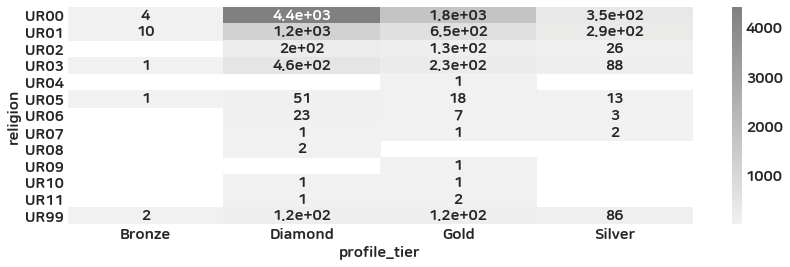

body_type   BF00    BF01    BF02   BF03   BF04    BF05  BM00  BM02  BM04
religion                                                                
UR00       490.0  1249.0  3501.0  719.0  530.0  1294.0   2.0   4.0   1.0
UR01       154.0   379.0  1144.0  269.0  271.0   376.0   NaN   2.0   NaN
UR02        28.0    61.0   178.0   31.0   34.0    90.0   NaN   1.0   NaN
UR03        52.0   147.0   429.0   80.0   93.0   162.0   NaN   NaN   NaN
UR04         1.0     1.0     NaN    1.0    NaN     1.0   NaN   NaN   NaN
UR05         7.0    25.0    44.0    8.0    3.0    21.0   NaN   NaN   NaN
UR06         2.0    13.0    23.0    3.0    2.0     8.0   NaN   NaN   NaN
UR07         NaN     3.0     3.0    1.0    NaN     1.0   NaN   NaN   NaN
UR08         NaN     2.0     1.0    1.0    NaN     NaN   NaN   NaN   NaN
UR09         NaN     NaN     1.0    1.0    NaN     NaN   NaN   NaN   NaN
UR10         NaN     1.0     NaN    NaN    1.0     NaN   NaN   NaN   NaN
UR11         1.0     2.0     1.0    NaN    2.0     

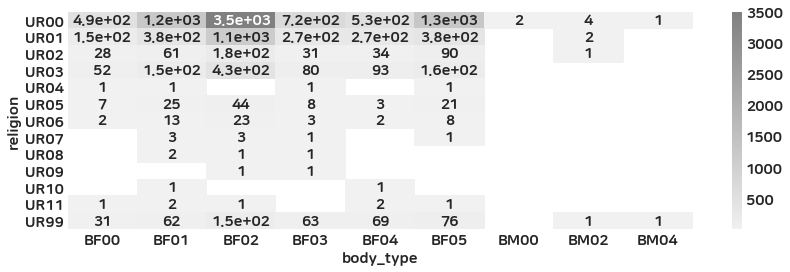

blood_type      A     AB      B      O
religion                              
UR00        549.0  199.0  453.0  545.0
UR01        226.0   74.0  164.0  208.0
UR02         37.0   10.0   31.0   35.0
UR03         74.0   36.0   47.0   99.0
UR04          NaN    NaN    1.0    NaN
UR05          5.0    1.0   13.0   14.0
UR06          2.0    3.0    2.0    2.0
UR07          NaN    1.0    NaN    1.0
UR08          1.0    NaN    NaN    1.0
UR09          NaN    NaN    NaN    1.0
UR10          NaN    NaN    NaN    1.0
UR11          1.0    1.0    NaN    NaN
UR99         22.0   11.0   22.0   45.0


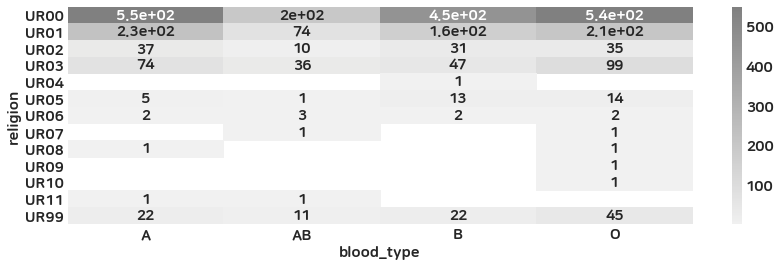

education    UE01    UE02    UE03   UE04  UE05   UE06
religion                                             
UR00       1503.0  1453.0  3911.0  224.0  29.0  586.0
UR01        597.0   287.0  1294.0  147.0  16.0  216.0
UR02         83.0    77.0   204.0   16.0   3.0   33.0
UR03        193.0    90.0   546.0   54.0   8.0   57.0
UR04          NaN     NaN     1.0    2.0   NaN    1.0
UR05         27.0     3.0    52.0    8.0   NaN   17.0
UR06          9.0     5.0    18.0   13.0   1.0    5.0
UR07          1.0     NaN     7.0    NaN   NaN    NaN
UR08          2.0     NaN     2.0    NaN   NaN    NaN
UR09          NaN     NaN     1.0    NaN   NaN    NaN
UR10          NaN     NaN     2.0    NaN   NaN    NaN
UR11          1.0     NaN     3.0    1.0   NaN    1.0
UR99        135.0    17.0   189.0   14.0   3.0   74.0


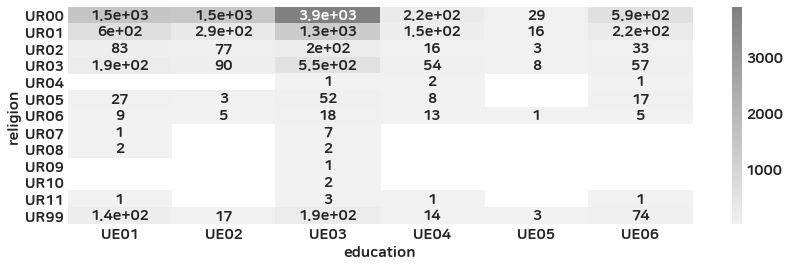

religion    UR00    UR01   UR02   UR03  UR04   UR05  UR06  UR07  UR08  UR09  \
religion                                                                      
UR00      7790.0     NaN    NaN    NaN   NaN    NaN   NaN   NaN   NaN   NaN   
UR01         NaN  2595.0    NaN    NaN   NaN    NaN   NaN   NaN   NaN   NaN   
UR02         NaN     NaN  423.0    NaN   NaN    NaN   NaN   NaN   NaN   NaN   
UR03         NaN     NaN    NaN  963.0   NaN    NaN   NaN   NaN   NaN   NaN   
UR04         NaN     NaN    NaN    NaN   4.0    NaN   NaN   NaN   NaN   NaN   
UR05         NaN     NaN    NaN    NaN   NaN  108.0   NaN   NaN   NaN   NaN   
UR06         NaN     NaN    NaN    NaN   NaN    NaN  51.0   NaN   NaN   NaN   
UR07         NaN     NaN    NaN    NaN   NaN    NaN   NaN   8.0   NaN   NaN   
UR08         NaN     NaN    NaN    NaN   NaN    NaN   NaN   NaN   4.0   NaN   
UR09         NaN     NaN    NaN    NaN   NaN    NaN   NaN   NaN   NaN   2.0   
UR10         NaN     NaN    NaN    NaN   NaN    NaN 

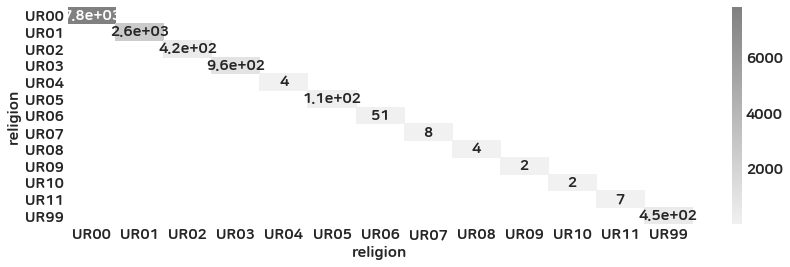

smoking    SM00    SM01    SM02
religion                       
UR00      455.0  1001.0  6332.0
UR01      107.0   297.0  2189.0
UR02       29.0    53.0   341.0
UR03       45.0   132.0   786.0
UR04        2.0     1.0     1.0
UR05        3.0     7.0    98.0
UR06        3.0     4.0    44.0
UR07        NaN     2.0     6.0
UR08        NaN     3.0     1.0
UR09        NaN     1.0     1.0
UR10        NaN     NaN     2.0
UR11        3.0     NaN     4.0
UR99       48.0    84.0   322.0


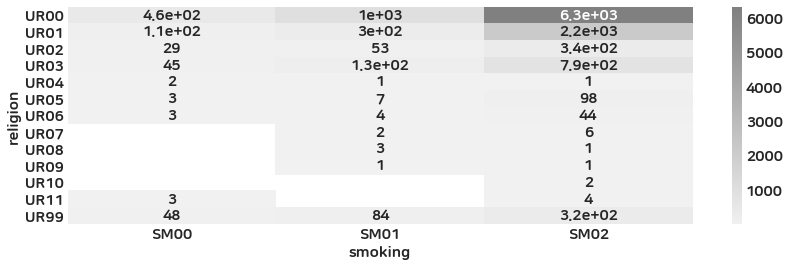

drinking   DR00    DR01    DR02
religion                       
UR00      677.0  6035.0  1077.0
UR01      158.0  1664.0   773.0
UR02       39.0   308.0    76.0
UR03       59.0   688.0   216.0
UR04        3.0     NaN     1.0
UR05        2.0    16.0    90.0
UR06        5.0    13.0    33.0
UR07        NaN     4.0     4.0
UR08        NaN     4.0     NaN
UR09        1.0     1.0     NaN
UR10        NaN     2.0     NaN
UR11        2.0     4.0     1.0
UR99       22.0   302.0   130.0


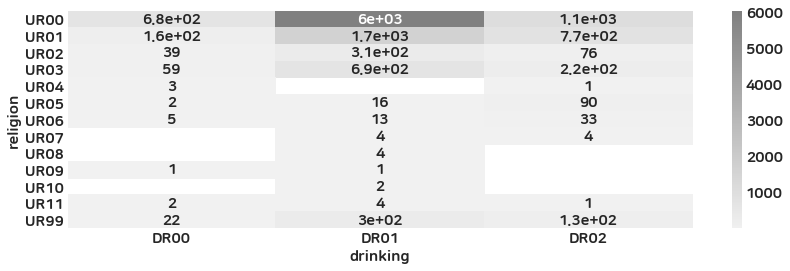

region     AE   AL   AR    AU   AZ   BE   BH   BO   BR   BY  ...   TH   TN  \
religion                                                     ...             
UR00      2.0  NaN  4.0  14.0  NaN  NaN  NaN  NaN  2.0  1.0  ...  2.0  NaN   
UR01      3.0  NaN  2.0   4.0  NaN  1.0  1.0  1.0  5.0  NaN  ...  1.0  NaN   
UR02      NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  7.0  NaN   
UR03      5.0  1.0  NaN   2.0  NaN  NaN  NaN  1.0  NaN  NaN  ...  NaN  NaN   
UR04      NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
UR05      1.0  NaN  NaN   NaN  1.0  NaN  NaN  NaN  1.0  NaN  ...  NaN  NaN   
UR06      1.0  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
UR07      NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
UR08      NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
UR09      NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
UR10      NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...

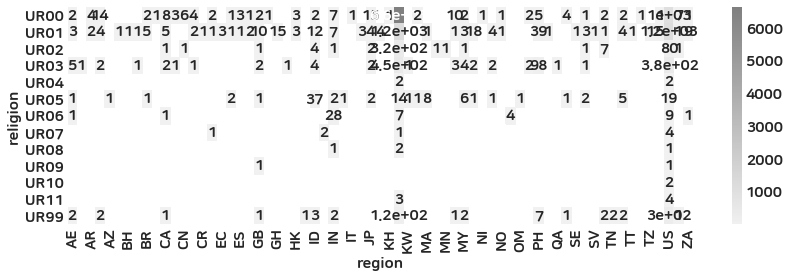

current_region   AE   AL   AR   AT    AU   AZ   BD   BE   BH   BJ  ...   TR  \
religion                                                           ...        
UR00            4.0  NaN  8.0  NaN  18.0  NaN  1.0  NaN  NaN  NaN  ...  3.0   
UR01            3.0  NaN  4.0  1.0   4.0  NaN  2.0  1.0  1.0  3.0  ...  2.0   
UR02            1.0  NaN  1.0  NaN   NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
UR03            8.0  1.0  1.0  NaN   3.0  NaN  NaN  NaN  NaN  NaN  ...  NaN   
UR04            NaN  NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
UR05            1.0  NaN  NaN  NaN   NaN  2.0  NaN  NaN  NaN  NaN  ...  4.0   
UR06            1.0  NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
UR07            NaN  NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
UR08            NaN  NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
UR09            NaN  NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
UR10            NaN  NaN  NaN  NaN   NaN  NaN  NaN  

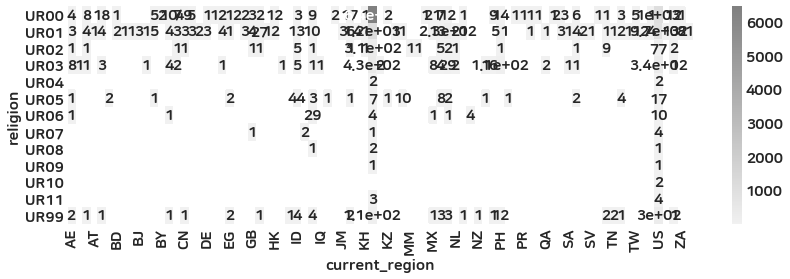

language   ar   de      en    es   fr    in   iw   ja      ko   nb   pt   ru  \
religion                                                                       
UR00      NaN  NaN  1267.0  55.0  2.0   NaN  NaN  1.0  6432.0  1.0  5.0  9.0   
UR01      1.0  NaN  1391.0  21.0  NaN   8.0  NaN  NaN  1160.0  NaN  5.0  6.0   
UR02      NaN  NaN   109.0   1.0  NaN   1.0  NaN  NaN   307.0  NaN  NaN  NaN   
UR03      NaN  1.0   528.0  21.0  1.0   1.0  NaN  NaN   410.0  NaN  NaN  NaN   
UR04      NaN  NaN     1.0   NaN  NaN   NaN  NaN  NaN     3.0  NaN  NaN  NaN   
UR05      NaN  NaN    64.0   NaN  7.0  24.0  NaN  NaN     5.0  NaN  1.0  3.0   
UR06      NaN  NaN    45.0   1.0  NaN   NaN  NaN  NaN     5.0  NaN  NaN  NaN   
UR07      NaN  NaN     6.0   NaN  NaN   NaN  2.0  NaN     NaN  NaN  NaN  NaN   
UR08      NaN  NaN     2.0   NaN  NaN   NaN  NaN  NaN     2.0  NaN  NaN  NaN   
UR09      NaN  NaN     1.0   NaN  NaN   NaN  NaN  NaN     1.0  NaN  NaN  NaN   
UR10      NaN  NaN     2.0   NaN  NaN   

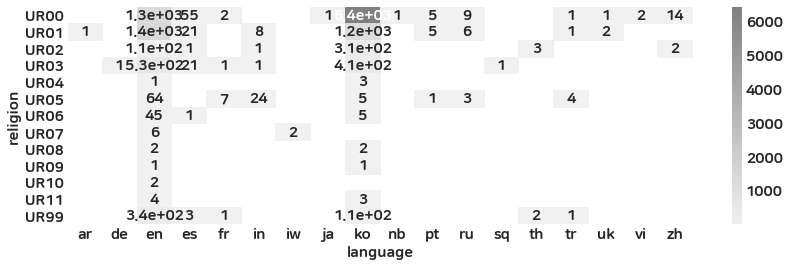

is_out         N       Y
religion                
UR00      4493.0  3297.0
UR01      1700.0   895.0
UR02       256.0   167.0
UR03       622.0   341.0
UR04         4.0     NaN
UR05        60.0    48.0
UR06        32.0    19.0
UR07         4.0     4.0
UR08         1.0     3.0
UR09         1.0     1.0
UR10         NaN     2.0
UR11         6.0     1.0
UR99       294.0   160.0


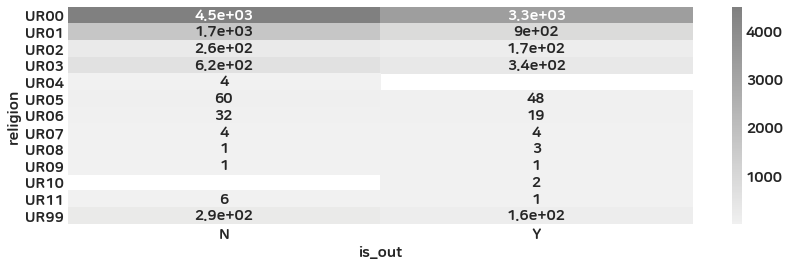

is_deactivated       N       Y
religion                      
UR00            3737.0  4053.0
UR01            1247.0  1348.0
UR02             209.0   214.0
UR03             424.0   539.0
UR04               1.0     3.0
UR05              36.0    72.0
UR06              16.0    35.0
UR07               2.0     6.0
UR08               1.0     3.0
UR09               1.0     1.0
UR10               NaN     2.0
UR11               3.0     4.0
UR99             178.0   276.0


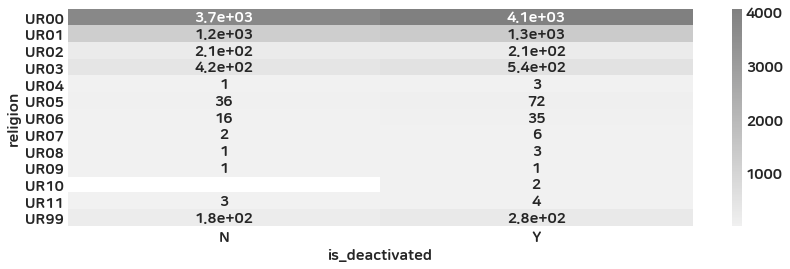

is_blocked    Y
religion       
UR00        480
UR01         47
UR02          3
UR03         23
UR06          1
UR99         12


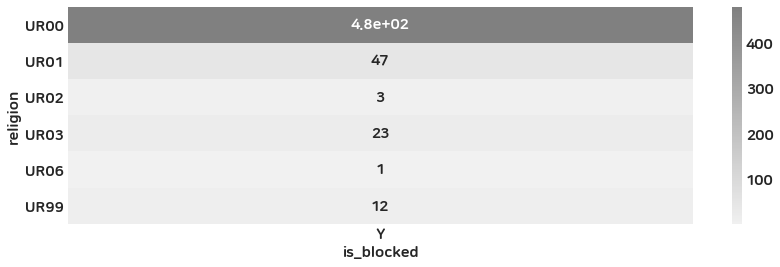

is_confirm      N       Y
religion                 
UR00        351.0  6543.0
UR01         65.0  2146.0
UR02          6.0   353.0
UR03         37.0   780.0
UR04          NaN     1.0
UR05          2.0    83.0
UR06          3.0    33.0
UR07          NaN     4.0
UR08          NaN     2.0
UR09          NaN     1.0
UR10          NaN     2.0
UR11          NaN     3.0
UR99         18.0   325.0


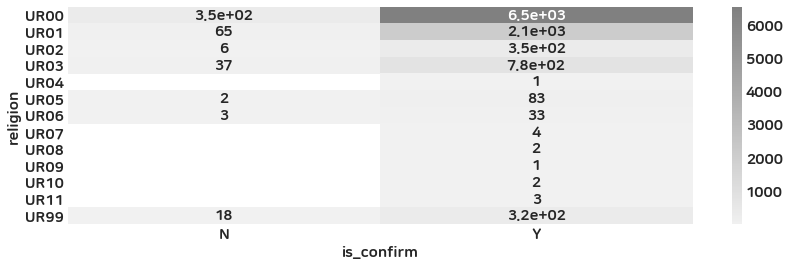

sign_up_completed       N       Y
religion                         
UR00               1371.0  6419.0
UR01                556.0  2039.0
UR02                 84.0   339.0
UR03                221.0   742.0
UR04                  3.0     1.0
UR05                 31.0    77.0
UR06                 18.0    33.0
UR07                  5.0     3.0
UR08                  2.0     2.0
UR09                  1.0     1.0
UR10                  NaN     2.0
UR11                  4.0     3.0
UR99                155.0   299.0


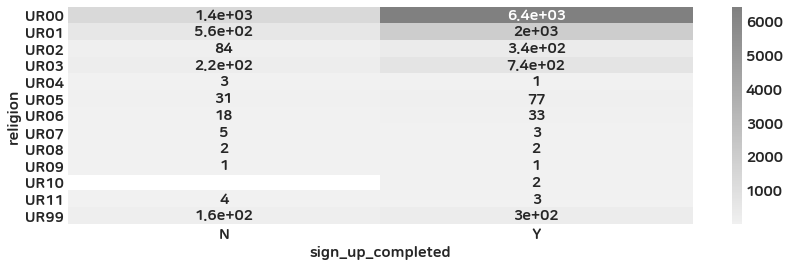

stage     Attraction  Drinking  Height  Interest  Job  MatchSetting  Picture  \
religion                                                                       
UR00             1.0       1.0     NaN       2.0  2.0          16.0    301.0   
UR01             1.0       1.0     NaN       1.0  NaN          10.0     93.0   
UR02             NaN       1.0     NaN       NaN  NaN           1.0     24.0   
UR03             NaN       NaN     NaN       NaN  NaN           6.0     31.0   
UR04             NaN       NaN     NaN       NaN  NaN           NaN      2.0   
UR05             NaN       NaN     NaN       NaN  NaN           NaN      3.0   
UR06             NaN       NaN     1.0       NaN  NaN           NaN      2.0   
UR07             NaN       NaN     NaN       NaN  NaN           NaN      NaN   
UR08             NaN       NaN     NaN       NaN  NaN           NaN      NaN   
UR09             NaN       NaN     NaN       NaN  NaN           NaN      NaN   
UR11             NaN       NaN     NaN  

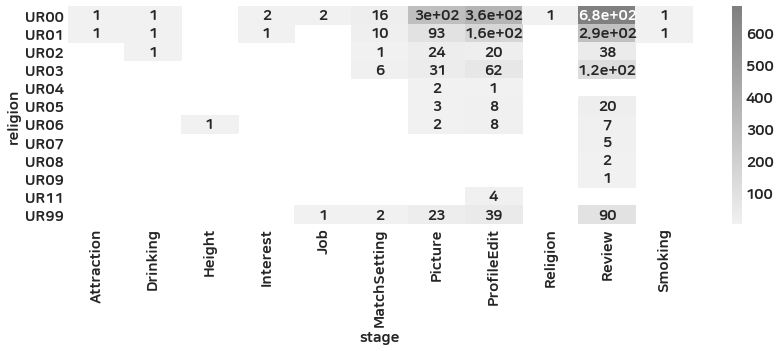

weekdays       0      1      2      3       4       5       6
religion                                                     
UR00      1118.0  970.0  917.0  981.0  1196.0  1255.0  1353.0
UR01       398.0  324.0  346.0  334.0   362.0   407.0   424.0
UR02        70.0   63.0   51.0   49.0    64.0    66.0    60.0
UR03       126.0  129.0  125.0  152.0   139.0   143.0   149.0
UR04         NaN    1.0    NaN    1.0     NaN     2.0     NaN
UR05        20.0   12.0   12.0    8.0    17.0    15.0    24.0
UR06         4.0    8.0    9.0    9.0     7.0     5.0     9.0
UR07         2.0    3.0    1.0    NaN     NaN     2.0     NaN
UR08         1.0    NaN    NaN    NaN     2.0     1.0     NaN
UR09         NaN    NaN    NaN    NaN     1.0     NaN     1.0
UR10         1.0    NaN    1.0    NaN     NaN     NaN     NaN
UR11         NaN    2.0    1.0    NaN     1.0     3.0     NaN
UR99        68.0   59.0   64.0   59.0    60.0    75.0    69.0


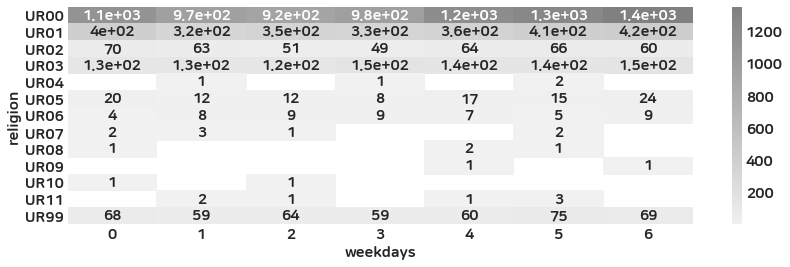

sign_hours     0      1      2      3      4      5      6      7      8   \
religion                                                                    
UR00        197.0  239.0  277.0  295.0  304.0  335.0  314.0  341.0  314.0   
UR01        110.0  118.0  115.0   98.0  135.0  106.0   99.0  102.0  110.0   
UR02         13.0   15.0   15.0   19.0   18.0   15.0   21.0   14.0   17.0   
UR03         53.0   23.0   49.0   54.0   41.0   43.0   43.0   39.0   44.0   
UR04          NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    1.0   
UR05          2.0    1.0    3.0    7.0    4.0    4.0    3.0    6.0    7.0   
UR06          NaN    2.0    2.0    3.0    3.0    3.0    2.0    1.0    1.0   
UR07          1.0    NaN    NaN    NaN    1.0    NaN    NaN    NaN    1.0   
UR08          NaN    NaN    1.0    NaN    NaN    NaN    NaN    NaN    1.0   
UR09          NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
UR10          NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   

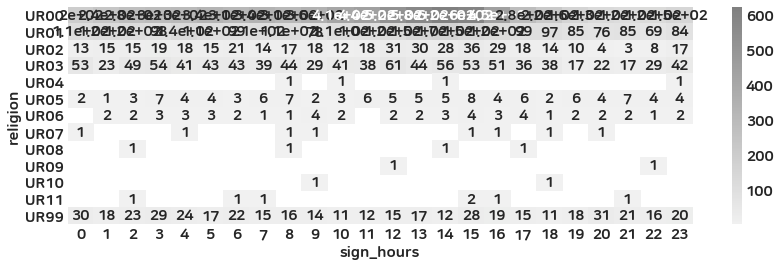

profile_tier  Bronze  Diamond  Gold  Silver
smoking                                    
SM00               1      270   182      71
SM01               5      763   341     137
SM02              12     5437  2405     651


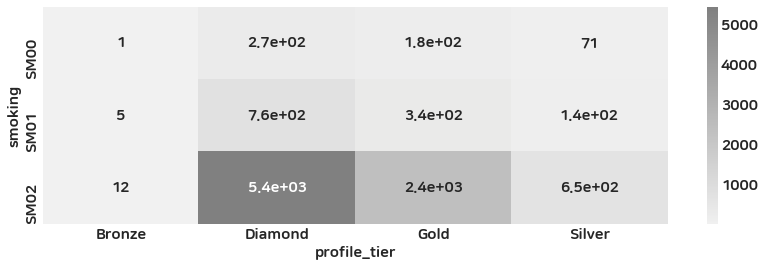

body_type   BF00    BF01    BF02   BF03   BF04    BF05  BM00  BM02  BM04
smoking                                                                 
SM00        56.0    97.0   240.0   57.0   64.0   178.0   NaN   2.0   1.0
SM01        82.0   227.0   649.0  163.0  166.0   297.0   1.0   NaN   NaN
SM02       628.0  1620.0  4585.0  956.0  775.0  1555.0   1.0   6.0   1.0


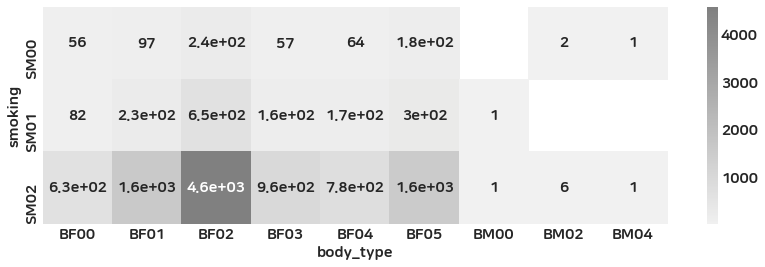

blood_type    A   AB    B    O
smoking                       
SM00         53   11   35   40
SM01         86   58   90  122
SM02        778  267  608  790


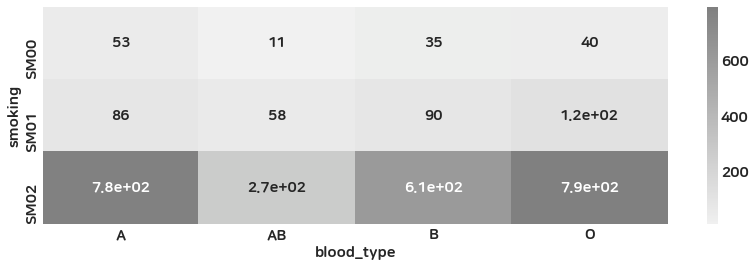

education  UE01  UE02  UE03  UE04  UE05  UE06
smoking                                      
SM00        310    82   190    13     2    87
SM01        509   248   602    44     8   151
SM02       1731  1602  5436   422    50   751


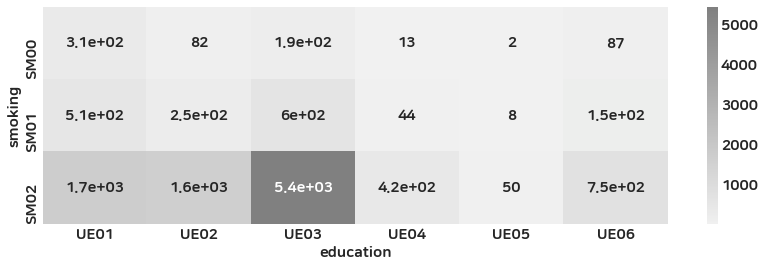

religion    UR00    UR01   UR02   UR03  UR04  UR05  UR06  UR07  UR08  UR09  \
smoking                                                                      
SM00       455.0   107.0   29.0   45.0   2.0   3.0   3.0   NaN   NaN   NaN   
SM01      1001.0   297.0   53.0  132.0   1.0   7.0   4.0   2.0   3.0   1.0   
SM02      6332.0  2189.0  341.0  786.0   1.0  98.0  44.0   6.0   1.0   1.0   

religion  UR10  UR11   UR99  
smoking                      
SM00       NaN   3.0   48.0  
SM01       NaN   NaN   84.0  
SM02       2.0   4.0  322.0  


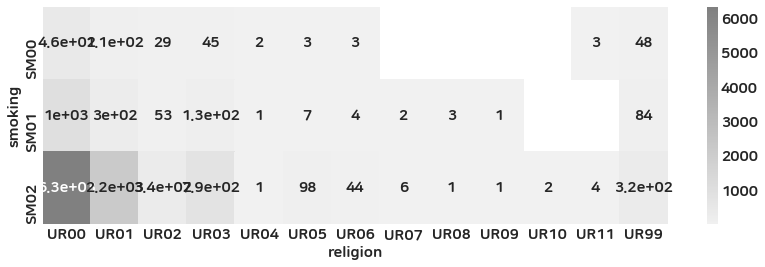

smoking   SM00    SM01     SM02
smoking                        
SM00     695.0     NaN      NaN
SM01       NaN  1585.0      NaN
SM02       NaN     NaN  10127.0


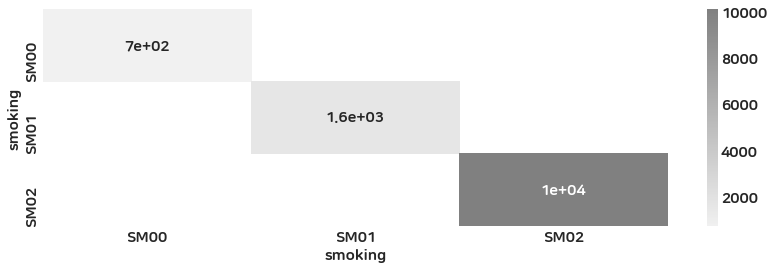

drinking  DR00  DR01  DR02
smoking                   
SM00       225   385    85
SM01       185  1254   146
SM02       558  7401  2168


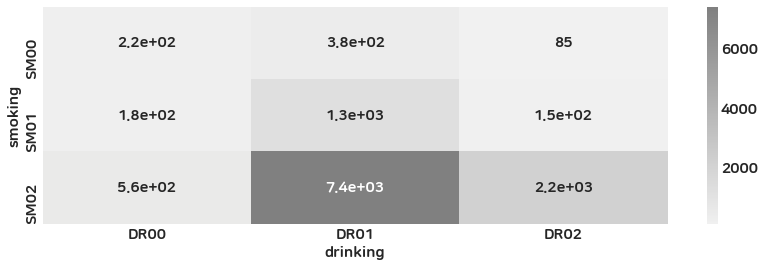

region     AE   AL   AR    AU   AZ   BE   BH   BO   BR   BY  ...   TH   TN  \
smoking                                                      ...             
SM00      NaN  NaN  NaN   2.0  NaN  NaN  NaN  NaN  1.0  NaN  ...  2.0  NaN   
SM01      3.0  1.0  1.0   2.0  NaN  NaN  NaN  1.0  NaN  NaN  ...  4.0  1.0   
SM02     11.0  NaN  5.0  18.0  1.0  1.0  1.0  1.0  7.0  1.0  ...  6.0  1.0   

region    TR   TT   TW   TZ   UA      US   VN   ZA  
smoking                                             
SM00     1.0  NaN  NaN  NaN  NaN   221.0  1.0  NaN  
SM01     4.0  NaN  NaN  NaN  NaN   551.0  2.0  3.0  
SM02     8.0  1.0  1.0  1.0  6.0  2211.0  7.0  8.0  

[3 rows x 67 columns]


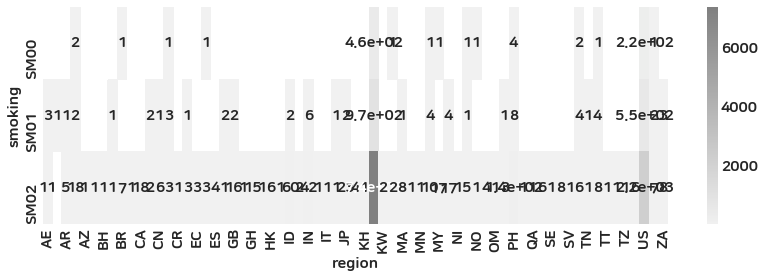

current_region    AE   AL    AR   AT    AU   AZ   BD   BE   BH   BJ  ...   TR  \
smoking                                                              ...        
SM00             NaN  NaN   1.0  NaN   2.0  NaN  NaN  NaN  NaN  NaN  ...  1.0   
SM01             4.0  1.0   2.0  NaN   2.0  1.0  NaN  NaN  NaN  NaN  ...  3.0   
SM02            16.0  NaN  12.0  1.0  22.0  1.0  3.0  1.0  1.0  3.0  ...  6.0   

current_region   TT   TW   TZ   UA      US   VE    VN   ZA   ZW  
smoking                                                          
SM00            NaN  NaN  NaN  NaN   217.0  NaN   1.0  NaN  NaN  
SM01            NaN  NaN  NaN  NaN   496.0  NaN   3.0  3.0  NaN  
SM02            1.0  6.0  2.0  5.0  2036.0  1.0  15.0  6.0  1.0  

[3 rows x 83 columns]


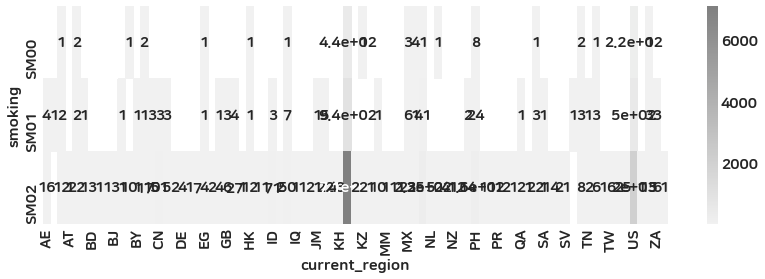

language   ar   de      en    es   fr    in   iw   ja      ko   nb    pt  \
smoking                                                                    
SM00      NaN  NaN   241.0   4.0  1.0   NaN  NaN  NaN   442.0  1.0   1.0   
SM01      NaN  NaN   633.0  16.0  2.0   2.0  NaN  NaN   926.0  NaN   NaN   
SM02      1.0  1.0  2882.0  82.0  8.0  32.0  2.0  1.0  7067.0  NaN  10.0   

language    ru   sq   th   tr   uk   vi    zh  
smoking                                        
SM00       2.0  NaN  2.0  1.0  NaN  NaN   NaN  
SM01       3.0  1.0  1.0  1.0  NaN  NaN   NaN  
SM02      13.0  NaN  2.0  5.0  3.0  2.0  16.0  


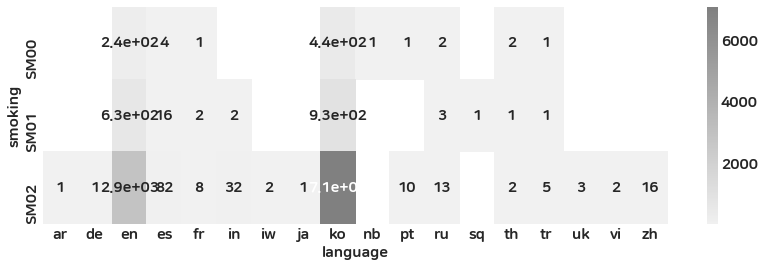

is_out      N     Y
smoking            
SM00      461   234
SM01     1064   521
SM02     5944  4183


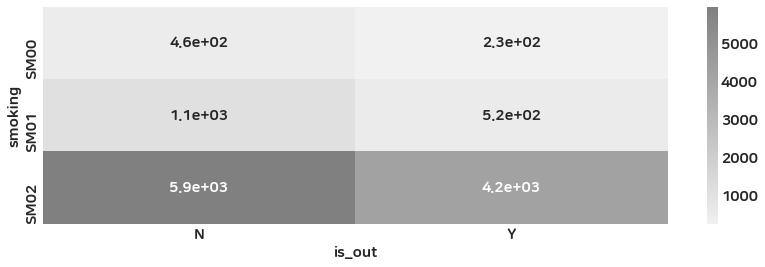

is_deactivated     N     Y
smoking                   
SM00             296   399
SM01             771   814
SM02            4786  5341


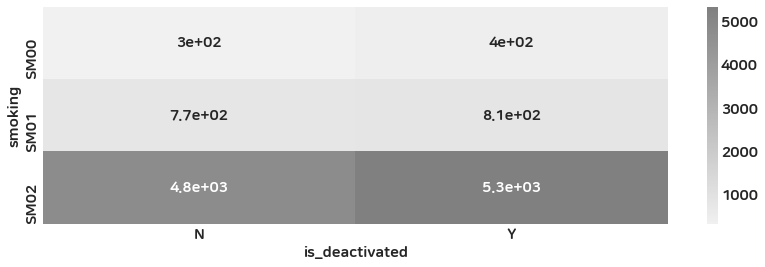

is_blocked    Y
smoking        
SM00          3
SM01         39
SM02        524


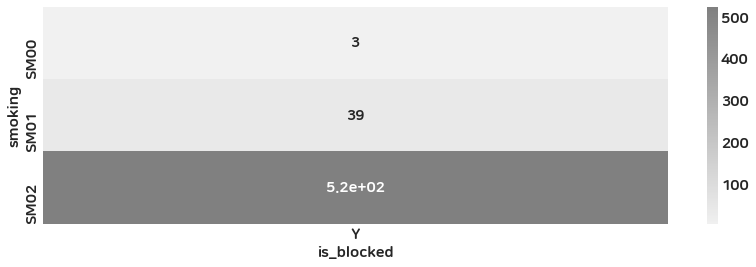

is_confirm    N     Y
smoking              
SM00         10   524
SM01         47  1246
SM02        425  8506


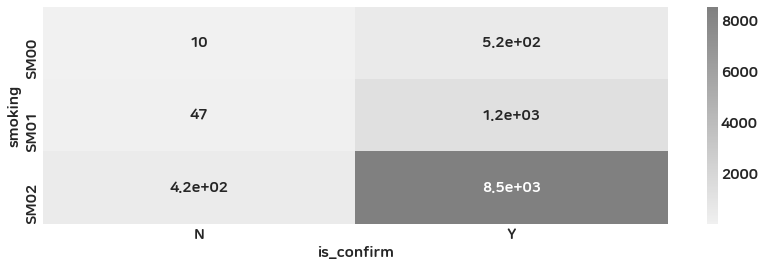

sign_up_completed     N     Y
smoking                      
SM00                194   501
SM01                392  1193
SM02               1861  8266


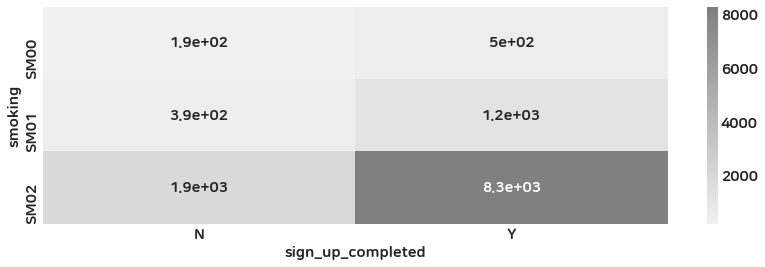

stage    Attraction  Drinking  Height  Interest  Job  MatchSetting  Picture  \
smoking                                                                       
SM00            NaN       1.0     NaN       NaN  NaN           7.0     34.0   
SM01            NaN       NaN     NaN       1.0  NaN           4.0     77.0   
SM02            2.0       NaN     1.0       2.0  3.0          24.0    368.0   

stage    ProfileEdit  Religion  Review  
smoking                                 
SM00            65.0       NaN    87.0  
SM01           115.0       NaN   195.0  
SM02           487.0       1.0   973.0  


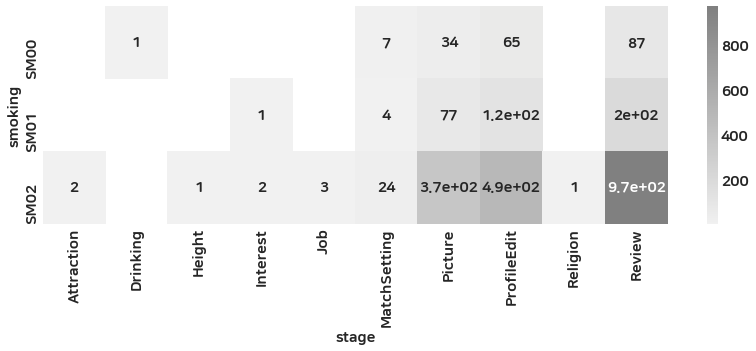

weekdays     0     1     2     3     4     5     6
smoking                                           
SM00       111   108    86    93   102   101    94
SM01       221   222   213   198   225   237   269
SM02      1475  1241  1228  1301  1522  1634  1726


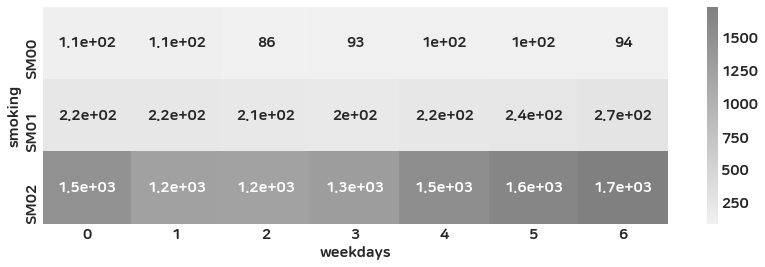

sign_hours   0    1    2    3    4    5    6    7    8    9   ...   14   15  \
smoking                                                       ...             
SM00         25   28   32   34   26   20   34   27   25   25  ...   33   46   
SM01         58   56   68   67   83   70   68   51   56   56  ...   94  116   
SM02        323  331  386  404  421  432  403  441  431  422  ...  774  720   

sign_hours   16   17   18   19   20   21   22   23  
smoking                                             
SM00         44   42   24   25   19   18   14   20  
SM01         76   63   64   53   51   54   44   43  
SM02        559  359  297  218  200  181  194  255  

[3 rows x 24 columns]


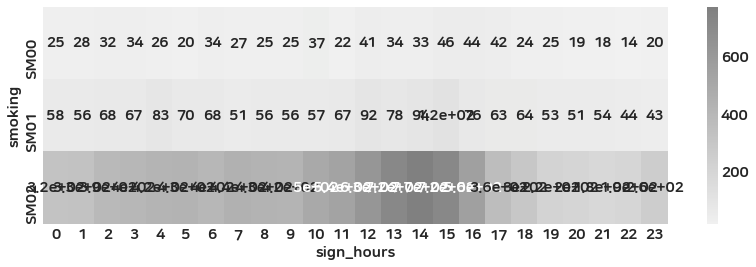

profile_tier  Bronze  Diamond  Gold  Silver
drinking                                   
DR00               1      473   225      33
DR01               9     4971  2152     564
DR02               8     1026   551     262


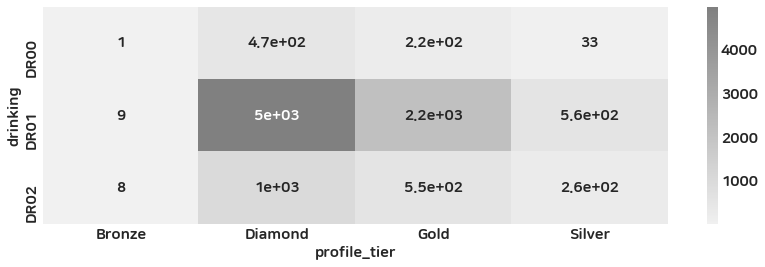

body_type   BF00    BF01    BF02   BF03   BF04    BF05  BM00  BM02  BM04
drinking                                                                
DR00        75.0   126.0   381.0   91.0   78.0   216.0   NaN   1.0   NaN
DR01       473.0  1431.0  4065.0  891.0  725.0  1448.0   2.0   4.0   2.0
DR02       218.0   388.0  1030.0  194.0  202.0   366.0   NaN   3.0   NaN


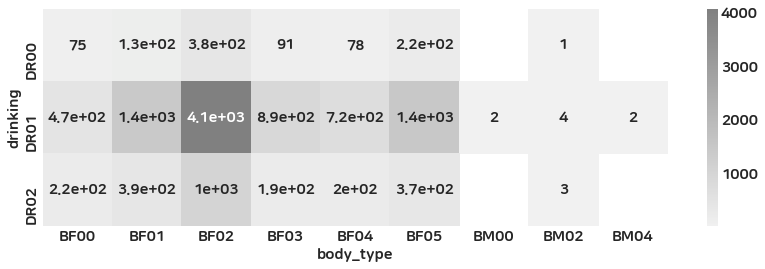

blood_type    A   AB    B    O
drinking                      
DR00         51   23   42   61
DR01        682  252  540  727
DR02        184   61  151  164


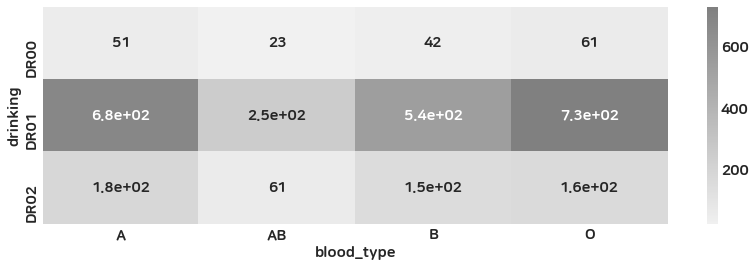

education  UE01  UE02  UE03  UE04  UE05  UE06
drinking                                     
DR00        243   166   429    36     3    76
DR01       1603  1524  4767   325    39   667
DR02        705   242  1033   118    18   247


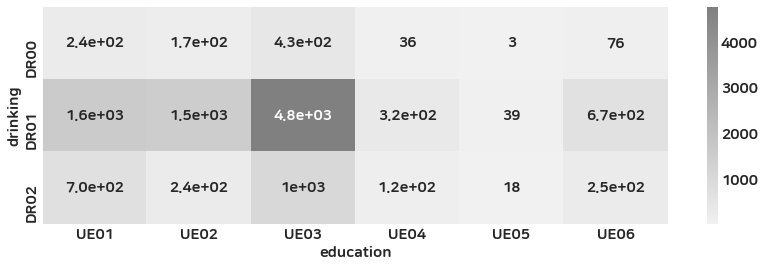

religion    UR00    UR01   UR02   UR03  UR04  UR05  UR06  UR07  UR08  UR09  \
drinking                                                                     
DR00       677.0   158.0   39.0   59.0   3.0   2.0   5.0   NaN   NaN   1.0   
DR01      6035.0  1664.0  308.0  688.0   NaN  16.0  13.0   4.0   4.0   1.0   
DR02      1077.0   773.0   76.0  216.0   1.0  90.0  33.0   4.0   NaN   NaN   

religion  UR10  UR11   UR99  
drinking                     
DR00       NaN   2.0   22.0  
DR01       2.0   4.0  302.0  
DR02       NaN   1.0  130.0  


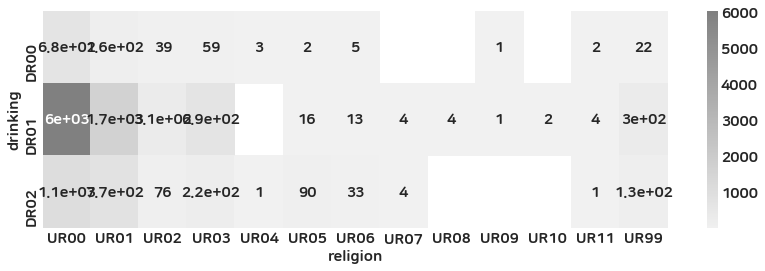

smoking   SM00  SM01  SM02
drinking                  
DR00       225   185   558
DR01       385  1254  7401
DR02        85   146  2168


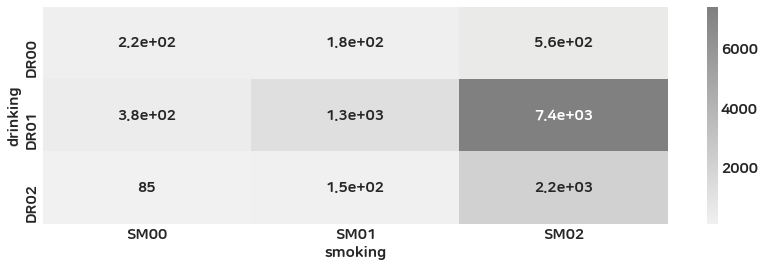

drinking   DR00    DR01    DR02
drinking                       
DR00      968.0     NaN     NaN
DR01        NaN  9041.0     NaN
DR02        NaN     NaN  2401.0


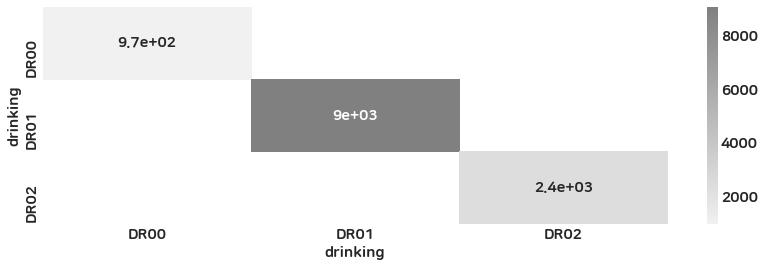

region      AE   AL   AR    AU   AZ   BE   BH   BO   BR   BY  ...   TH   TN  \
drinking                                                      ...             
DR00       NaN  NaN  NaN   4.0  NaN  NaN  NaN  1.0  1.0  NaN  ...  NaN  NaN   
DR01      10.0  1.0  5.0  14.0  1.0  1.0  NaN  1.0  2.0  1.0  ...  9.0  2.0   
DR02       4.0  NaN  1.0   4.0  NaN  NaN  1.0  NaN  5.0  NaN  ...  3.0  NaN   

region     TR   TT   TW   TZ   UA      US   VN   ZA  
drinking                                             
DR00      1.0  NaN  NaN  NaN  NaN   156.0  NaN  NaN  
DR01      6.0  1.0  1.0  NaN  3.0  1947.0  7.0  7.0  
DR02      6.0  NaN  NaN  1.0  3.0   882.0  3.0  4.0  

[3 rows x 67 columns]


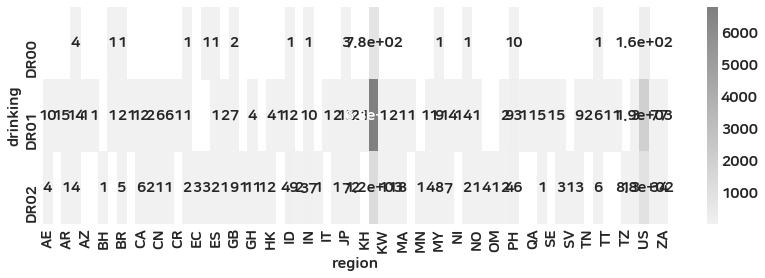

current_region    AE   AL    AR   AT    AU   AZ   BD   BE   BH   BJ  ...   TR  \
drinking                                                             ...        
DR00             NaN  NaN   NaN  NaN   5.0  NaN  NaN  NaN  NaN  NaN  ...  1.0   
DR01            13.0  1.0  11.0  1.0  18.0  2.0  NaN  1.0  NaN  1.0  ...  5.0   
DR02             7.0  NaN   4.0  NaN   3.0  NaN  3.0  NaN  1.0  2.0  ...  4.0   

current_region   TT   TW   TZ   UA      US   VE    VN   ZA   ZW  
drinking                                                         
DR00            NaN  1.0  NaN  NaN   148.0  NaN   NaN  NaN  NaN  
DR01            1.0  4.0  1.0  3.0  1849.0  NaN  15.0  7.0  NaN  
DR02            NaN  1.0  1.0  2.0   753.0  1.0   4.0  2.0  1.0  

[3 rows x 83 columns]


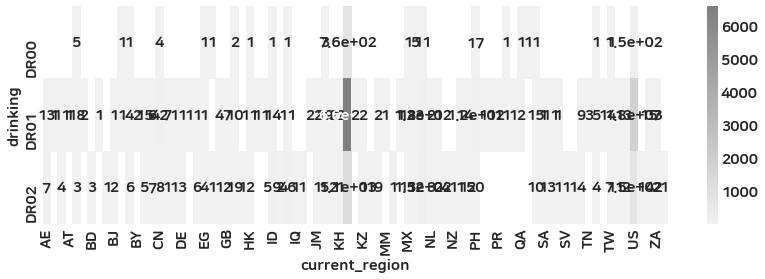

language   ar   de      en    es   fr    in   iw   ja      ko   nb   pt    ru  \
drinking                                                                        
DR00      NaN  NaN   201.0   2.0  NaN   NaN  NaN  NaN   760.0  NaN  2.0   NaN   
DR01      NaN  1.0  2408.0  50.0  5.0   8.0  NaN  1.0  6528.0  1.0  4.0  13.0   
DR02      1.0  NaN  1150.0  50.0  6.0  26.0  2.0  NaN  1147.0  NaN  5.0   5.0   

language   sq   th   tr   uk   vi    zh  
drinking                                 
DR00      NaN  1.0  1.0  NaN  NaN   1.0  
DR01      1.0  3.0  2.0  2.0  2.0  12.0  
DR02      NaN  1.0  4.0  1.0  NaN   3.0  


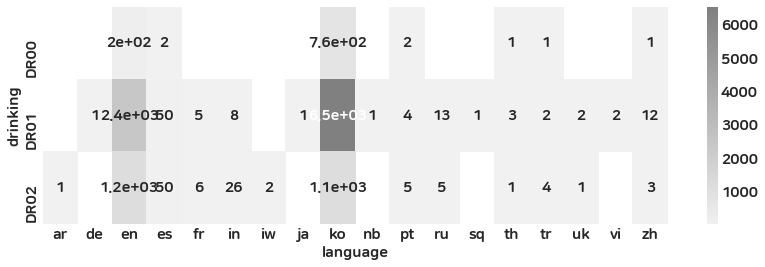

is_out       N     Y
drinking            
DR00       607   361
DR01      5356  3685
DR02      1509   892


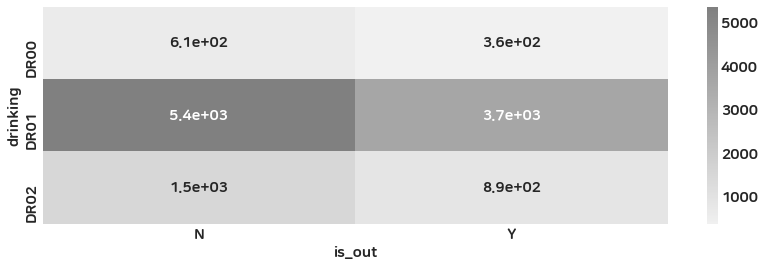

is_deactivated     N     Y
drinking                  
DR00             404   564
DR01            4447  4594
DR02            1003  1398


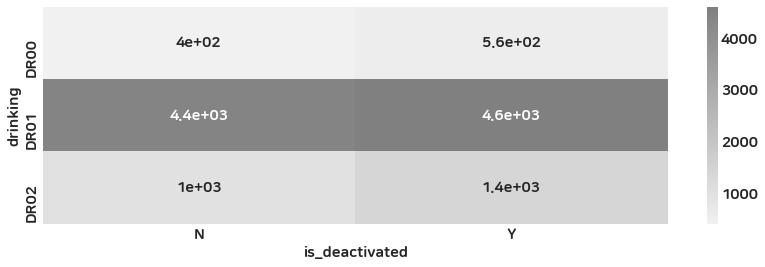

is_blocked    Y
drinking       
DR00         43
DR01        466
DR02         57


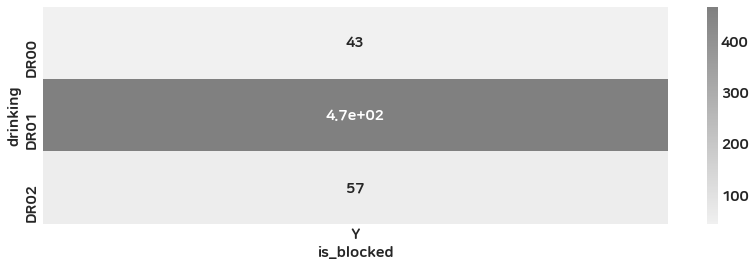

is_confirm    N     Y
drinking             
DR00         42   732
DR01        363  7696
DR02         77  1848


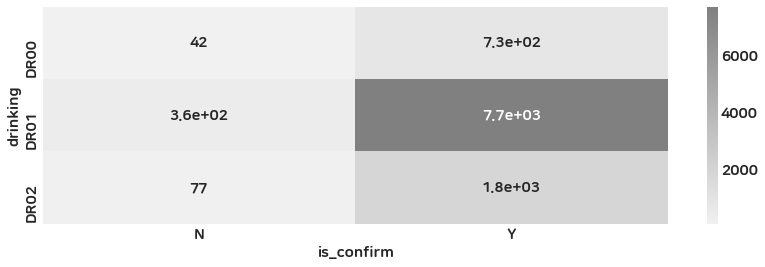

sign_up_completed     N     Y
drinking                     
DR00                261   707
DR01               1518  7523
DR02                671  1730


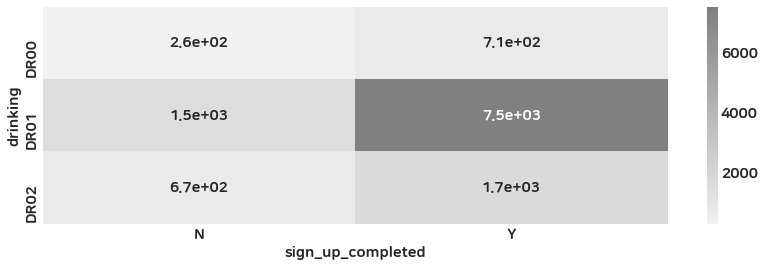

stage     Attraction  Drinking  Height  Interest  Job  MatchSetting  Picture  \
drinking                                                                       
DR00             NaN       NaN     NaN       NaN  NaN           1.0     55.0   
DR01             2.0       NaN     NaN       2.0  2.0          22.0    313.0   
DR02             NaN       2.0     1.0       1.0  1.0          12.0    111.0   

stage     ProfileEdit  Religion  Review  Smoking  
drinking                                          
DR00             79.0       NaN   126.0      NaN  
DR01            390.0       1.0   785.0      1.0  
DR02            198.0       NaN   344.0      1.0  


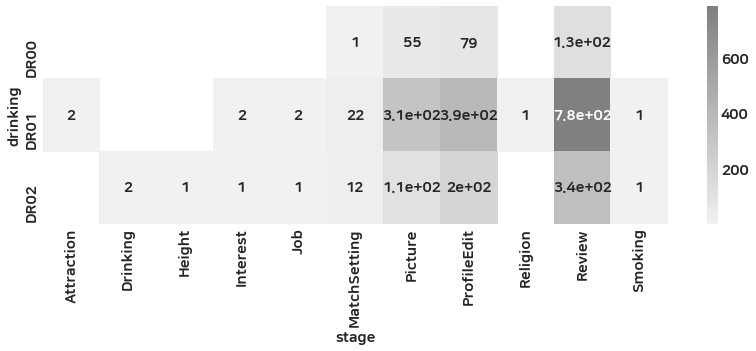

weekdays     0     1     2     3     4     5     6
drinking                                          
DR00       139   127   109   129   161   154   149
DR01      1336  1123  1114  1150  1342  1422  1554
DR02       332   321   304   314   346   398   386


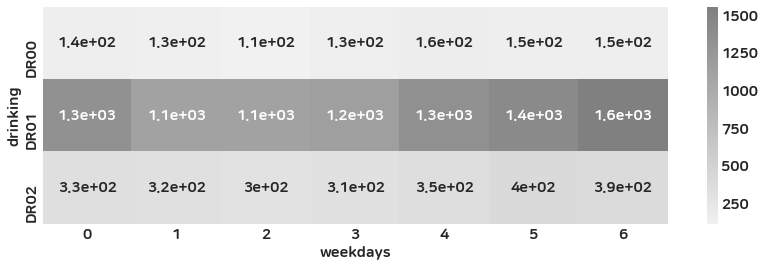

sign_hours   0    1    2    3    4    5    6    7    8    9   ...   14   15  \
drinking                                                      ...             
DR00         29   20   39   45   43   41   38   50   41   46  ...   57   85   
DR01        265  290  345  348  387  376  386  383  367  371  ...  696  665   
DR02        112  106  102  112  100  106   81   86  104   86  ...  148  133   

sign_hours   16   17   18   19   20   21   22   23  
drinking                                            
DR00         63   31   38   23   21   10   15   20  
DR01        506  341  262  191  176  181  175  218  
DR02        110   92   85   82   73   62   62   80  

[3 rows x 24 columns]


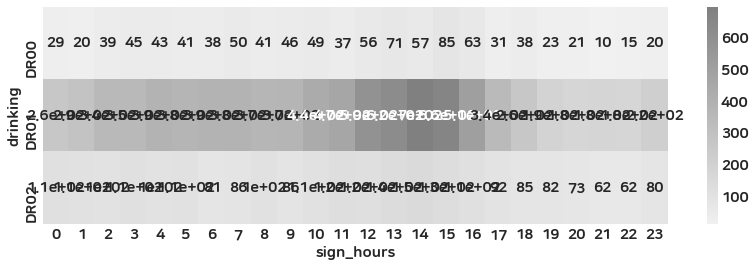

profile_tier  Bronze  Diamond    Gold  Silver
region                                       
AE               NaN      6.0     1.0     NaN
AR               NaN      3.0     NaN     NaN
AU               NaN     15.0     1.0     NaN
AZ               NaN      NaN     1.0     NaN
BE               NaN      1.0     NaN     NaN
BH               NaN      1.0     NaN     NaN
BR               NaN      5.0     1.0     NaN
BY               NaN      1.0     NaN     NaN
CA               NaN      8.0     5.0     NaN
CL               NaN      3.0     NaN     NaN
CN               NaN      4.0     1.0     1.0
CO               NaN      3.0     2.0     NaN
CR               NaN      1.0     NaN     NaN
DE               NaN      1.0     NaN     NaN
EC               NaN      1.0     NaN     NaN
EG               NaN      2.0     NaN     NaN
ES               NaN      3.0     NaN     NaN
FR               NaN      1.0     1.0     NaN
GB               NaN     13.0     NaN     NaN
GE               NaN      1.0     

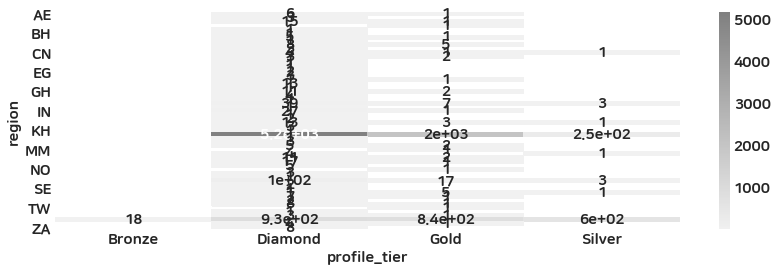

body_type   BF00   BF01    BF02   BF03   BF04   BF05  BM00  BM02  BM04
region                                                                
AE           NaN    3.0     9.0    NaN    NaN    2.0   NaN   NaN   NaN
AL           NaN    NaN     NaN    NaN    1.0    NaN   NaN   NaN   NaN
AR           NaN    NaN     4.0    NaN    2.0    NaN   NaN   NaN   NaN
AU           2.0    3.0    10.0    2.0    4.0    1.0   NaN   NaN   NaN
AZ           NaN    NaN     NaN    1.0    NaN    NaN   NaN   NaN   NaN
...          ...    ...     ...    ...    ...    ...   ...   ...   ...
TZ           NaN    NaN     1.0    NaN    NaN    NaN   NaN   NaN   NaN
UA           1.0    2.0     3.0    NaN    NaN    NaN   NaN   NaN   NaN
US         192.0  397.0  1105.0  413.0  526.0  364.0   NaN   2.0   1.0
VN           NaN    3.0     3.0    1.0    NaN    3.0   NaN   NaN   NaN
ZA           NaN    3.0     7.0    NaN    NaN    1.0   NaN   NaN   NaN

[67 rows x 9 columns]


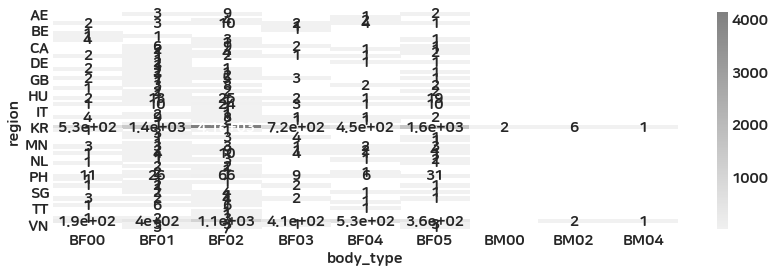

blood_type      A     AB      B      O
region                                
AU            2.0    NaN    1.0    NaN
AZ            1.0    NaN    NaN    NaN
BE            NaN    1.0    NaN    NaN
BO            1.0    NaN    NaN    NaN
CA            5.0    NaN    2.0    1.0
CL            NaN    NaN    NaN    1.0
CN            NaN    1.0    2.0    NaN
CO            1.0    NaN    NaN    NaN
DE            NaN    1.0    NaN    NaN
ES            NaN    1.0    NaN    NaN
GB            3.0    NaN    2.0    NaN
GH            2.0    NaN    1.0    1.0
HK            1.0    NaN    NaN    1.0
ID            3.0    1.0   13.0   11.0
IL            NaN    NaN    NaN    1.0
IN            1.0    4.0    2.0    4.0
JP            2.0    NaN    3.0    NaN
KE            1.0    NaN    NaN    NaN
KR          658.0  228.0  595.0  636.0
MA            2.0    NaN    NaN    1.0
MM            NaN    NaN    NaN    1.0
MX            1.0    NaN    NaN    NaN
MY            1.0    NaN    1.0    5.0
NG            1.0    NaN 

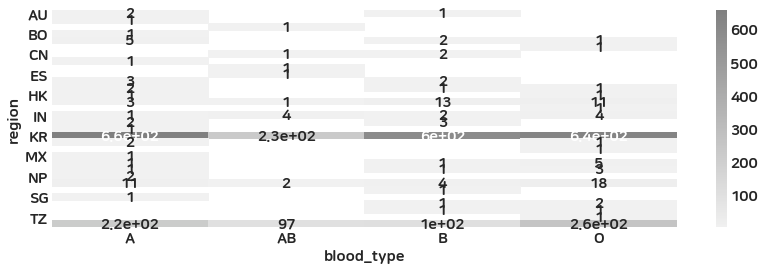

education    UE01  UE02    UE03   UE04  UE05   UE06
region                                             
AE            2.0   NaN     8.0    NaN   NaN    2.0
AL            NaN   NaN     NaN    1.0   NaN    NaN
AR            4.0   NaN     NaN    NaN   NaN    2.0
AU            5.0   1.0    10.0    1.0   NaN    5.0
AZ            1.0   NaN     NaN    NaN   NaN    NaN
...           ...   ...     ...    ...   ...    ...
TZ            NaN   NaN     NaN    NaN   NaN    1.0
UA            NaN   1.0     2.0    3.0   NaN    NaN
US         1025.0  97.0  1397.0  134.0  28.0  256.0
VN            3.0   1.0     3.0    1.0   NaN    2.0
ZA            3.0   NaN     6.0    1.0   NaN    1.0

[67 rows x 6 columns]


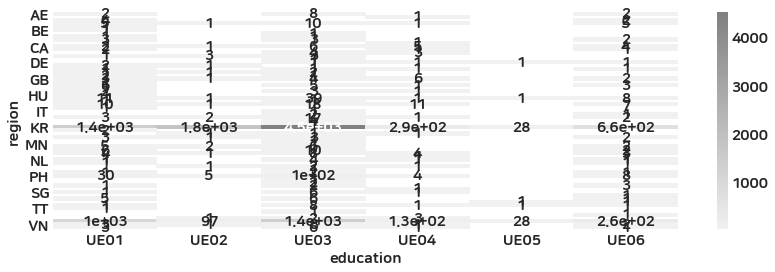

religion    UR00    UR01  UR02   UR03  UR04  UR05  UR06  UR07  UR08  UR09  \
region                                                                      
AE           2.0     3.0   NaN    5.0   NaN   1.0   1.0   NaN   NaN   NaN   
AL           NaN     NaN   NaN    1.0   NaN   NaN   NaN   NaN   NaN   NaN   
AR           4.0     2.0   NaN    NaN   NaN   NaN   NaN   NaN   NaN   NaN   
AU          14.0     4.0   NaN    2.0   NaN   NaN   NaN   NaN   NaN   NaN   
AZ           NaN     NaN   NaN    NaN   NaN   1.0   NaN   NaN   NaN   NaN   
...          ...     ...   ...    ...   ...   ...   ...   ...   ...   ...   
TZ           NaN     1.0   NaN    NaN   NaN   NaN   NaN   NaN   NaN   NaN   
UA           1.0     5.0   NaN    NaN   NaN   NaN   NaN   NaN   NaN   NaN   
US        1024.0  1166.0  80.0  375.0   2.0  19.0   9.0   4.0   1.0   1.0   
VN           7.0     1.0   1.0    NaN   NaN   NaN   NaN   NaN   NaN   NaN   
ZA           1.0     9.0   NaN    NaN   NaN   NaN   1.0   NaN   NaN   NaN   

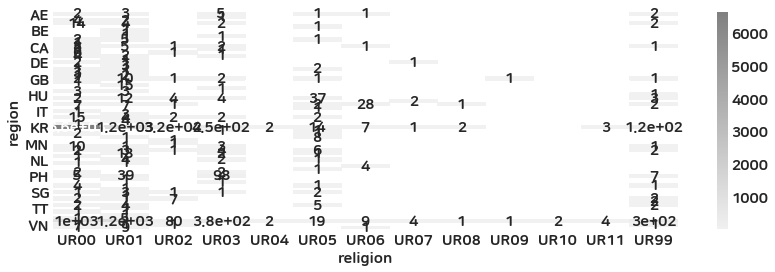

smoking   SM00   SM01    SM02
region                       
AE         NaN    3.0    11.0
AL         NaN    1.0     NaN
AR         NaN    1.0     5.0
AU         2.0    2.0    18.0
AZ         NaN    NaN     1.0
...        ...    ...     ...
TZ         NaN    NaN     1.0
UA         NaN    NaN     6.0
US       221.0  551.0  2211.0
VN         1.0    2.0     7.0
ZA         NaN    3.0     8.0

[67 rows x 3 columns]


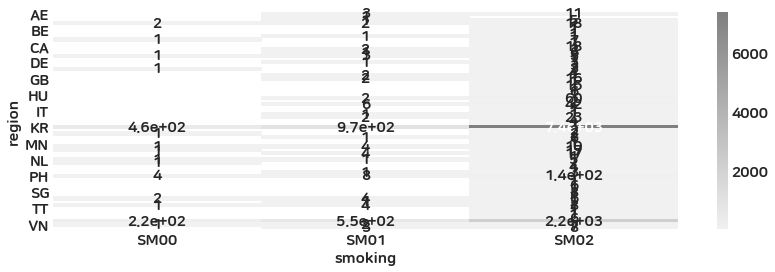

drinking   DR00    DR01   DR02
region                        
AE          NaN    10.0    4.0
AL          NaN     1.0    NaN
AR          NaN     5.0    1.0
AU          4.0    14.0    4.0
AZ          NaN     1.0    NaN
...         ...     ...    ...
TZ          NaN     NaN    1.0
UA          NaN     3.0    3.0
US        156.0  1947.0  882.0
VN          NaN     7.0    3.0
ZA          NaN     7.0    4.0

[67 rows x 3 columns]


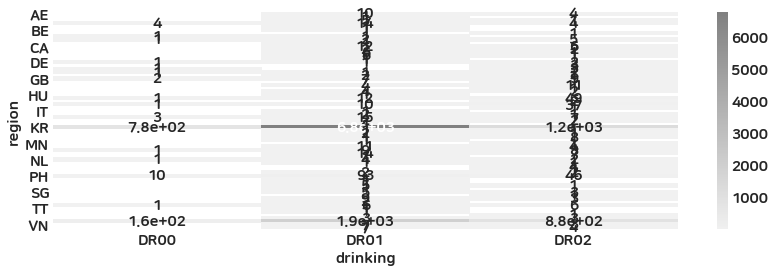

region    AE   AL   AR    AU   AZ  BE  BH  BO  BR  BY  ...  TH  TN  TR  TT  \
region                                                 ...                   
AE      14.0  NaN  NaN   NaN  NaN NaN NaN NaN NaN NaN  ... NaN NaN NaN NaN   
AL       NaN  1.0  NaN   NaN  NaN NaN NaN NaN NaN NaN  ... NaN NaN NaN NaN   
AR       NaN  NaN  8.0   NaN  NaN NaN NaN NaN NaN NaN  ... NaN NaN NaN NaN   
AU       NaN  NaN  NaN  22.0  NaN NaN NaN NaN NaN NaN  ... NaN NaN NaN NaN   
AZ       NaN  NaN  NaN   NaN  1.0 NaN NaN NaN NaN NaN  ... NaN NaN NaN NaN   
...      ...  ...  ...   ...  ...  ..  ..  ..  ..  ..  ...  ..  ..  ..  ..   
TZ       NaN  NaN  NaN   NaN  NaN NaN NaN NaN NaN NaN  ... NaN NaN NaN NaN   
UA       NaN  NaN  NaN   NaN  NaN NaN NaN NaN NaN NaN  ... NaN NaN NaN NaN   
US       NaN  NaN  NaN   NaN  NaN NaN NaN NaN NaN NaN  ... NaN NaN NaN NaN   
VN       NaN  NaN  NaN   NaN  NaN NaN NaN NaN NaN NaN  ... NaN NaN NaN NaN   
ZA       NaN  NaN  NaN   NaN  NaN NaN NaN NaN NaN NaN  ... NaN N

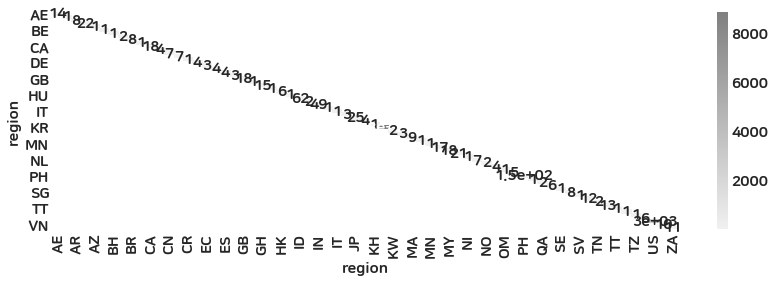

current_region    AE   AL   AR  AT    AU   AZ   BD  BE  BH   BJ  ...   TR  TT  \
region                                                           ...            
AE              14.0  NaN  NaN NaN   NaN  NaN  NaN NaN NaN  NaN  ...  NaN NaN   
AL               NaN  1.0  NaN NaN   NaN  NaN  NaN NaN NaN  NaN  ...  NaN NaN   
AR               NaN  NaN  8.0 NaN   NaN  NaN  NaN NaN NaN  NaN  ...  NaN NaN   
AU               NaN  NaN  NaN NaN  19.0  NaN  NaN NaN NaN  NaN  ...  NaN NaN   
AZ               NaN  NaN  NaN NaN   NaN  1.0  NaN NaN NaN  NaN  ...  NaN NaN   
...              ...  ...  ...  ..   ...  ...  ...  ..  ..  ...  ...  ...  ..   
TZ               NaN  NaN  NaN NaN   NaN  NaN  NaN NaN NaN  NaN  ...  NaN NaN   
UA               NaN  NaN  NaN NaN   NaN  NaN  NaN NaN NaN  NaN  ...  NaN NaN   
US               NaN  NaN  NaN NaN   2.0  1.0  2.0 NaN NaN  2.0  ...  1.0 NaN   
VN               NaN  NaN  NaN NaN   NaN  NaN  NaN NaN NaN  NaN  ...  NaN NaN   
ZA               NaN  NaN  N

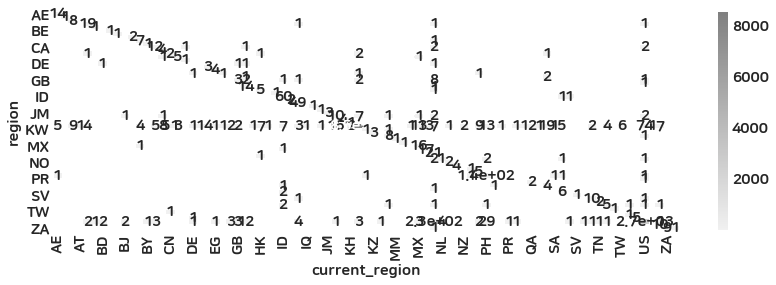

language  ar   de      en    es   fr  in  iw  ja    ko  nb  pt   ru   sq  th  \
region                                                                         
AE       NaN  NaN    13.0   NaN  NaN NaN NaN NaN   NaN NaN NaN  NaN  NaN NaN   
AL       NaN  NaN     NaN   NaN  NaN NaN NaN NaN   NaN NaN NaN  NaN  1.0 NaN   
AR       NaN  NaN     NaN   8.0  NaN NaN NaN NaN   NaN NaN NaN  NaN  NaN NaN   
AU       NaN  NaN    19.0   NaN  NaN NaN NaN NaN   2.0 NaN NaN  NaN  NaN NaN   
AZ       NaN  NaN     1.0   NaN  NaN NaN NaN NaN   NaN NaN NaN  NaN  NaN NaN   
...       ..  ...     ...   ...  ...  ..  ..  ..   ...  ..  ..  ...  ...  ..   
TZ       NaN  NaN     1.0   NaN  NaN NaN NaN NaN   NaN NaN NaN  NaN  NaN NaN   
UA       NaN  NaN     NaN   NaN  NaN NaN NaN NaN   NaN NaN NaN  3.0  NaN NaN   
US       NaN  1.0  2948.0  16.0  1.0 NaN NaN NaN  35.0 NaN NaN  1.0  NaN NaN   
VN       NaN  NaN     8.0   NaN  NaN NaN NaN NaN   1.0 NaN NaN  NaN  NaN NaN   
ZA       NaN  NaN    11.0   NaN  NaN NaN

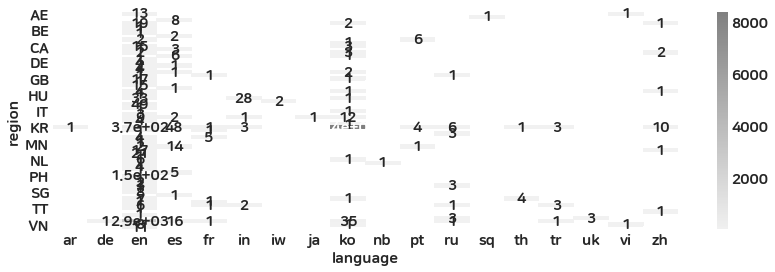

is_out       N      Y
region               
AE        10.0    4.0
AL         NaN    1.0
AR         6.0    2.0
AU        13.0    9.0
AZ         NaN    1.0
...        ...    ...
TZ         1.0    NaN
UA         5.0    1.0
US      2137.0  866.0
VN         6.0    4.0
ZA         6.0    5.0

[67 rows x 2 columns]


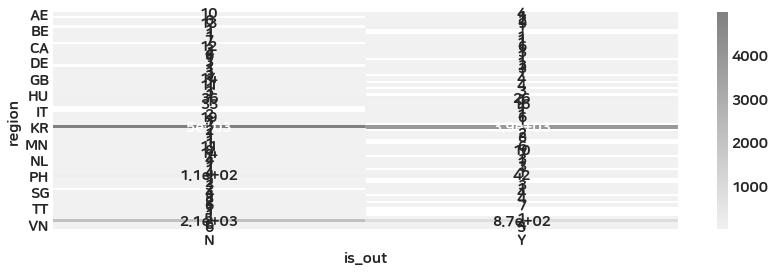

is_deactivated       N       Y
region                        
AE                 3.0    11.0
AL                 NaN     1.0
AR                 NaN     8.0
AU                 9.0    13.0
AZ                 1.0     NaN
...                ...     ...
TZ                 NaN     1.0
UA                 1.0     5.0
US              1272.0  1731.0
VN                 2.0     8.0
ZA                 3.0     8.0

[67 rows x 2 columns]


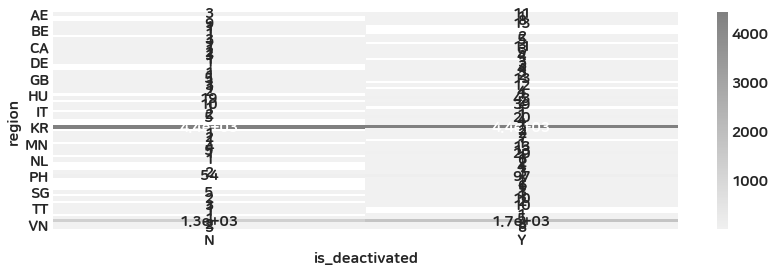

is_blocked    Y
region         
ID            1
JP            3
KR          527
MY            1
US           34


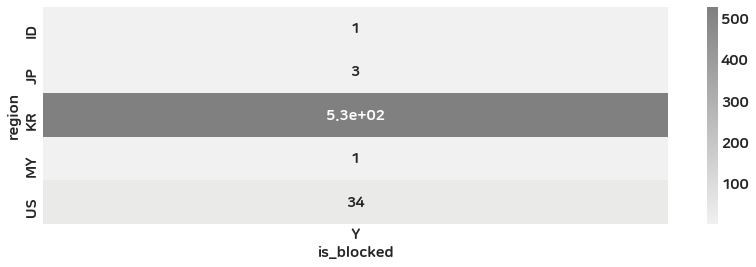

is_confirm      N       Y
region                   
AE            1.0     7.0
AR            NaN     3.0
AU            NaN    16.0
AZ            NaN     1.0
BE            NaN     1.0
BH            NaN     1.0
BR            NaN     6.0
BY            NaN     1.0
CA            NaN    13.0
CL            NaN     3.0
CN            NaN     6.0
CO            NaN     5.0
CR            NaN     1.0
DE            NaN     1.0
EC            NaN     1.0
EG            NaN     2.0
ES            NaN     3.0
FR            NaN     2.0
GB            NaN    13.0
GE            NaN     1.0
GH            NaN    13.0
HK            NaN     4.0
HU            NaN     1.0
ID            2.0    50.0
IL            NaN     1.0
IN            1.0    28.0
IT            NaN     1.0
JM            NaN     2.0
JP            5.0    17.0
KE            NaN     3.0
KH            NaN     1.0
KR          400.0  7455.0
KW            NaN     1.0
KZ            NaN     3.0
MA            NaN     7.0
MM            NaN     1.0
MX          

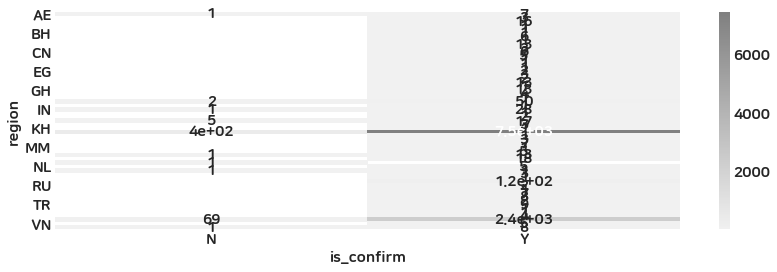

sign_up_completed      N       Y
region                          
AE                   8.0     6.0
AL                   1.0     NaN
AR                   5.0     3.0
AU                   6.0    16.0
AZ                   NaN     1.0
...                  ...     ...
TZ                   NaN     1.0
UA                   3.0     3.0
US                 813.0  2190.0
VN                   6.0     4.0
ZA                   3.0     8.0

[67 rows x 2 columns]


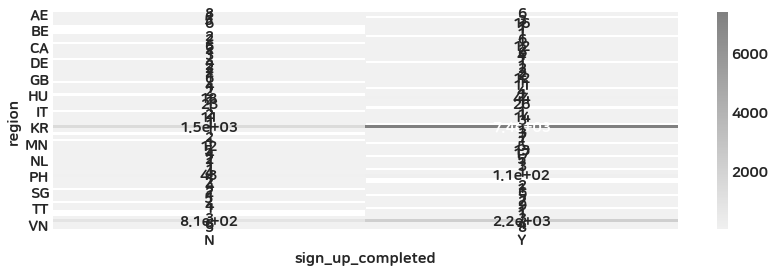

stage   Attraction  Body  Drinking  Education  Height  Interest   Job  \
region                                                                  
AE             NaN   NaN       NaN        NaN     NaN       NaN   NaN   
AL             NaN   NaN       NaN        NaN     NaN       NaN   NaN   
AR             NaN   2.0       NaN        NaN     NaN       NaN   NaN   
AU             NaN   NaN       NaN        NaN     NaN       NaN   NaN   
BO             NaN   NaN       NaN        NaN     NaN       NaN   NaN   
BR             NaN   NaN       NaN        NaN     NaN       NaN   NaN   
CA             NaN   NaN       NaN        NaN     NaN       NaN   NaN   
CL             NaN   NaN       NaN        NaN     NaN       NaN   NaN   
CN             NaN   NaN       NaN        NaN     NaN       NaN   NaN   
CO             NaN   NaN       NaN        NaN     NaN       NaN   NaN   
DE             NaN   NaN       NaN        NaN     NaN       NaN   NaN   
EC             NaN   NaN       NaN        NaN     N

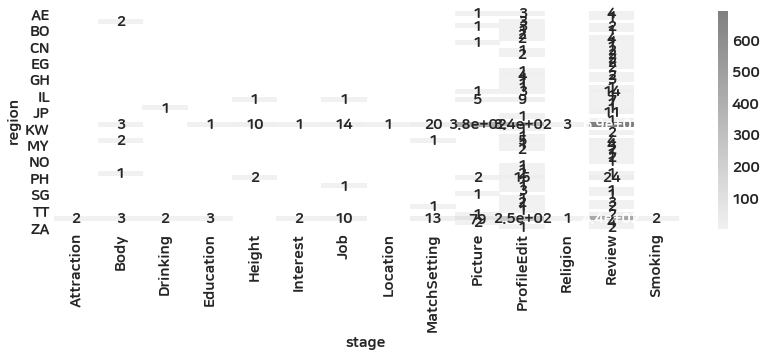

weekdays      0      1      2      3      4      5      6
region                                                   
AE          2.0    NaN    NaN    3.0    3.0    4.0    2.0
AL          NaN    NaN    NaN    NaN    NaN    NaN    1.0
AR          2.0    NaN    NaN    2.0    2.0    1.0    1.0
AU          3.0    3.0    5.0    3.0    2.0    3.0    3.0
AZ          NaN    NaN    NaN    NaN    NaN    NaN    1.0
...         ...    ...    ...    ...    ...    ...    ...
TZ          NaN    NaN    NaN    1.0    NaN    NaN    NaN
UA          NaN    1.0    1.0    1.0    NaN    2.0    1.0
US        472.0  415.0  439.0  438.0  373.0  456.0  410.0
VN          3.0    NaN    1.0    2.0    2.0    NaN    2.0
ZA          2.0    4.0    1.0    2.0    1.0    1.0    NaN

[67 rows x 7 columns]


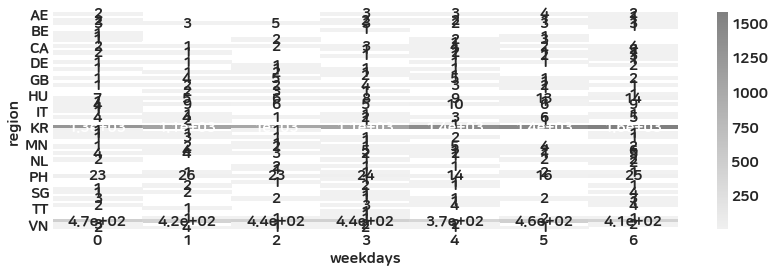

sign_hours     0      1      2      3      4      5      6      7      8   \
region                                                                      
AE            NaN    NaN    NaN    NaN    1.0    1.0    1.0    NaN    1.0   
AL            NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
AR            NaN    NaN    2.0    1.0    1.0    NaN    1.0    NaN    NaN   
AU            1.0    1.0    1.0    3.0    1.0    1.0    NaN    3.0    1.0   
AZ            NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
...           ...    ...    ...    ...    ...    ...    ...    ...    ...   
TZ            NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
UA            NaN    NaN    NaN    NaN    NaN    NaN    NaN    1.0    NaN   
US          198.0  174.0  193.0  184.0  187.0  165.0  146.0  122.0  100.0   
VN            NaN    NaN    NaN    2.0    NaN    NaN    1.0    NaN    NaN   
ZA            NaN    NaN    NaN    NaN    NaN    NaN    1.0    NaN    2.0   

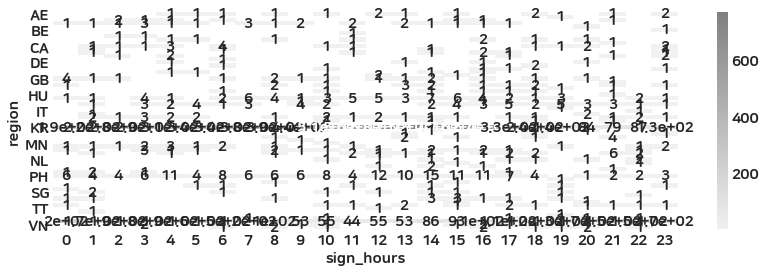

profile_tier    Bronze  Diamond   Gold  Silver
current_region                                
AE                 NaN      9.0    1.0     1.0
AR                 NaN      3.0    5.0     2.0
AT                 NaN      NaN    1.0     NaN
AU                 NaN     15.0    2.0     NaN
AZ                 NaN      NaN    1.0     NaN
...                ...      ...    ...     ...
UA                 NaN      3.0    1.0     NaN
US                17.0    771.0  825.0   600.0
VE                 NaN      NaN    NaN     1.0
VN                 NaN     10.0    4.0     NaN
ZA                 NaN      8.0    NaN     NaN

[70 rows x 4 columns]


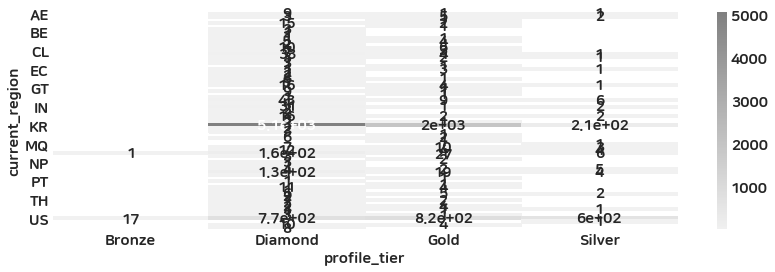

body_type        BF00   BF01   BF02   BF03   BF04   BF05  BM00  BM02  BM04
current_region                                                            
AE                1.0    3.0   13.0    NaN    NaN    3.0   NaN   NaN   NaN
AL                NaN    NaN    NaN    NaN    1.0    NaN   NaN   NaN   NaN
AR                1.0    2.0    9.0    NaN    3.0    NaN   NaN   NaN   NaN
AT                NaN    NaN    1.0    NaN    NaN    NaN   NaN   NaN   NaN
AU                1.0    5.0   12.0    3.0    4.0    1.0   NaN   NaN   NaN
...               ...    ...    ...    ...    ...    ...   ...   ...   ...
US              180.0  333.0  977.0  399.0  513.0  360.0   NaN   1.0   1.0
VE                1.0    NaN    NaN    NaN    NaN    NaN   NaN   NaN   NaN
VN                NaN    5.0    5.0    3.0    NaN    6.0   NaN   NaN   NaN
ZA                NaN    2.0    6.0    NaN    NaN    1.0   NaN   NaN   NaN
ZW                NaN    1.0    NaN    NaN    NaN    NaN   NaN   NaN   NaN

[83 rows x 9 columns]


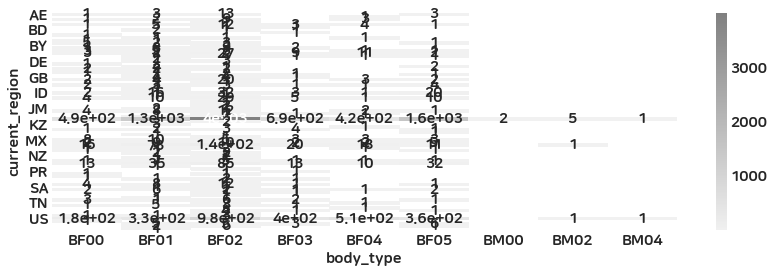

blood_type          A     AB      B      O
current_region                            
AE                1.0    NaN    NaN    1.0
AR                NaN    1.0    NaN    NaN
AU                3.0    NaN    1.0    1.0
AZ                1.0    NaN    NaN    NaN
BE                NaN    1.0    NaN    NaN
BJ                2.0    NaN    NaN    NaN
BO                1.0    NaN    NaN    NaN
BR                1.0    NaN    NaN    NaN
CA                5.0    1.0    3.0    NaN
CL                2.0    NaN    NaN    2.0
CN                NaN    3.0    1.0    1.0
CO                1.0    NaN    NaN    2.0
DE                NaN    1.0    NaN    NaN
EC                NaN    NaN    1.0    1.0
GB                NaN    1.0    NaN    NaN
GH                2.0    1.0    2.0    1.0
HK                1.0    NaN    NaN    1.0
ID                4.0    1.0   14.0   12.0
IL                NaN    NaN    NaN    1.0
IN                1.0    4.0    3.0    5.0
JP                3.0    1.0    4.0    1.0
KE         

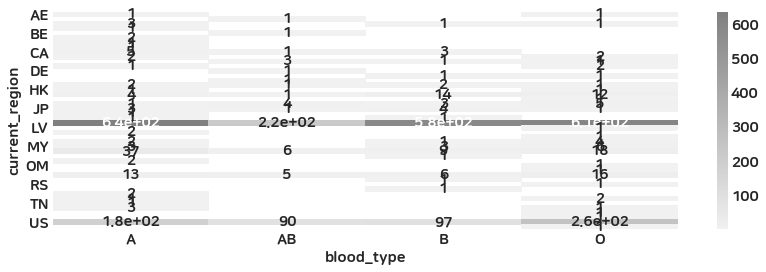

education        UE01  UE02    UE03  UE04  UE05   UE06
current_region                                        
AE                2.0   NaN    13.0   NaN   NaN    3.0
AL                NaN   NaN     NaN   1.0   NaN    NaN
AR                7.0   1.0     2.0   NaN   NaN    5.0
AT                NaN   NaN     1.0   NaN   NaN    NaN
AU                6.0   2.0    12.0   3.0   NaN    3.0
...               ...   ...     ...   ...   ...    ...
US              977.0  95.0  1296.0  97.0  20.0  225.0
VE                1.0   NaN     NaN   NaN   NaN    NaN
VN                6.0   1.0     9.0   1.0   NaN    2.0
ZA                3.0   NaN     4.0   1.0   NaN    1.0
ZW                NaN   NaN     1.0   NaN   NaN    NaN

[83 rows x 6 columns]


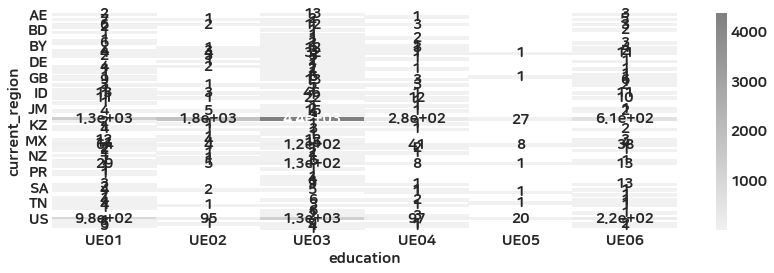

religion          UR00   UR01  UR02   UR03  UR04  UR05  UR06  UR07  UR08  \
current_region                                                             
AE                 4.0    3.0   1.0    8.0   NaN   1.0   1.0   NaN   NaN   
AL                 NaN    NaN   NaN    1.0   NaN   NaN   NaN   NaN   NaN   
AR                 8.0    4.0   1.0    1.0   NaN   NaN   NaN   NaN   NaN   
AT                 NaN    1.0   NaN    NaN   NaN   NaN   NaN   NaN   NaN   
AU                18.0    4.0   NaN    3.0   NaN   NaN   NaN   NaN   NaN   
...                ...    ...   ...    ...   ...   ...   ...   ...   ...   
US              1034.0  966.0  77.0  338.0   2.0  17.0  10.0   4.0   1.0   
VE                 NaN    1.0   NaN    NaN   NaN   NaN   NaN   NaN   NaN   
VN                12.0    3.0   2.0    1.0   NaN   NaN   NaN   NaN   NaN   
ZA                 1.0    8.0   NaN    NaN   NaN   NaN   NaN   NaN   NaN   
ZW                 NaN    1.0   NaN    NaN   NaN   NaN   NaN   NaN   NaN   

religion   

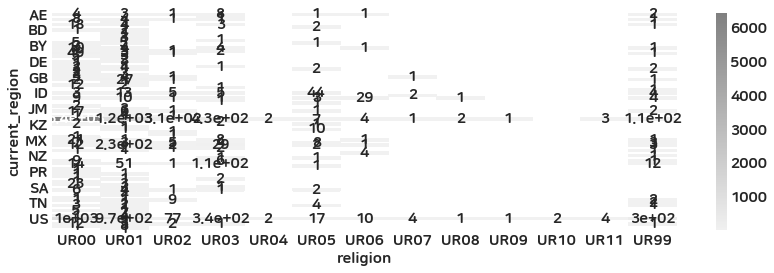

smoking          SM00   SM01    SM02
current_region                      
AE                NaN    4.0    16.0
AL                NaN    1.0     NaN
AR                1.0    2.0    12.0
AT                NaN    NaN     1.0
AU                2.0    2.0    22.0
...               ...    ...     ...
US              217.0  496.0  2036.0
VE                NaN    NaN     1.0
VN                1.0    3.0    15.0
ZA                NaN    3.0     6.0
ZW                NaN    NaN     1.0

[83 rows x 3 columns]


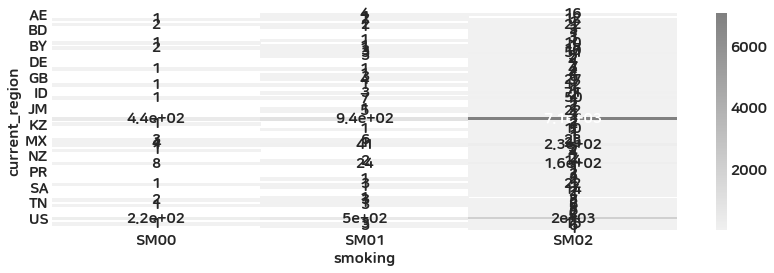

drinking         DR00    DR01   DR02
current_region                      
AE                NaN    13.0    7.0
AL                NaN     1.0    NaN
AR                NaN    11.0    4.0
AT                NaN     1.0    NaN
AU                5.0    18.0    3.0
...               ...     ...    ...
US              148.0  1849.0  753.0
VE                NaN     NaN    1.0
VN                NaN    15.0    4.0
ZA                NaN     7.0    2.0
ZW                NaN     NaN    1.0

[83 rows x 3 columns]


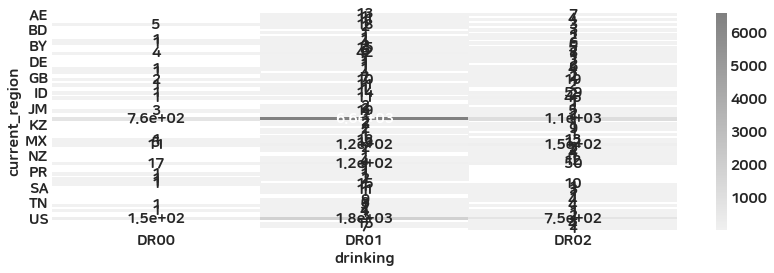

region            AE   AL   AR    AU  AZ  BE  BH  BO  BR  BY  ...   TH  TN  \
current_region                                                ...            
AE              14.0  NaN  NaN   NaN NaN NaN NaN NaN NaN NaN  ...  NaN NaN   
AL               NaN  1.0  NaN   NaN NaN NaN NaN NaN NaN NaN  ...  NaN NaN   
AR               NaN  NaN  8.0   NaN NaN NaN NaN NaN NaN NaN  ...  NaN NaN   
AT               NaN  NaN  NaN   NaN NaN NaN NaN NaN NaN NaN  ...  NaN NaN   
AU               NaN  NaN  NaN  19.0 NaN NaN NaN NaN NaN NaN  ...  NaN NaN   
...              ...  ...  ...   ...  ..  ..  ..  ..  ..  ..  ...  ...  ..   
US               NaN  NaN  NaN   1.0 NaN NaN NaN NaN NaN NaN  ...  1.0 NaN   
VE               NaN  NaN  NaN   NaN NaN NaN NaN NaN NaN NaN  ...  NaN NaN   
VN               NaN  NaN  NaN   NaN NaN NaN NaN NaN NaN NaN  ...  NaN NaN   
ZA               NaN  NaN  NaN   NaN NaN NaN NaN NaN NaN NaN  ...  NaN NaN   
ZW               NaN  NaN  NaN   NaN NaN NaN NaN NaN NaN NaN  ..

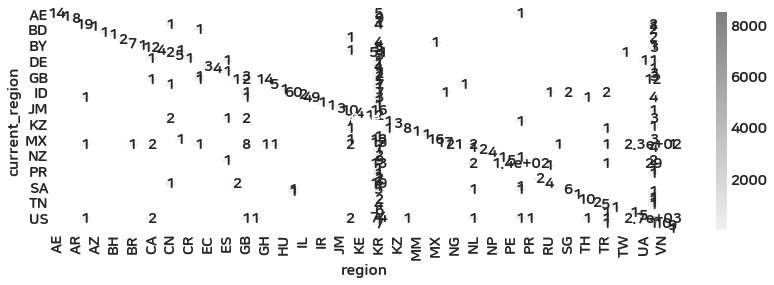

current_region    AE   AL    AR   AT    AU  AZ  BD  BE  BH  BJ  ...  TR  TT  \
current_region                                                  ...           
AE              20.0  NaN   NaN  NaN   NaN NaN NaN NaN NaN NaN  ... NaN NaN   
AL               NaN  1.0   NaN  NaN   NaN NaN NaN NaN NaN NaN  ... NaN NaN   
AR               NaN  NaN  17.0  NaN   NaN NaN NaN NaN NaN NaN  ... NaN NaN   
AT               NaN  NaN   NaN  1.0   NaN NaN NaN NaN NaN NaN  ... NaN NaN   
AU               NaN  NaN   NaN  NaN  26.0 NaN NaN NaN NaN NaN  ... NaN NaN   
...              ...  ...   ...  ...   ...  ..  ..  ..  ..  ..  ...  ..  ..   
US               NaN  NaN   NaN  NaN   NaN NaN NaN NaN NaN NaN  ... NaN NaN   
VE               NaN  NaN   NaN  NaN   NaN NaN NaN NaN NaN NaN  ... NaN NaN   
VN               NaN  NaN   NaN  NaN   NaN NaN NaN NaN NaN NaN  ... NaN NaN   
ZA               NaN  NaN   NaN  NaN   NaN NaN NaN NaN NaN NaN  ... NaN NaN   
ZW               NaN  NaN   NaN  NaN   NaN NaN NaN N

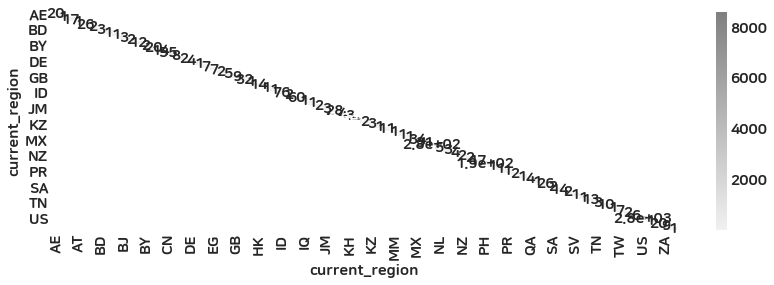

language        ar   de      en    es   fr  in  iw  ja    ko  nb  pt  ru   sq  \
current_region                                                                  
AE             NaN  NaN    18.0   NaN  NaN NaN NaN NaN   1.0 NaN NaN NaN  NaN   
AL             NaN  NaN     NaN   NaN  NaN NaN NaN NaN   NaN NaN NaN NaN  1.0   
AR             NaN  NaN     NaN  16.0  NaN NaN NaN NaN   1.0 NaN NaN NaN  NaN   
AT             NaN  NaN     NaN   NaN  NaN NaN NaN NaN   1.0 NaN NaN NaN  NaN   
AU             NaN  NaN    20.0   NaN  NaN NaN NaN NaN   4.0 NaN NaN NaN  NaN   
...             ..  ...     ...   ...  ...  ..  ..  ..   ...  ..  ..  ..  ...   
US             NaN  1.0  2739.0  16.0  2.0 NaN NaN NaN  55.0 NaN NaN NaN  NaN   
VE             NaN  NaN     NaN   1.0  NaN NaN NaN NaN   NaN NaN NaN NaN  NaN   
VN             NaN  NaN    11.0   NaN  NaN NaN NaN NaN   8.0 NaN NaN NaN  NaN   
ZA             NaN  NaN     9.0   NaN  NaN NaN NaN NaN   NaN NaN NaN NaN  NaN   
ZW             NaN  NaN     

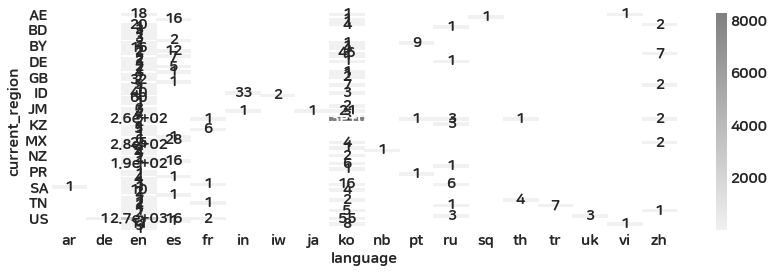

is_out               N      Y
current_region               
AE                14.0    6.0
AL                 NaN    1.0
AR                12.0    5.0
AT                 1.0    NaN
AU                16.0   10.0
...                ...    ...
US              1979.0  834.0
VE                 1.0    NaN
VN                14.0    6.0
ZA                 5.0    4.0
ZW                 NaN    1.0

[83 rows x 2 columns]


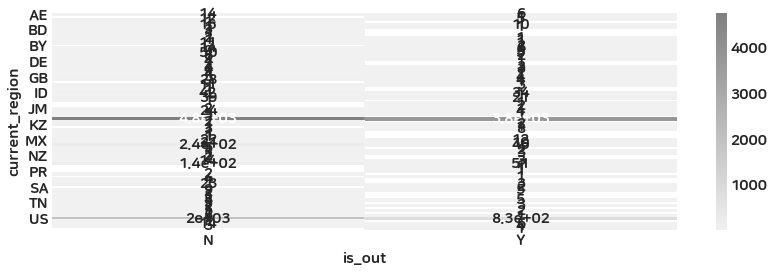

is_deactivated       N       Y
current_region                
AE                 7.0    13.0
AL                 NaN     1.0
AR                 4.0    13.0
AT                 1.0     NaN
AU                10.0    16.0
...                ...     ...
US              1202.0  1611.0
VE                 NaN     1.0
VN                 7.0    13.0
ZA                 3.0     6.0
ZW                 NaN     1.0

[83 rows x 2 columns]


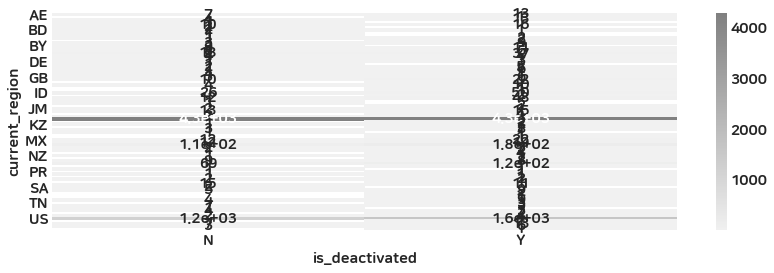

is_blocked        Y
current_region     
AR                1
CA                1
CN               38
HK                3
ID                2
IN                1
JP                4
KR              455
MY                2
NG                6
PH                4
RU               11
SG                1
US               35
VN                1


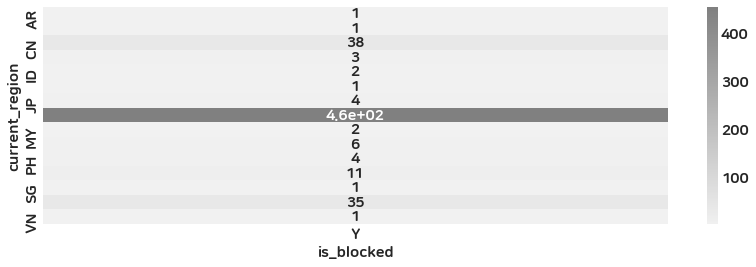

is_confirm         N       Y
current_region              
AE               2.0    11.0
AR               1.0    10.0
AT               NaN     1.0
AU               1.0    17.0
AZ               NaN     1.0
...              ...     ...
UA               NaN     4.0
US              56.0  2213.0
VE               NaN     1.0
VN               NaN    14.0
ZA               NaN     8.0

[72 rows x 2 columns]


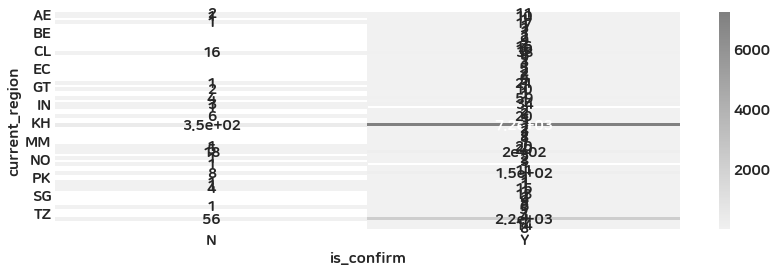

sign_up_completed      N       Y
current_region                  
AE                  10.0    10.0
AL                   1.0     NaN
AR                   7.0    10.0
AT                   NaN     1.0
AU                   9.0    17.0
...                  ...     ...
US                 776.0  2037.0
VE                   NaN     1.0
VN                   7.0    13.0
ZA                   1.0     8.0
ZW                   1.0     NaN

[83 rows x 2 columns]


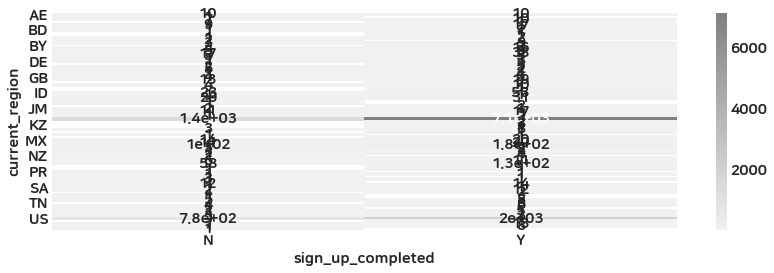

stage           Attraction  Birthday  Body  Drinking  Education  Height  \
current_region                                                            
AE                     NaN       NaN   NaN       NaN        NaN     NaN   
AL                     NaN       NaN   NaN       NaN        NaN     NaN   
AR                     NaN       NaN   2.0       NaN        NaN     NaN   
AU                     NaN       NaN   NaN       NaN        NaN     NaN   
AZ                     NaN       NaN   NaN       NaN        NaN     NaN   
...                    ...       ...   ...       ...        ...     ...   
UA                     NaN       NaN   NaN       NaN        NaN     NaN   
US                     2.0       1.0   2.0       2.0        3.0     NaN   
VN                     NaN       NaN   NaN       NaN        NaN     NaN   
ZA                     NaN       NaN   NaN       NaN        NaN     NaN   
ZW                     NaN       NaN   NaN       NaN        NaN     NaN   

stage           Interest

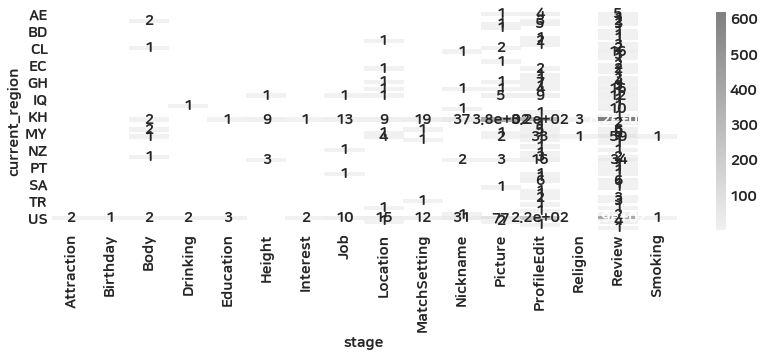

weekdays            0      1      2      3      4      5      6
current_region                                                 
AE                2.0    1.0    1.0    3.0    5.0    6.0    2.0
AL                NaN    NaN    NaN    NaN    NaN    NaN    1.0
AR                3.0    2.0    1.0    5.0    4.0    1.0    1.0
AT                NaN    NaN    NaN    1.0    NaN    NaN    NaN
AU                4.0    4.0    6.0    3.0    2.0    3.0    4.0
...               ...    ...    ...    ...    ...    ...    ...
US              450.0  388.0  411.0  413.0  343.0  426.0  382.0
VE                NaN    NaN    NaN    NaN    NaN    NaN    1.0
VN                3.0    2.0    1.0    3.0    6.0    1.0    4.0
ZA                2.0    3.0    1.0    1.0    1.0    1.0    NaN
ZW                NaN    1.0    NaN    NaN    NaN    NaN    NaN

[83 rows x 7 columns]


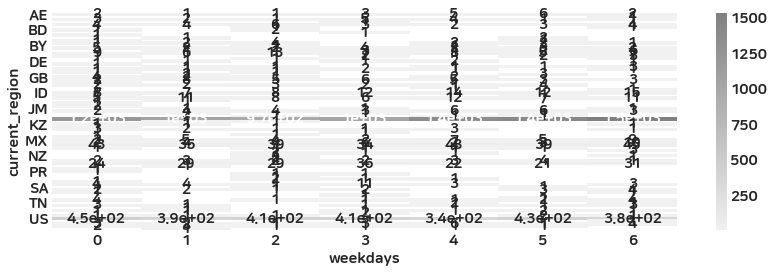

sign_hours         0      1      2      3      4      5      6      7     8   \
current_region                                                                 
AE                1.0    NaN    NaN    NaN    1.0    1.0    1.0    NaN   1.0   
AL                NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   NaN   
AR                2.0    2.0    2.0    1.0    1.0    NaN    2.0    NaN   1.0   
AT                NaN    1.0    NaN    NaN    NaN    NaN    NaN    NaN   NaN   
AU                1.0    2.0    2.0    3.0    NaN    1.0    1.0    2.0   1.0   
...               ...    ...    ...    ...    ...    ...    ...    ...   ...   
US              184.0  166.0  184.0  182.0  189.0  165.0  138.0  113.0  89.0   
VE                1.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN   NaN   
VN                1.0    NaN    NaN    2.0    1.0    NaN    4.0    NaN   NaN   
ZA                NaN    NaN    NaN    NaN    NaN    NaN    1.0    NaN   2.0   
ZW                NaN    NaN    NaN    N

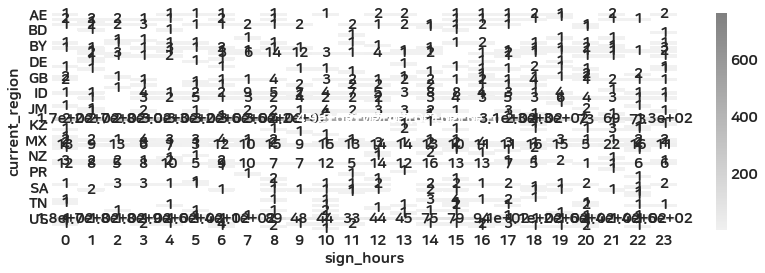

profile_tier  Bronze  Diamond    Gold  Silver
language                                     
de               NaN      1.0     NaN     NaN
en              18.0   1306.0   991.0   661.0
es               NaN     24.0    30.0    13.0
fr               NaN      5.0     3.0     1.0
in               NaN     19.0     4.0     3.0
iw               NaN      1.0     NaN     NaN
ja               NaN      NaN     NaN     1.0
ko               NaN   5092.0  1884.0   177.0
nb               NaN      NaN     1.0     NaN
pt               NaN      4.0     3.0     1.0
ru               NaN      6.0     5.0     1.0
th               NaN      2.0     NaN     1.0
tr               NaN      2.0     2.0     NaN
uk               NaN      2.0     NaN     NaN
vi               NaN      1.0     NaN     NaN
zh               NaN      5.0     5.0     NaN


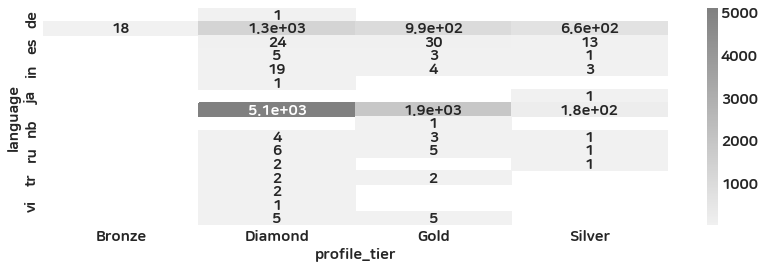

body_type   BF00    BF01    BF02   BF03   BF04    BF05  BM00  BM02  BM04
language                                                                
ar           NaN     1.0     NaN    NaN    NaN     NaN   NaN   NaN   NaN
de           NaN     NaN     NaN    1.0    NaN     NaN   NaN   NaN   NaN
en         237.0   578.0  1437.0  489.0  577.0   456.0   NaN   3.0   1.0
es          21.0    26.0    30.0    5.0    9.0    11.0   NaN   NaN   NaN
fr           2.0     2.0     3.0    2.0    1.0     1.0   NaN   NaN   NaN
in           1.0     7.0    14.0    NaN    NaN    12.0   NaN   NaN   NaN
iw           NaN     1.0     1.0    NaN    NaN     NaN   NaN   NaN   NaN
ja           NaN     NaN     NaN    NaN    NaN     1.0   NaN   NaN   NaN
ko         492.0  1314.0  3987.0  679.0  420.0  1548.0   2.0   5.0   1.0
nb           NaN     NaN     NaN    NaN    NaN     1.0   NaN   NaN   NaN
pt           4.0     2.0     5.0    NaN    NaN     NaN   NaN   NaN   NaN
ru           5.0     7.0     5.0    NaN    NaN     

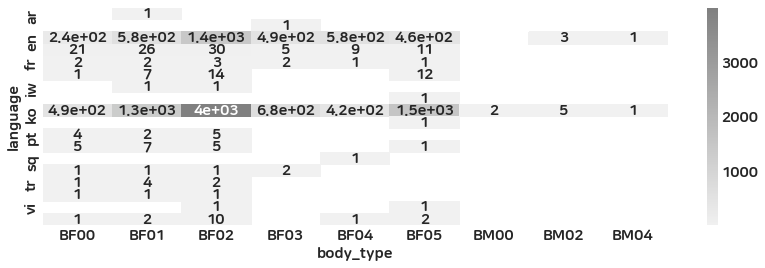

blood_type      A     AB      B      O
language                              
de            NaN    1.0    NaN    NaN
en          281.0  110.0  153.0  341.0
es            7.0    2.0    3.0    7.0
fr            1.0    NaN    NaN    2.0
in            2.0    NaN    5.0    7.0
iw            NaN    NaN    NaN    1.0
ko          621.0  222.0  569.0  592.0
pt            1.0    NaN    NaN    NaN
ru            1.0    NaN    2.0    NaN
th            NaN    NaN    NaN    1.0
tr            2.0    NaN    NaN    1.0
zh            1.0    1.0    1.0    NaN


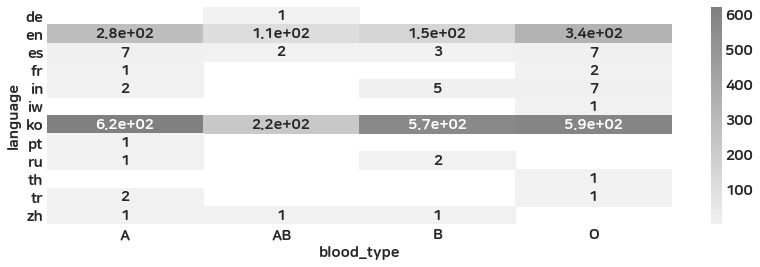

education    UE01    UE02    UE03   UE04  UE05   UE06
language                                             
ar            1.0     NaN     NaN    NaN   NaN    NaN
de            NaN     NaN     NaN    NaN   NaN    1.0
en         1160.0   113.0  1854.0  220.0  32.0  326.0
es           41.0    13.0    30.0    1.0   NaN   15.0
fr            3.0     NaN     4.0    1.0   1.0    2.0
in            7.0     1.0    18.0    NaN   NaN    8.0
iw            1.0     NaN     1.0    NaN   NaN    NaN
ja            NaN     NaN     1.0    NaN   NaN    NaN
ko         1327.0  1805.0  4309.0  249.0  27.0  630.0
nb            NaN     NaN     NaN    NaN   NaN    1.0
pt            6.0     NaN     1.0    NaN   NaN    4.0
ru            4.0     2.0     6.0    3.0   NaN    3.0
sq            NaN     NaN     NaN    1.0   NaN    NaN
th            2.0     NaN     3.0    NaN   NaN    NaN
tr            3.0     1.0     1.0    1.0   NaN    1.0
uk            NaN     NaN     2.0    1.0   NaN    NaN
vi            NaN     NaN   

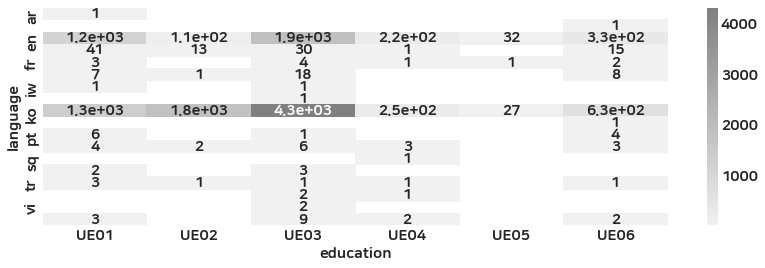

religion    UR00    UR01   UR02   UR03  UR04  UR05  UR06  UR07  UR08  UR09  \
language                                                                     
ar           NaN     1.0    NaN    NaN   NaN   NaN   NaN   NaN   NaN   NaN   
de           NaN     NaN    NaN    1.0   NaN   NaN   NaN   NaN   NaN   NaN   
en        1267.0  1391.0  109.0  528.0   1.0  64.0  45.0   6.0   2.0   1.0   
es          55.0    21.0    1.0   21.0   NaN   NaN   1.0   NaN   NaN   NaN   
fr           2.0     NaN    NaN    1.0   NaN   7.0   NaN   NaN   NaN   NaN   
in           NaN     8.0    1.0    1.0   NaN  24.0   NaN   NaN   NaN   NaN   
iw           NaN     NaN    NaN    NaN   NaN   NaN   NaN   2.0   NaN   NaN   
ja           1.0     NaN    NaN    NaN   NaN   NaN   NaN   NaN   NaN   NaN   
ko        6432.0  1160.0  307.0  410.0   3.0   5.0   5.0   NaN   2.0   1.0   
nb           1.0     NaN    NaN    NaN   NaN   NaN   NaN   NaN   NaN   NaN   
pt           5.0     5.0    NaN    NaN   NaN   1.0   NaN   NaN  

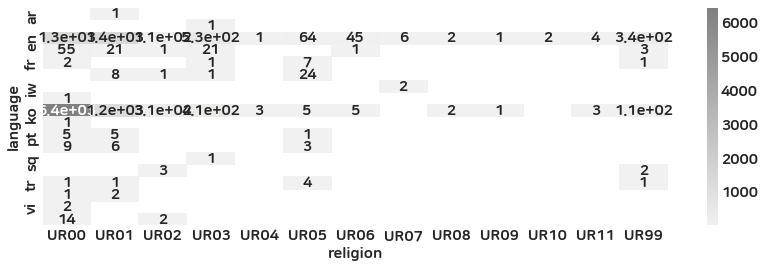

smoking    SM00   SM01    SM02
language                      
ar          NaN    NaN     1.0
de          NaN    NaN     1.0
en        241.0  633.0  2882.0
es          4.0   16.0    82.0
fr          1.0    2.0     8.0
in          NaN    2.0    32.0
iw          NaN    NaN     2.0
ja          NaN    NaN     1.0
ko        442.0  926.0  7067.0
nb          1.0    NaN     NaN
pt          1.0    NaN    10.0
ru          2.0    3.0    13.0
sq          NaN    1.0     NaN
th          2.0    1.0     2.0
tr          1.0    1.0     5.0
uk          NaN    NaN     3.0
vi          NaN    NaN     2.0
zh          NaN    NaN    16.0


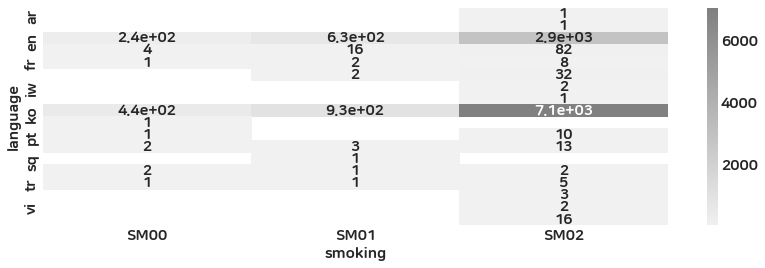

drinking   DR00    DR01    DR02
language                       
ar          NaN     NaN     1.0
de          NaN     1.0     NaN
en        201.0  2408.0  1150.0
es          2.0    50.0    50.0
fr          NaN     5.0     6.0
in          NaN     8.0    26.0
iw          NaN     NaN     2.0
ja          NaN     1.0     NaN
ko        760.0  6528.0  1147.0
nb          NaN     1.0     NaN
pt          2.0     4.0     5.0
ru          NaN    13.0     5.0
sq          NaN     1.0     NaN
th          1.0     3.0     1.0
tr          1.0     2.0     4.0
uk          NaN     2.0     1.0
vi          NaN     2.0     NaN
zh          1.0    12.0     3.0


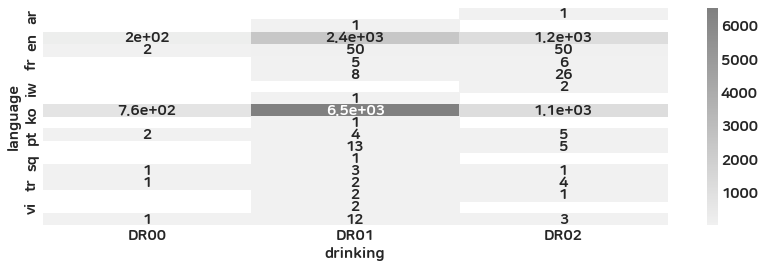

region      AE   AL   AR    AU   AZ   BE   BH   BO   BR   BY  ...   TH   TN  \
language                                                      ...             
ar         NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
de         NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
en        13.0  NaN  NaN  19.0  1.0  1.0  1.0  NaN  2.0  NaN  ...  7.0  1.0   
es         NaN  NaN  8.0   NaN  NaN  NaN  NaN  2.0  NaN  NaN  ...  NaN  NaN   
fr         NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  1.0   
in         NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
iw         NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
ja         NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
ko         NaN  NaN  NaN   2.0  NaN  NaN  NaN  NaN  NaN  1.0  ...  1.0  NaN   
nb         NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
pt         NaN  NaN  NaN   NaN  NaN  NaN  NaN  NaN  

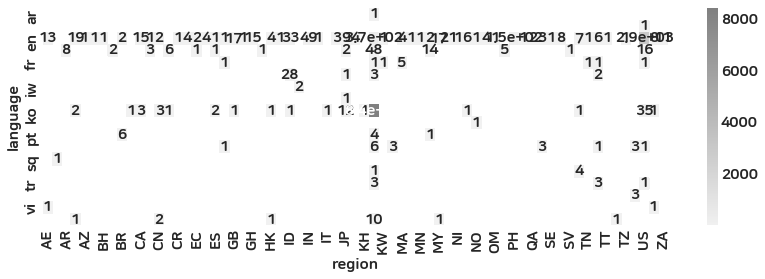

current_region    AE   AL    AR   AT    AU   AZ   BD   BE   BH   BJ  ...   TR  \
language                                                             ...        
ar               NaN  NaN   NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
de               NaN  NaN   NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
en              18.0  NaN   NaN  NaN  20.0  1.0  3.0  1.0  1.0  3.0  ...  2.0   
es               NaN  NaN  16.0  NaN   NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
fr               NaN  NaN   NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
in               NaN  NaN   NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
iw               NaN  NaN   NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
ja               NaN  NaN   NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
ko               1.0  NaN   1.0  1.0   4.0  NaN  NaN  NaN  NaN  NaN  ...  NaN   
nb               NaN  NaN   NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
pt               NaN  NaN   

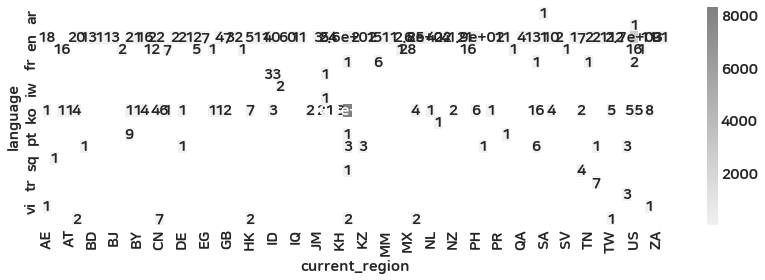

language   ar   de      en     es    fr    in   iw   ja      ko   nb    pt  \
language                                                                     
ar        1.0  NaN     NaN    NaN   NaN   NaN  NaN  NaN     NaN  NaN   NaN   
de        NaN  1.0     NaN    NaN   NaN   NaN  NaN  NaN     NaN  NaN   NaN   
en        NaN  NaN  3843.0    NaN   NaN   NaN  NaN  NaN     NaN  NaN   NaN   
es        NaN  NaN     NaN  109.0   NaN   NaN  NaN  NaN     NaN  NaN   NaN   
fr        NaN  NaN     NaN    NaN  11.0   NaN  NaN  NaN     NaN  NaN   NaN   
in        NaN  NaN     NaN    NaN   NaN  34.0  NaN  NaN     NaN  NaN   NaN   
iw        NaN  NaN     NaN    NaN   NaN   NaN  2.0  NaN     NaN  NaN   NaN   
ja        NaN  NaN     NaN    NaN   NaN   NaN  NaN  1.0     NaN  NaN   NaN   
ko        NaN  NaN     NaN    NaN   NaN   NaN  NaN  NaN  8509.0  NaN   NaN   
nb        NaN  NaN     NaN    NaN   NaN   NaN  NaN  NaN     NaN  1.0   NaN   
pt        NaN  NaN     NaN    NaN   NaN   NaN  NaN  NaN     NaN 

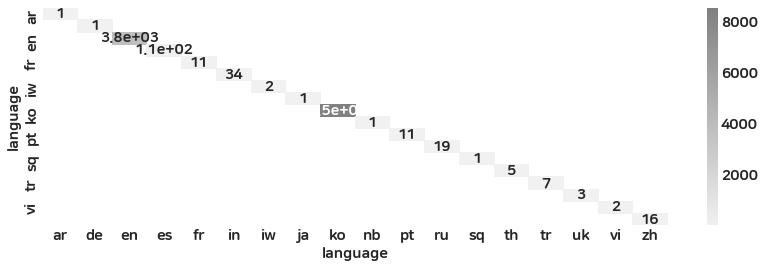

is_out         N       Y
language                
ar           NaN     1.0
de           NaN     1.0
en        2700.0  1143.0
es          78.0    31.0
fr           7.0     4.0
in          25.0     9.0
iw           1.0     1.0
ja           1.0     NaN
ko        4780.0  3729.0
nb           NaN     1.0
pt          10.0     1.0
ru          14.0     5.0
sq           NaN     1.0
th           3.0     2.0
tr           4.0     3.0
uk           2.0     1.0
vi           1.0     1.0
zh          12.0     4.0


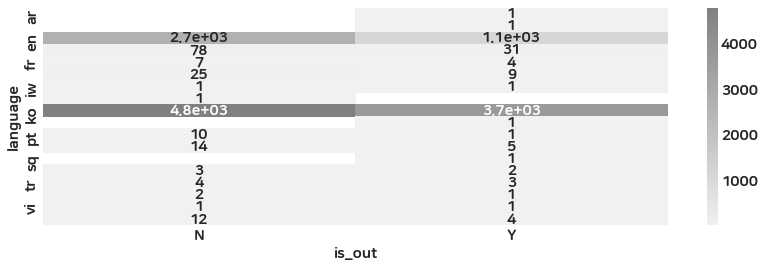

is_deactivated       N       Y
language                      
ar                 1.0     NaN
de                 NaN     1.0
en              1603.0  2240.0
es                41.0    68.0
fr                 3.0     8.0
in                10.0    24.0
iw                 NaN     2.0
ja                 NaN     1.0
ko              4222.0  4287.0
nb                 NaN     1.0
pt                 4.0     7.0
ru                 7.0    12.0
sq                 NaN     1.0
th                 1.0     4.0
tr                 5.0     2.0
uk                 1.0     2.0
vi                 NaN     2.0
zh                 4.0    12.0


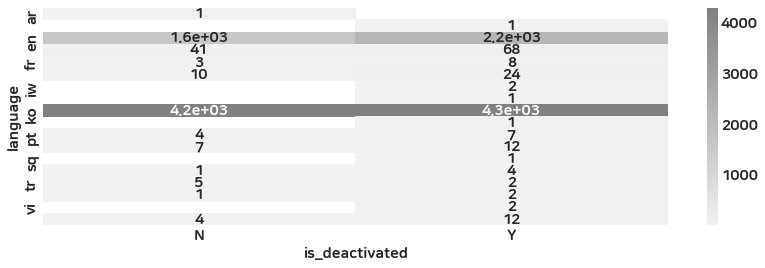

is_blocked    Y
language       
en           48
es            2
in            2
ko          506
ru            1
zh            7


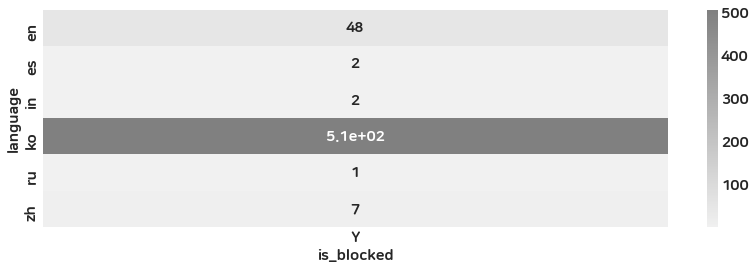

is_confirm      N       Y
language                 
de            NaN     1.0
en           92.0  2977.0
es            3.0    67.0
fr            NaN     9.0
in            3.0    26.0
iw            NaN     1.0
ja            NaN     1.0
ko          376.0  7153.0
nb            NaN     1.0
pt            1.0     8.0
ru            1.0    12.0
th            NaN     3.0
tr            1.0     4.0
uk            NaN     2.0
vi            1.0     1.0
zh            4.0    10.0


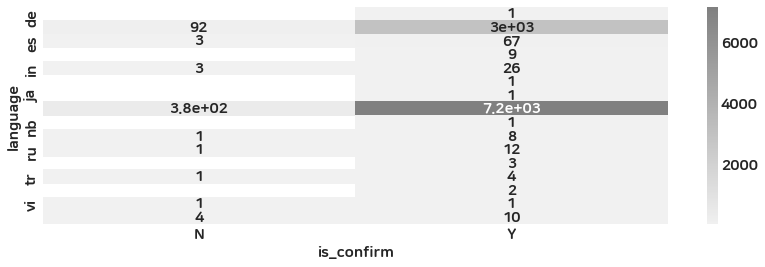

sign_up_completed       N       Y
language                         
ar                    1.0     NaN
de                    NaN     1.0
en                 1089.0  2754.0
es                   45.0    64.0
fr                    2.0     9.0
in                   11.0    23.0
iw                    1.0     1.0
ja                    1.0     NaN
ko                 1438.0  7071.0
nb                    NaN     1.0
pt                    4.0     7.0
ru                    8.0    11.0
sq                    1.0     NaN
th                    3.0     2.0
tr                    3.0     4.0
uk                    2.0     1.0
vi                    1.0     1.0
zh                    6.0    10.0


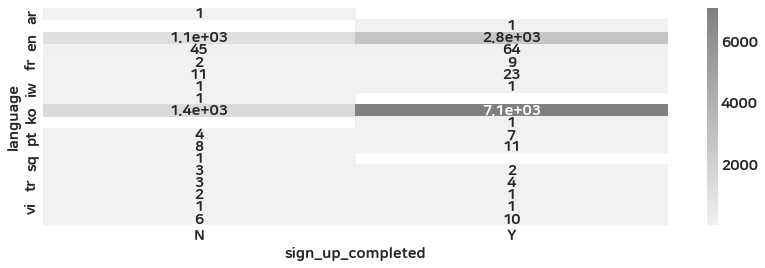

stage     Attraction  Birthday  Body  Drinking  Education  Height  Interest  \
language                                                                      
ar               NaN       NaN   NaN       NaN        NaN     NaN       NaN   
en               2.0       1.0   2.0       3.0        3.0     4.0       2.0   
es               NaN       NaN   6.0       NaN        NaN     NaN       NaN   
fr               NaN       NaN   NaN       NaN        NaN     NaN       NaN   
in               NaN       NaN   NaN       NaN        NaN     NaN       NaN   
iw               NaN       NaN   NaN       NaN        NaN     NaN       NaN   
ja               NaN       NaN   NaN       NaN        NaN     NaN       NaN   
ko               NaN       NaN   3.0       NaN        1.0     9.0       1.0   
pt               NaN       NaN   NaN       NaN        NaN     NaN       NaN   
ru               NaN       NaN   NaN       NaN        NaN     NaN       NaN   
sq               NaN       NaN   NaN       NaN      

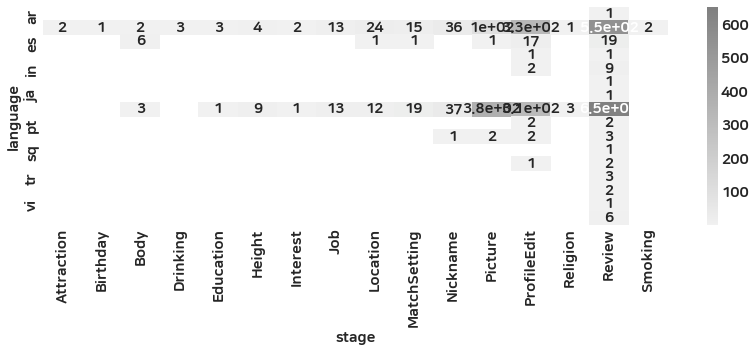

weekdays       0       1      2       3       4       5       6
language                                                       
ar           NaN     NaN    1.0     NaN     NaN     NaN     NaN
de           NaN     NaN    NaN     NaN     1.0     NaN     NaN
en         614.0   533.0  556.0   556.0   487.0   551.0   546.0
es          14.0     9.0    8.0    17.0    16.0    21.0    24.0
fr           3.0     3.0    NaN     2.0     2.0     1.0     NaN
in           5.0     4.0    4.0     3.0     7.0     5.0     6.0
iw           1.0     NaN    NaN     NaN     NaN     1.0     NaN
ja           1.0     NaN    NaN     NaN     NaN     NaN     NaN
ko        1186.0  1038.0  969.0  1028.0  1352.0  1409.0  1527.0
nb           NaN     NaN    NaN     NaN     NaN     NaN     1.0
pt           1.0     2.0    3.0     1.0     2.0     1.0     1.0
ru           2.0     4.0    2.0     3.0     2.0     2.0     4.0
sq           NaN     NaN    NaN     NaN     NaN     NaN     1.0
th           2.0     NaN    NaN     NaN 

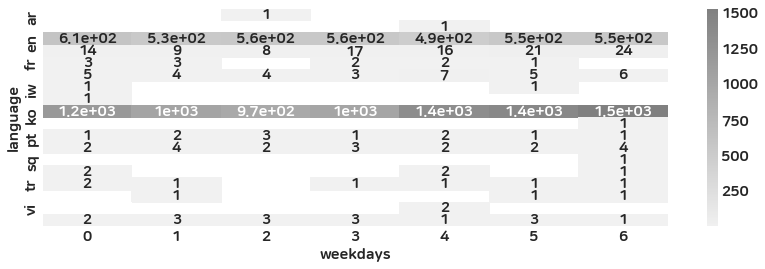

sign_hours     0      1      2      3      4      5      6      7      8   \
language                                                                    
ar            NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
de            NaN    NaN    1.0    NaN    NaN    NaN    NaN    NaN    NaN   
en          225.0  197.0  210.0  213.0  227.0  191.0  176.0  150.0  136.0   
es           12.0    6.0    8.0    8.0    9.0    4.0    8.0    2.0    3.0   
fr            2.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
in            1.0    1.0    NaN    2.0    1.0    1.0    1.0    6.0    2.0   
iw            NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
ja            NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
ko          169.0  217.0  272.0  289.0  297.0  330.0  327.0  367.0  372.0   
nb            NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
pt            NaN    NaN    1.0    NaN    1.0    NaN    NaN    NaN    2.0   

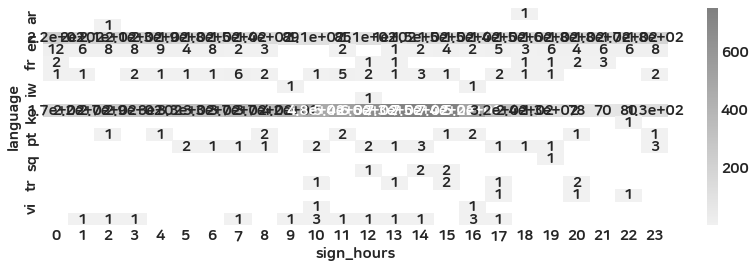

profile_tier  Bronze  Diamond  Gold  Silver
is_out                                     
N                 15     3674  1635     586
Y                  3     2796  1293     273


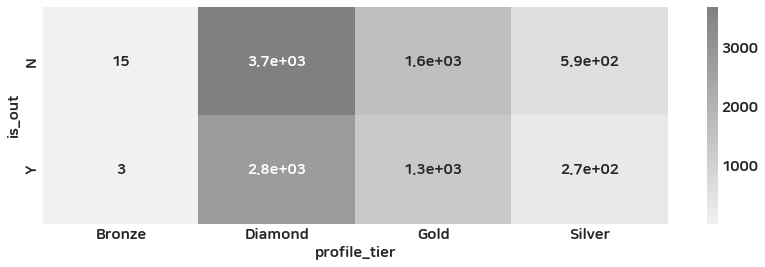

body_type   BF00    BF01    BF02   BF03   BF04    BF05  BM00  BM02  BM04
is_out                                                                  
N          474.0  1155.0  3233.0  729.0  689.0  1216.0   NaN   7.0   1.0
Y          292.0   791.0  2264.0  449.0  320.0   818.0   2.0   1.0   1.0


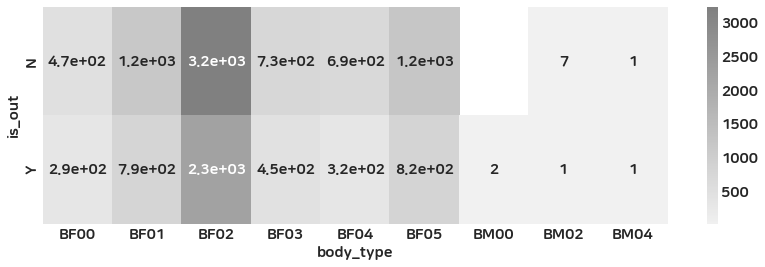

blood_type    A   AB    B    O
is_out                        
N           600  214  437  586
Y           317  122  296  366


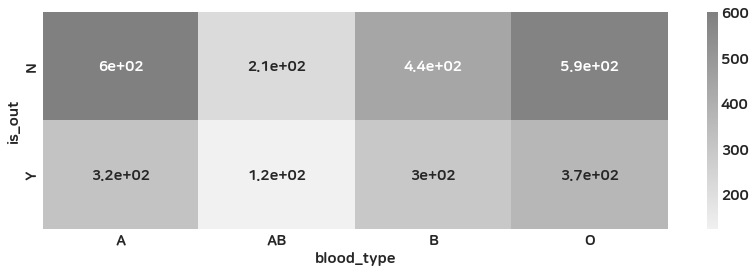

education  UE01  UE02  UE03  UE04  UE05  UE06
is_out                                       
N          1674  1106  3605   303    40   659
Y           884   829  2636   176    20   334


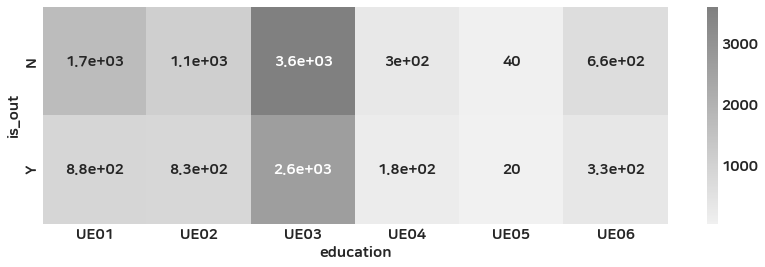

religion    UR00    UR01   UR02   UR03  UR04  UR05  UR06  UR07  UR08  UR09  \
is_out                                                                       
N         4493.0  1700.0  256.0  622.0   4.0  60.0  32.0   4.0   1.0   1.0   
Y         3297.0   895.0  167.0  341.0   NaN  48.0  19.0   4.0   3.0   1.0   

religion  UR10  UR11   UR99  
is_out                       
N          NaN   6.0  294.0  
Y          2.0   1.0  160.0  


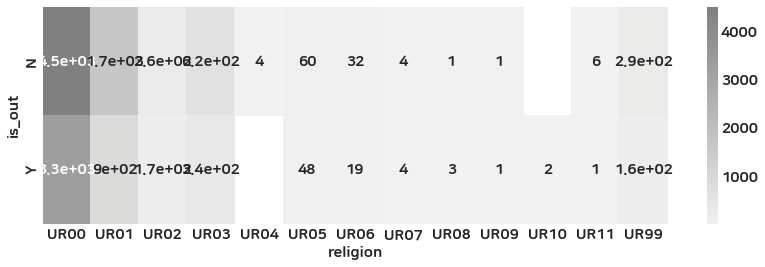

smoking  SM00  SM01  SM02
is_out                   
N         461  1064  5944
Y         234   521  4183


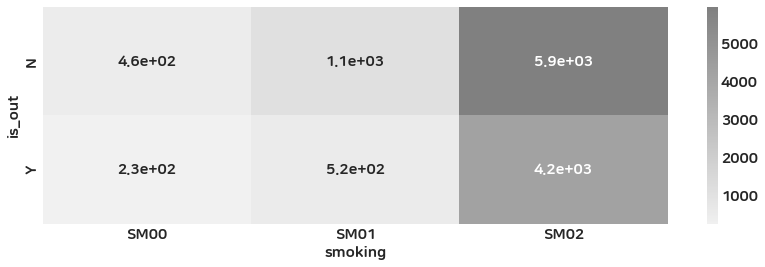

drinking  DR00  DR01  DR02
is_out                    
N          607  5356  1509
Y          361  3685   892


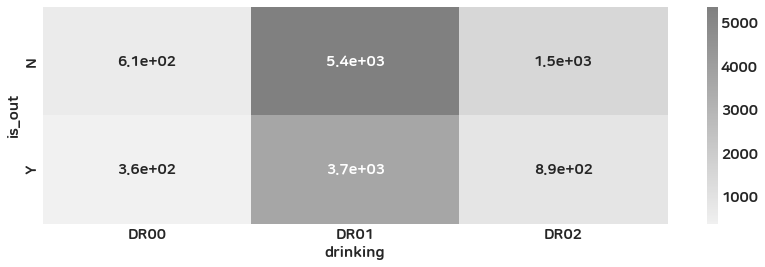

region    AE   AL   AR    AU   AZ   BE   BH   BO   BR   BY  ...   TH   TN  \
is_out                                                      ...             
N       10.0  NaN  6.0  13.0  NaN  1.0  1.0  1.0  7.0  NaN  ...  8.0  2.0   
Y        4.0  1.0  2.0   9.0  1.0  NaN  NaN  1.0  1.0  1.0  ...  4.0  NaN   

region   TR   TT   TW   TZ   UA      US   VN   ZA  
is_out                                             
N       6.0  1.0  1.0  1.0  5.0  2137.0  6.0  6.0  
Y       7.0  NaN  NaN  NaN  1.0   866.0  4.0  5.0  

[2 rows x 67 columns]


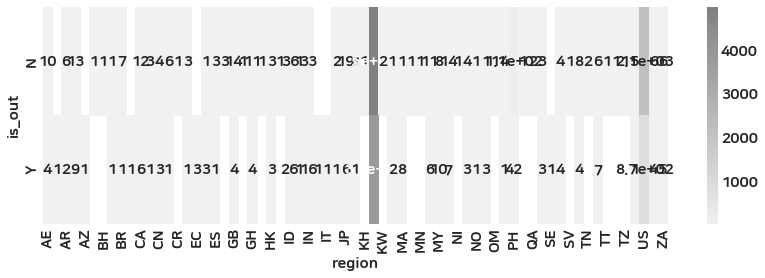

current_region    AE   AL    AR   AT    AU   AZ   BD   BE   BH   BJ  ...   TR  \
is_out                                                               ...        
N               14.0  NaN  12.0  1.0  16.0  1.0  3.0  1.0  1.0  2.0  ...  7.0   
Y                6.0  1.0   5.0  NaN  10.0  1.0  NaN  NaN  NaN  1.0  ...  3.0   

current_region   TT   TW   TZ   UA      US   VE    VN   ZA   ZW  
is_out                                                           
N               1.0  5.0  2.0  5.0  1979.0  1.0  14.0  5.0  NaN  
Y               NaN  2.0  NaN  1.0   834.0  NaN   6.0  4.0  1.0  

[2 rows x 83 columns]


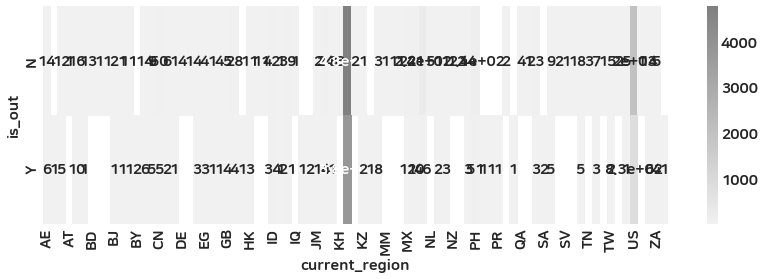

language   ar   de      en    es   fr    in   iw   ja      ko   nb    pt  \
is_out                                                                     
N         NaN  NaN  2700.0  78.0  7.0  25.0  1.0  1.0  4780.0  NaN  10.0   
Y         1.0  1.0  1143.0  31.0  4.0   9.0  1.0  NaN  3729.0  1.0   1.0   

language    ru   sq   th   tr   uk   vi    zh  
is_out                                         
N         14.0  NaN  3.0  4.0  2.0  1.0  12.0  
Y          5.0  1.0  2.0  3.0  1.0  1.0   4.0  


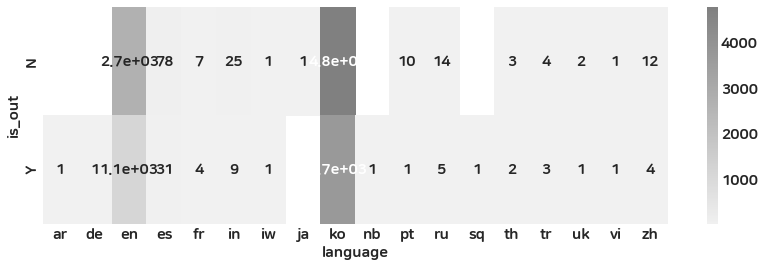

is_out       N       Y
is_out                
N       7638.0     NaN
Y          NaN  4938.0


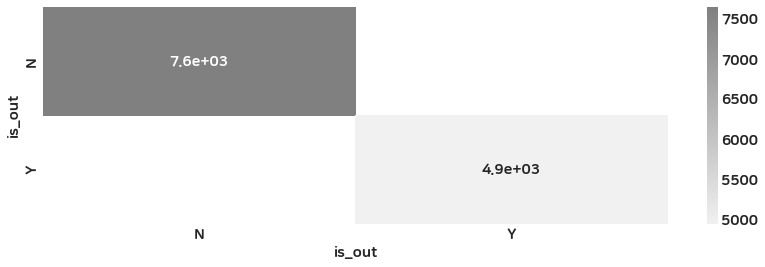

is_deactivated     N     Y
is_out                    
N               4355  3283
Y               1547  3391


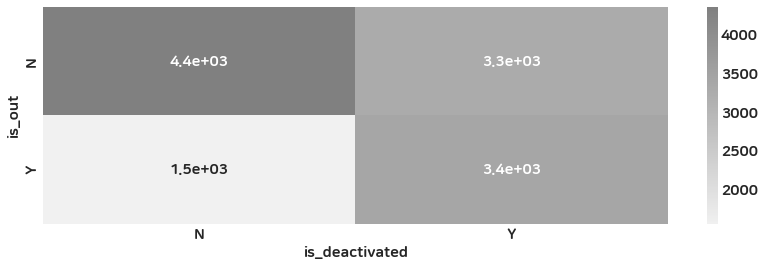

is_blocked    Y
is_out         
N           509
Y            57


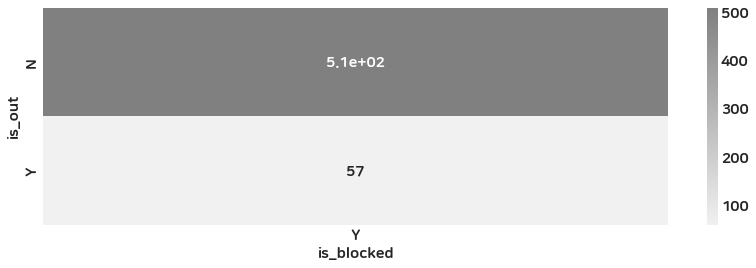

is_confirm    N     Y
is_out               
N           375  5911
Y           107  4365


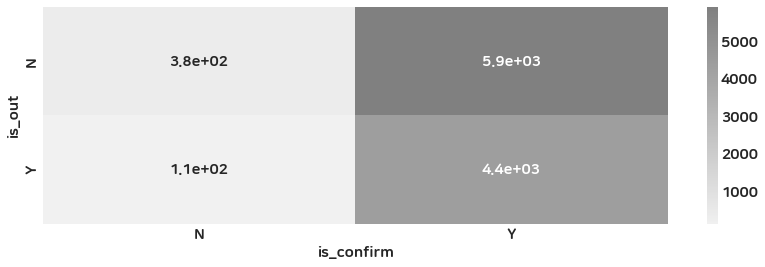

sign_up_completed     N     Y
is_out                       
N                  2043  5595
Y                   573  4365


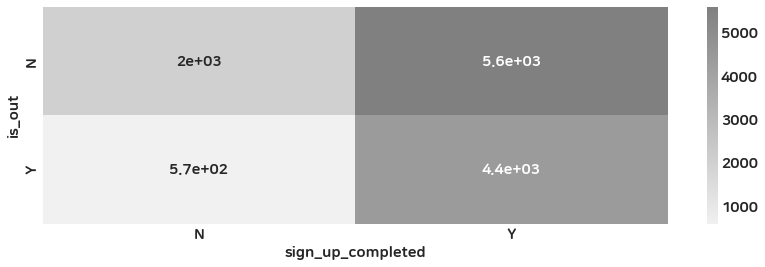

stage   Attraction  Birthday  Body  Drinking  Education  Height  Interest  \
is_out                                                                      
N              2.0       1.0  11.0       3.0        4.0    13.0       3.0   
Y              NaN       NaN   NaN       NaN        NaN     NaN       NaN   

stage    Job  Location  MatchSetting  Nickname  Picture  ProfileEdit  \
is_out                                                                 
N       26.0      37.0          34.0      74.0    477.0        664.0   
Y        NaN       NaN           1.0       NaN      2.0          3.0   

stage   Religion  Review  Smoking  
is_out                             
N            4.0   688.0      2.0  
Y            NaN   567.0      NaN  


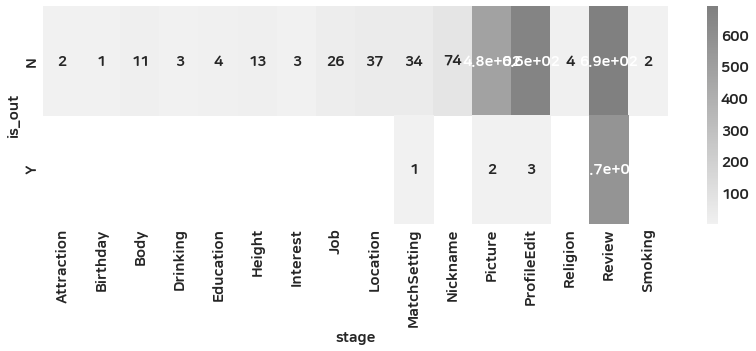

weekdays     0     1    2    3     4     5     6
is_out                                          
N         1140  1029  993  988  1109  1162  1217
Y          693   569  553  626   766   834   897


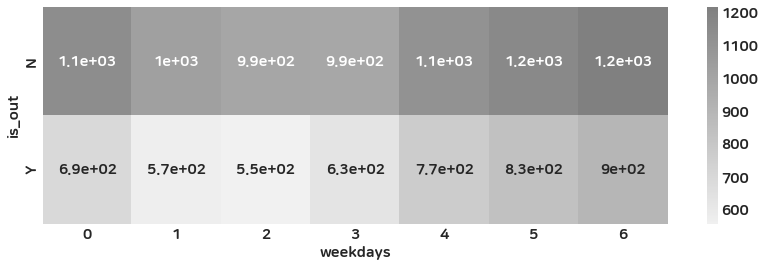

sign_hours   0    1    2    3    4    5    6    7    8    9   ...   14   15  \
is_out                                                        ...             
N           278  286  330  330  330  309  309  328  356  330  ...  488  500   
Y           131  136  163  183  205  219  204  199  160  181  ...  423  391   

sign_hours   16   17   18   19   20   21   22   23  
is_out                                              
N           390  271  221  197  177  165  176  240  
Y           293  203  175  108   95   93   82   86  

[2 rows x 24 columns]


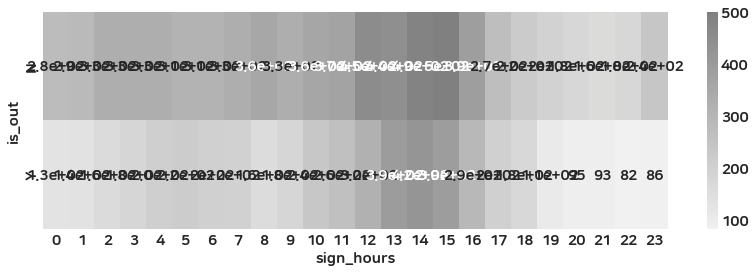

profile_tier    Bronze  Diamond  Gold  Silver
is_deactivated                               
N                   11     3476  1448     380
Y                    7     2994  1480     479


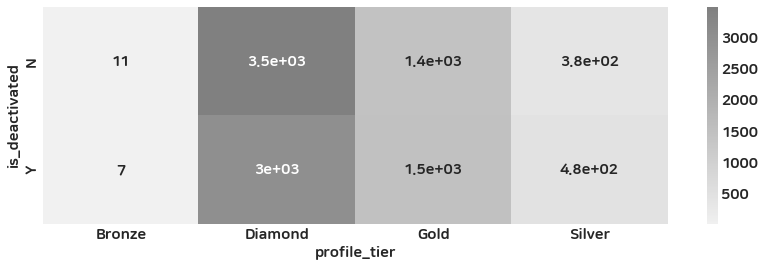

body_type        BF00    BF01    BF02   BF03   BF04    BF05  BM00  BM02  BM04
is_deactivated                                                               
N               282.0   883.0  2661.0  564.0  439.0  1030.0   1.0   3.0   NaN
Y               484.0  1063.0  2836.0  614.0  570.0  1004.0   1.0   5.0   2.0


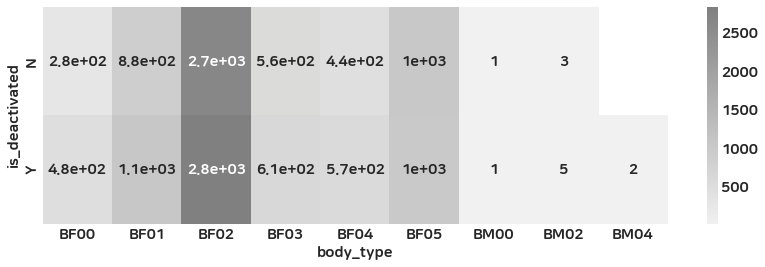

blood_type        A   AB    B    O
is_deactivated                    
N               534  184  439  550
Y               383  152  294  402


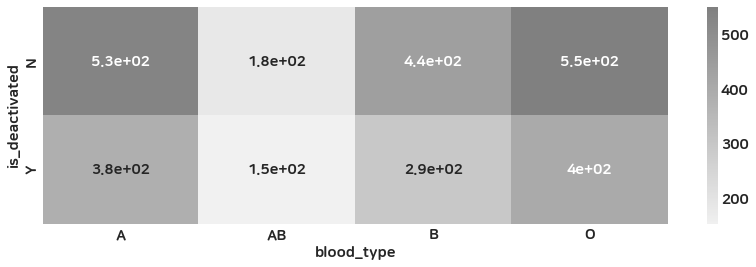

education       UE01  UE02  UE03  UE04  UE05  UE06
is_deactivated                                    
N               1119   990  2974   233    22   444
Y               1439   945  3267   246    38   549


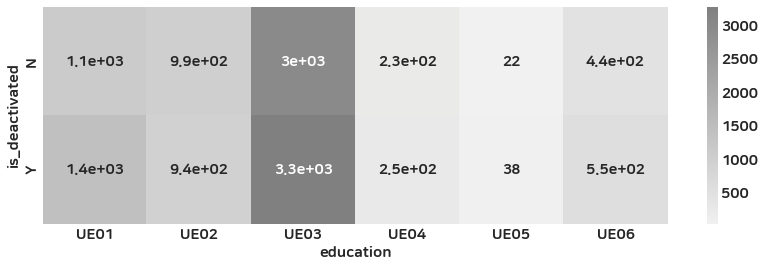

religion          UR00    UR01   UR02   UR03  UR04  UR05  UR06  UR07  UR08  \
is_deactivated                                                               
N               3737.0  1247.0  209.0  424.0   1.0  36.0  16.0   2.0   1.0   
Y               4053.0  1348.0  214.0  539.0   3.0  72.0  35.0   6.0   3.0   

religion        UR09  UR10  UR11   UR99  
is_deactivated                           
N                1.0   NaN   3.0  178.0  
Y                1.0   2.0   4.0  276.0  


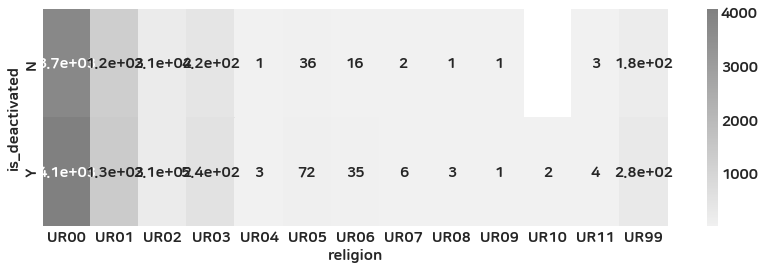

smoking         SM00  SM01  SM02
is_deactivated                  
N                296   771  4786
Y                399   814  5341


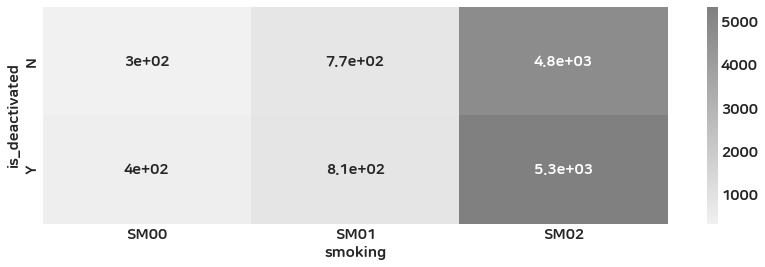

drinking        DR00  DR01  DR02
is_deactivated                  
N                404  4447  1003
Y                564  4594  1398


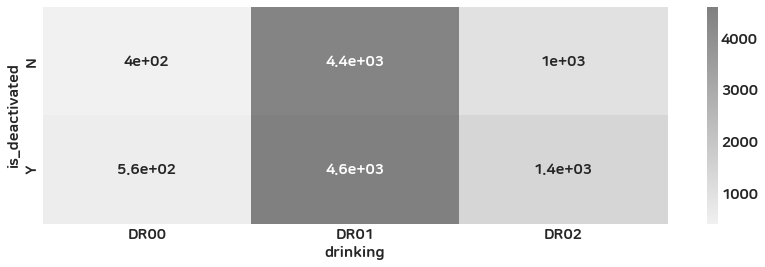

region            AE   AL   AR    AU   AZ   BE   BH   BO   BR   BY  ...    TH  \
is_deactivated                                                      ...         
N                3.0  NaN  NaN   9.0  1.0  1.0  1.0  NaN  3.0  1.0  ...   2.0   
Y               11.0  1.0  8.0  13.0  NaN  NaN  NaN  2.0  5.0  NaN  ...  10.0   

region           TN    TR   TT   TW   TZ   UA      US   VN   ZA  
is_deactivated                                                   
N               NaN   3.0  1.0  1.0  NaN  1.0  1272.0  2.0  3.0  
Y               2.0  10.0  NaN  NaN  1.0  5.0  1731.0  8.0  8.0  

[2 rows x 67 columns]


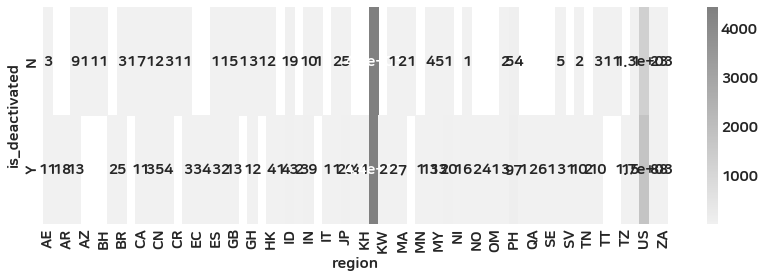

current_region    AE   AL    AR   AT    AU   AZ   BD   BE   BH   BJ  ...   TR  \
is_deactivated                                                       ...        
N                7.0  NaN   4.0  1.0  10.0  2.0  2.0  1.0  1.0  1.0  ...  7.0   
Y               13.0  1.0  13.0  NaN  16.0  NaN  1.0  NaN  NaN  2.0  ...  3.0   

current_region   TT   TW   TZ   UA      US   VE    VN   ZA   ZW  
is_deactivated                                                   
N               1.0  4.0  NaN  2.0  1202.0  NaN   7.0  3.0  NaN  
Y               NaN  3.0  2.0  4.0  1611.0  1.0  13.0  6.0  1.0  

[2 rows x 83 columns]


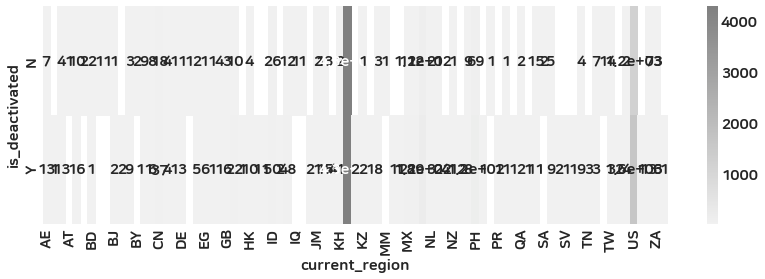

language         ar   de      en    es   fr    in   iw   ja      ko   nb   pt  \
is_deactivated                                                                  
N               1.0  NaN  1603.0  41.0  3.0  10.0  NaN  NaN  4222.0  NaN  4.0   
Y               NaN  1.0  2240.0  68.0  8.0  24.0  2.0  1.0  4287.0  1.0  7.0   

language          ru   sq   th   tr   uk   vi    zh  
is_deactivated                                       
N                7.0  NaN  1.0  5.0  1.0  NaN   4.0  
Y               12.0  1.0  4.0  2.0  2.0  2.0  12.0  


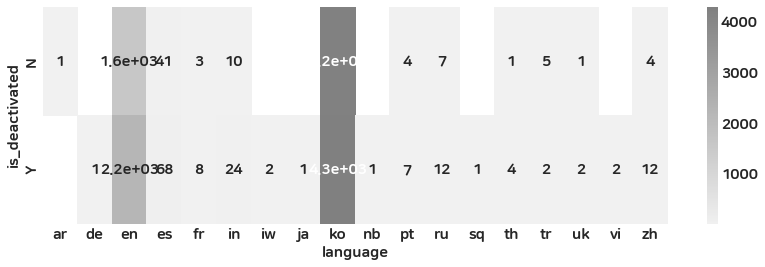

is_out             N     Y
is_deactivated            
N               4355  1547
Y               3283  3391


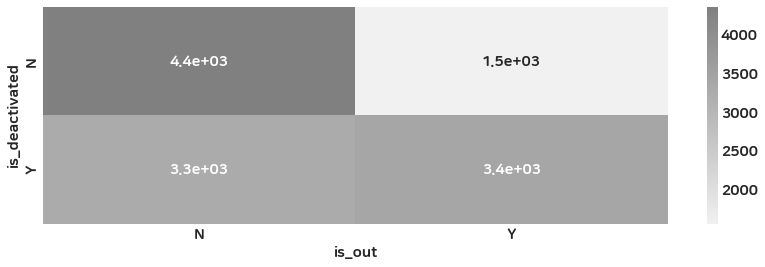

is_deactivated       N       Y
is_deactivated                
N               5902.0     NaN
Y                  NaN  6674.0


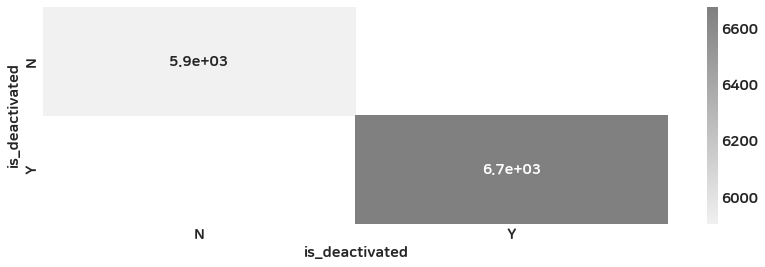

is_blocked        Y
is_deactivated     
N               121
Y               445


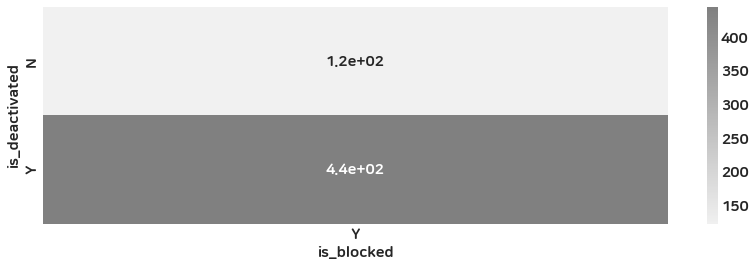

is_confirm        N     Y
is_deactivated           
N               115  5315
Y               367  4961


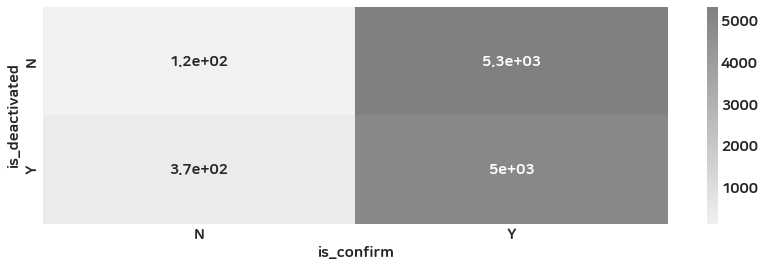

sign_up_completed     N     Y
is_deactivated               
N                   670  5232
Y                  1946  4728


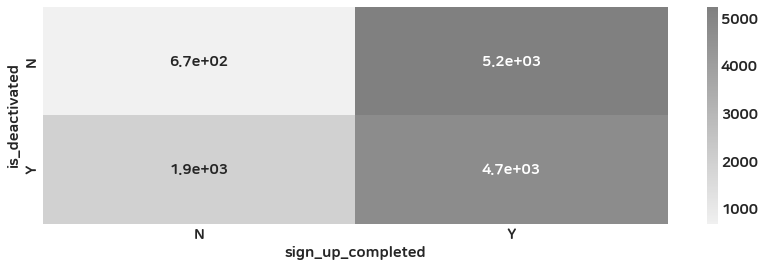

stage           Attraction  Birthday  Body  Drinking  Education  Height  \
is_deactivated                                                            
N                      NaN       NaN   6.0       2.0        2.0     1.0   
Y                      2.0       1.0   5.0       1.0        2.0    12.0   

stage           Interest   Job  Location  MatchSetting  Nickname  Picture  \
is_deactivated                                                              
N                    1.0   8.0       9.0          10.0      23.0    125.0   
Y                    2.0  18.0      28.0          25.0      51.0    354.0   

stage           ProfileEdit  Religion  Review  Smoking  
is_deactivated                                          
N                     182.0       NaN   301.0      NaN  
Y                     485.0       4.0   954.0      2.0  


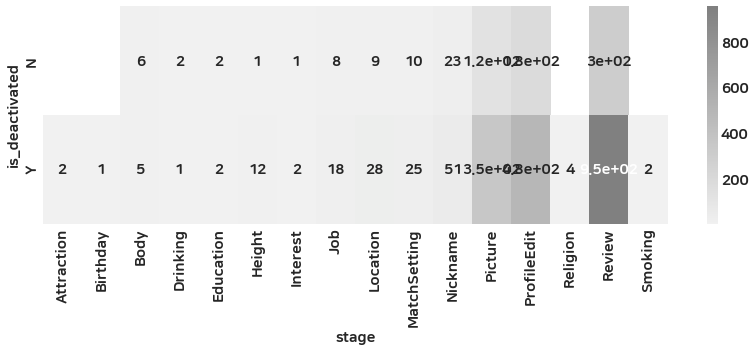

weekdays          0    1    2    3     4     5     6
is_deactivated                                      
N               986  856  775  698   561   858  1168
Y               847  742  771  916  1314  1138   946


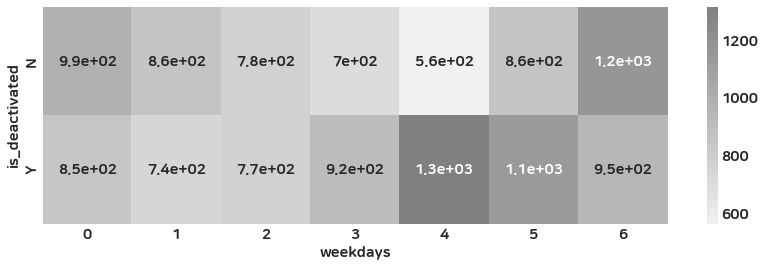

sign_hours       0    1    2    3    4    5    6    7    8    9   ...   14  \
is_deactivated                                                    ...        
N               179  216  229  244  242  251  248  264  250  221  ...  454   
Y               230  206  264  269  293  277  265  263  266  290  ...  457   

sign_hours       15   16   17   18   19   20   21   22   23  
is_deactivated                                               
N               429  306  216  153  129  124  114  103  153  
Y               462  377  258  243  176  148  144  155  173  

[2 rows x 24 columns]


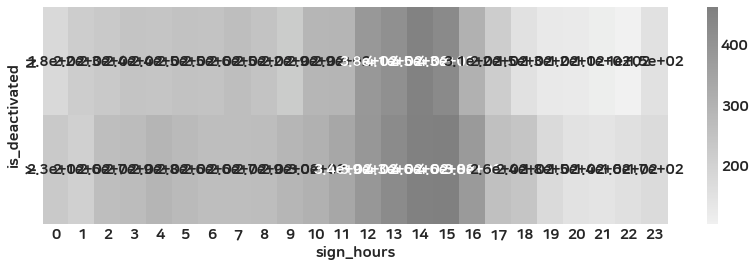

profile_tier  Diamond  Gold
is_blocked                 
Y                 272     6


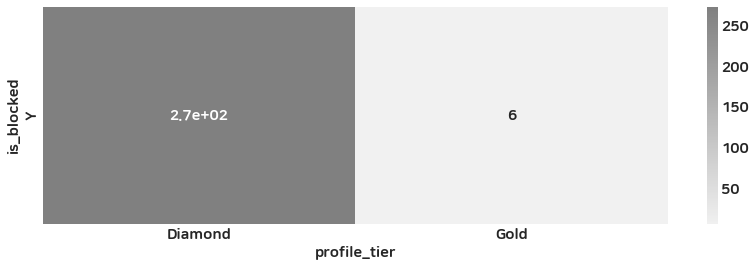

body_type   BF00  BF01  BF02  BF03  BF04  BF05
is_blocked                                    
Y             75   124   193    91    80     3


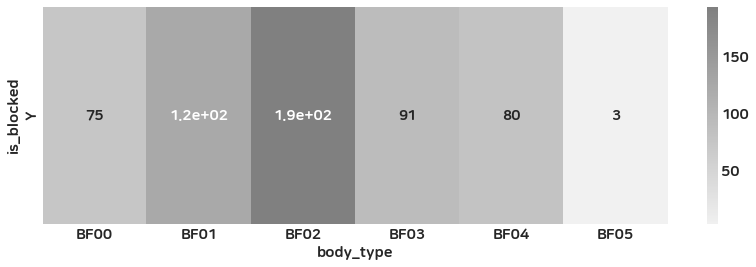

blood_type  A  AB  B  O
is_blocked             
Y           3   6  5  8


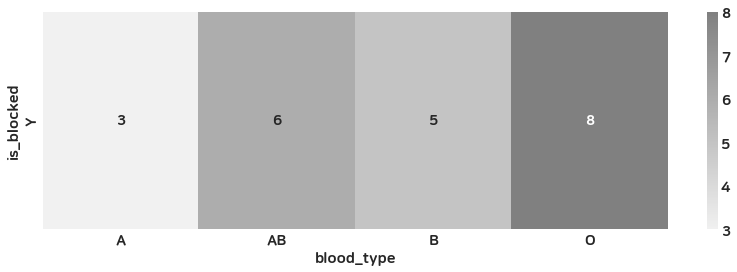

education   UE01  UE02  UE03  UE04  UE05  UE06
is_blocked                                    
Y             47   115   305     7     2    90


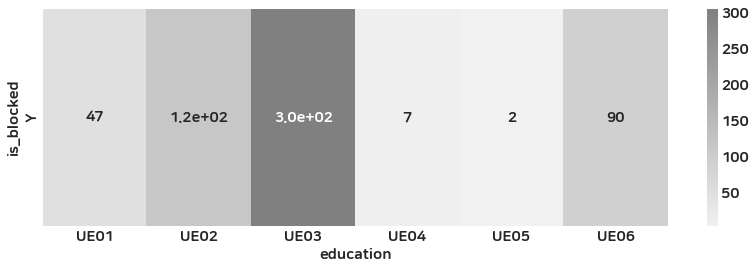

religion    UR00  UR01  UR02  UR03  UR06  UR99
is_blocked                                    
Y            480    47     3    23     1    12


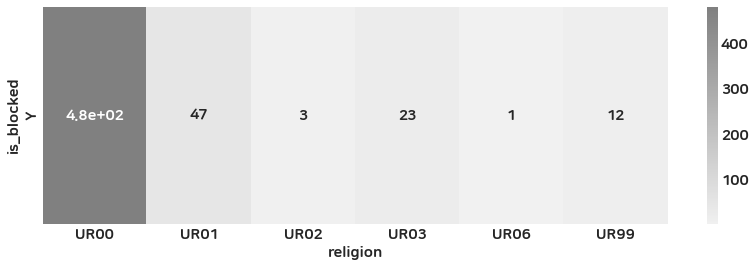

smoking     SM00  SM01  SM02
is_blocked                  
Y              3    39   524


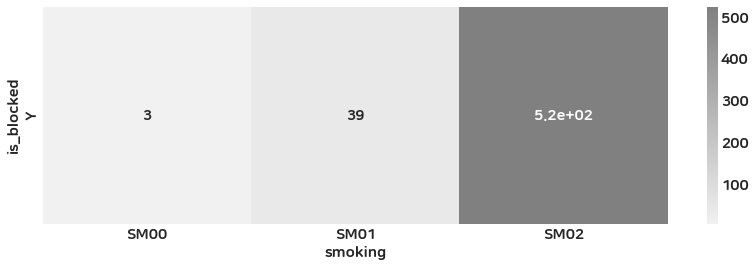

drinking    DR00  DR01  DR02
is_blocked                  
Y             43   466    57


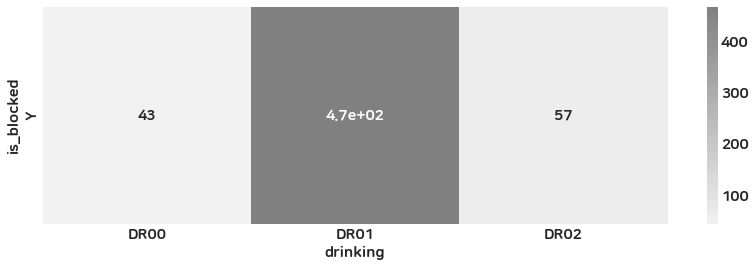

region      ID  JP   KR  MY  US
is_blocked                     
Y            1   3  527   1  34


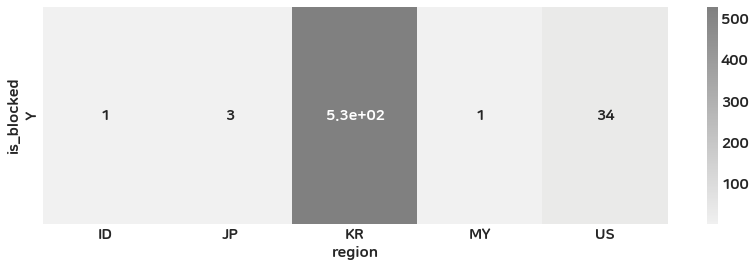

current_region  AR  CA  CN  HK  ID  IN  JP   KR  MY  NG  PH  RU  SG  US  VN
is_blocked                                                                 
Y                1   1  38   3   2   1   4  455   2   6   4  11   1  35   1


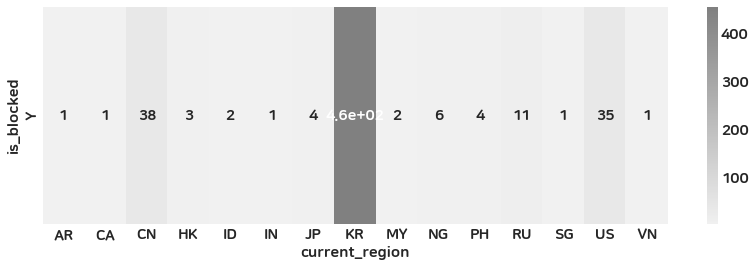

language    en  es  in   ko  ru  zh
is_blocked                         
Y           48   2   2  506   1   7


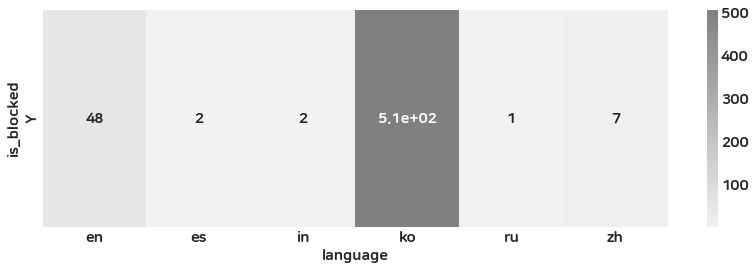

is_out        N   Y
is_blocked         
Y           509  57


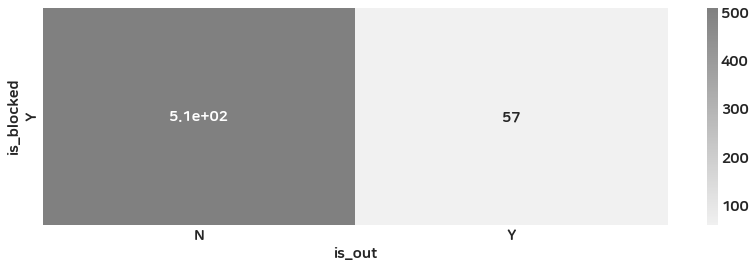

is_deactivated    N    Y
is_blocked              
Y               121  445


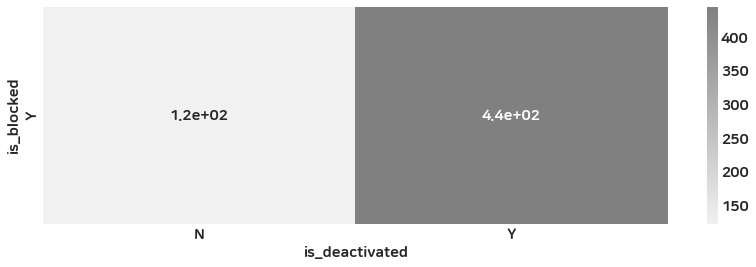

is_blocked    Y
is_blocked     
Y           566


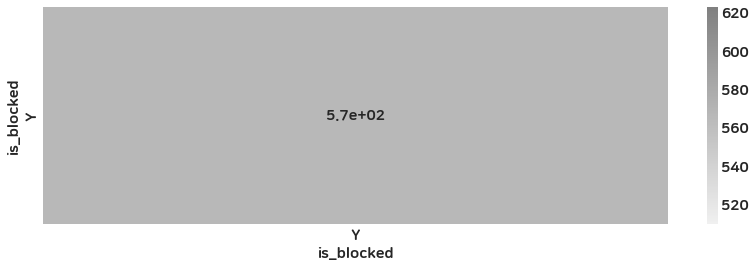

is_confirm    N    Y
is_blocked          
Y           288  278


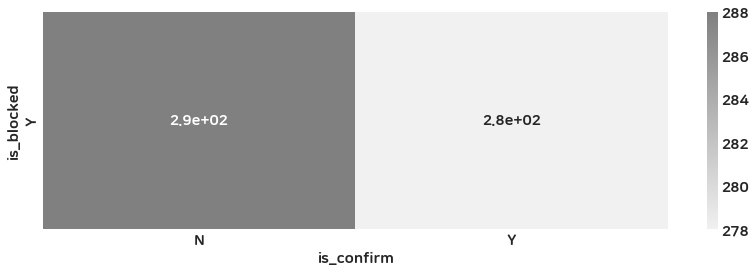

sign_up_completed    N    Y
is_blocked                 
Y                  289  277


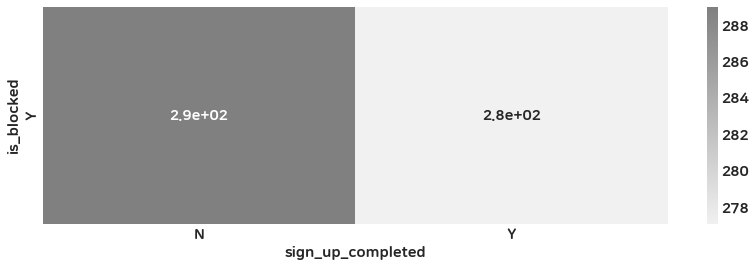

stage       Review
is_blocked        
Y              289


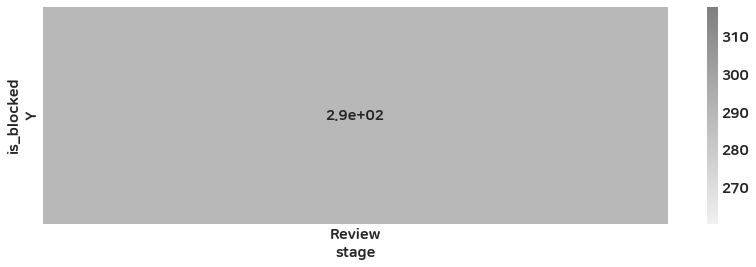

weekdays     0   1   2   3    4   5   6
is_blocked                             
Y           81  66  55  91  115  96  62


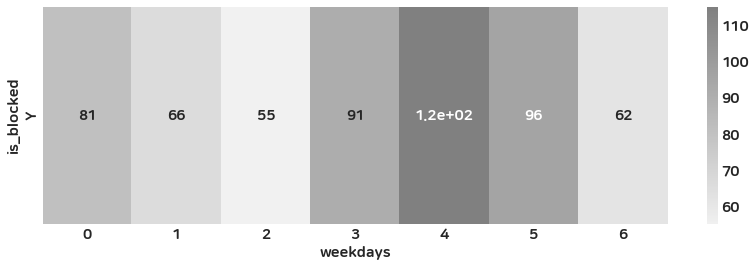

sign_hours  0   1   2   3   4   5   6   7   8   9   ...  14  15  16  17  18  \
is_blocked                                          ...                       
Y            9   9  18  24  16  14  21  59  73  92  ...  16  13   8   3   6   

sign_hours  19  20  21  22  23  
is_blocked                      
Y            4   3   3   8   4  

[1 rows x 24 columns]


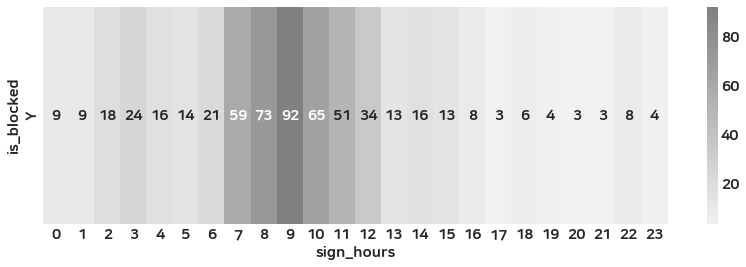

profile_tier  Bronze  Diamond  Gold  Silver
is_confirm                                 
Y                 18     6470  2928     859


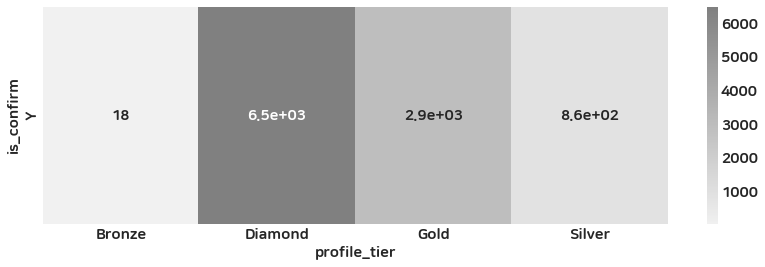

body_type    BF00    BF01    BF02   BF03   BF04    BF05  BM00  BM02
is_confirm                                                         
N            67.0    97.0   187.0   61.0   51.0    19.0   NaN   NaN
Y           557.0  1573.0  4597.0  954.0  825.0  1762.0   1.0   7.0


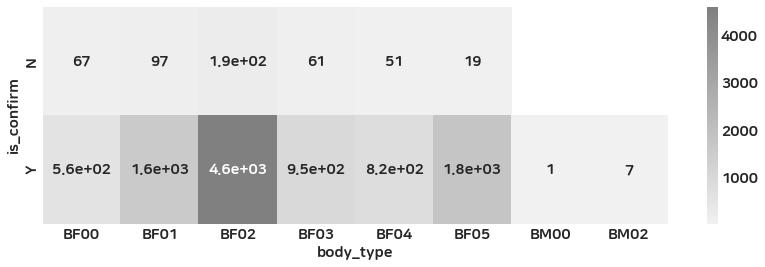

blood_type    A   AB    B    O
is_confirm                    
N            14    5   13    9
Y           876  322  701  923


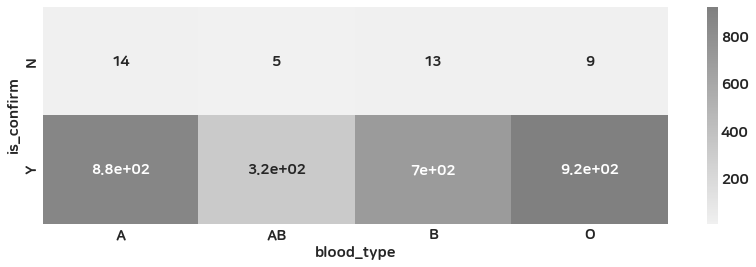

education   UE01  UE02  UE03  UE04  UE05  UE06
is_confirm                                    
N             70    72   244    13     2    79
Y           2005  1682  5285   394    48   735


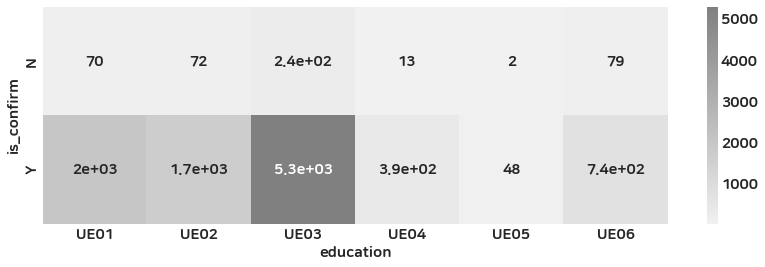

religion      UR00    UR01   UR02   UR03  UR04  UR05  UR06  UR07  UR08  UR09  \
is_confirm                                                                     
N            351.0    65.0    6.0   37.0   NaN   2.0   3.0   NaN   NaN   NaN   
Y           6543.0  2146.0  353.0  780.0   1.0  83.0  33.0   4.0   2.0   1.0   

religion    UR10  UR11   UR99  
is_confirm                     
N            NaN   NaN   18.0  
Y            2.0   3.0  325.0  


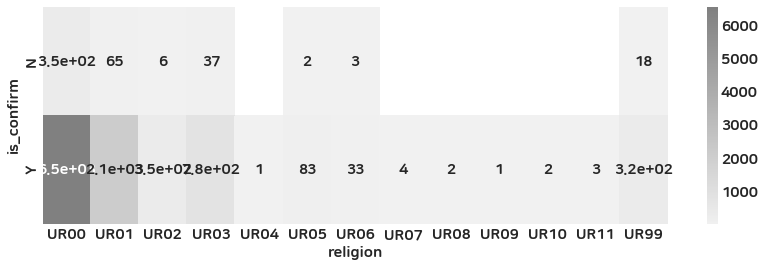

smoking     SM00  SM01  SM02
is_confirm                  
N             10    47   425
Y            524  1246  8506


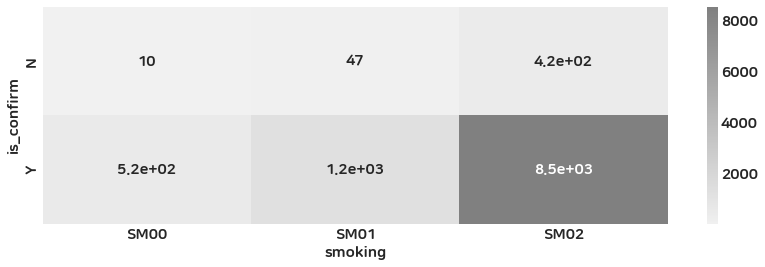

drinking    DR00  DR01  DR02
is_confirm                  
N             42   363    77
Y            732  7696  1848


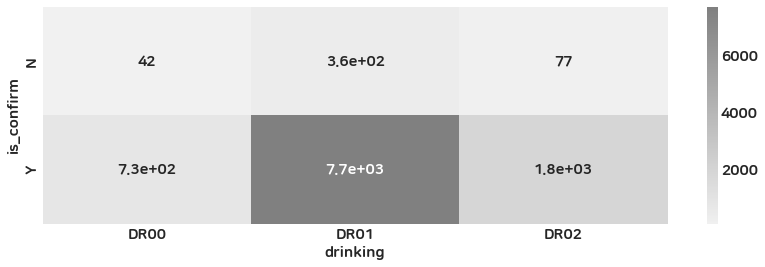

region       AE   AR    AU   AZ   BE   BH   BR   BY    CA   CL  ...   SG   TH  \
is_confirm                                                      ...             
N           1.0  NaN   NaN  NaN  NaN  NaN  NaN  NaN   NaN  NaN  ...  NaN  NaN   
Y           7.0  3.0  16.0  1.0  1.0  1.0  6.0  1.0  13.0  3.0  ...  7.0  8.0   

region       TN   TR   TW   TZ   UA      US   VN   ZA  
is_confirm                                             
N           NaN  NaN  NaN  NaN  NaN    69.0  NaN  1.0  
Y           2.0  9.0  1.0  1.0  4.0  2382.0  5.0  8.0  

[2 rows x 57 columns]


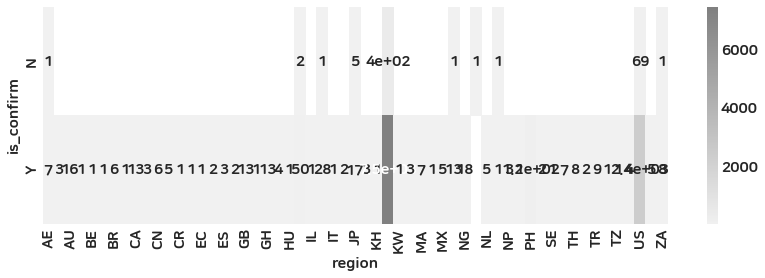

current_region    AE    AR   AT    AU   AZ   BD   BE   BH   BJ   BR  ...   TH  \
is_confirm                                                           ...        
N                2.0   1.0  NaN   1.0  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
Y               11.0  10.0  1.0  17.0  1.0  3.0  1.0  1.0  2.0  9.0  ...  9.0   

current_region   TN   TR   TW   TZ   UA      US   VE    VN   ZA  
is_confirm                                                       
N               NaN  1.0  NaN  NaN  NaN    56.0  NaN   NaN  NaN  
Y               3.0  6.0  5.0  1.0  4.0  2213.0  1.0  14.0  8.0  

[2 rows x 72 columns]


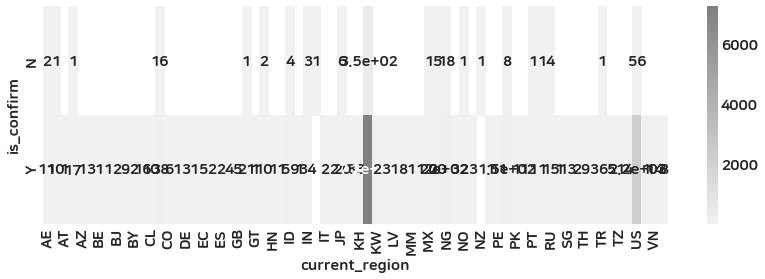

language     de      en    es   fr    in   iw   ja      ko   nb   pt    ru  \
is_confirm                                                                   
N           NaN    92.0   3.0  NaN   3.0  NaN  NaN   376.0  NaN  1.0   1.0   
Y           1.0  2977.0  67.0  9.0  26.0  1.0  1.0  7153.0  1.0  8.0  12.0   

language     th   tr   uk   vi    zh  
is_confirm                            
N           NaN  1.0  NaN  1.0   4.0  
Y           3.0  4.0  2.0  1.0  10.0  


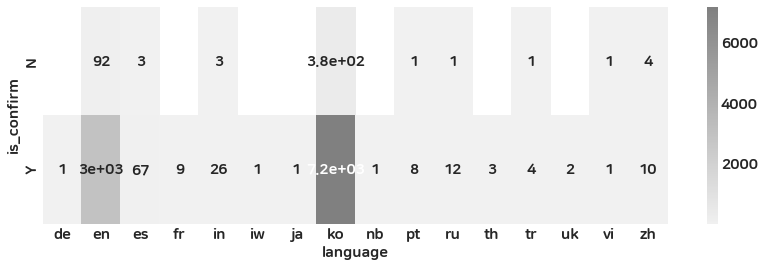

is_out         N     Y
is_confirm            
N            375   107
Y           5911  4365


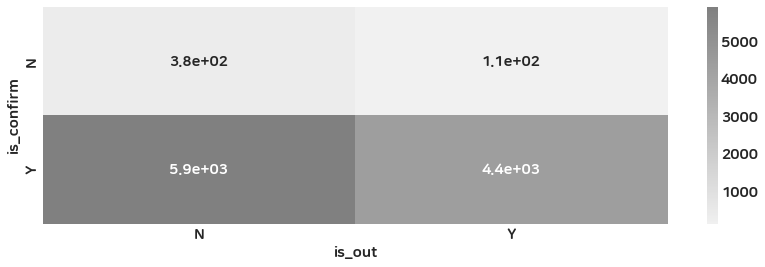

is_deactivated     N     Y
is_confirm                
N                115   367
Y               5315  4961


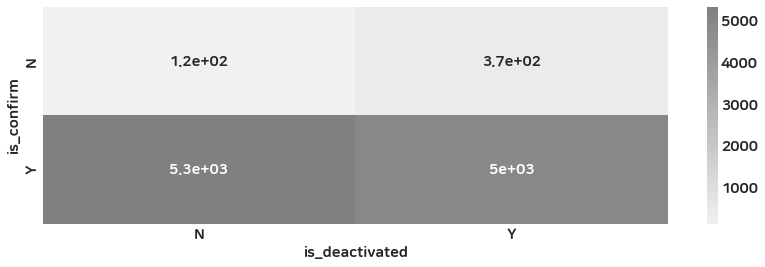

is_blocked    Y
is_confirm     
N           288
Y           278


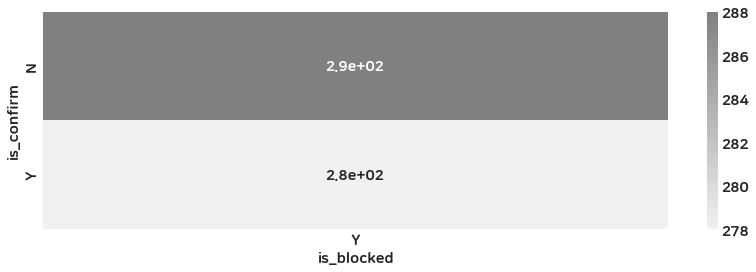

is_confirm      N        Y
is_confirm                
N           482.0      NaN
Y             NaN  10276.0


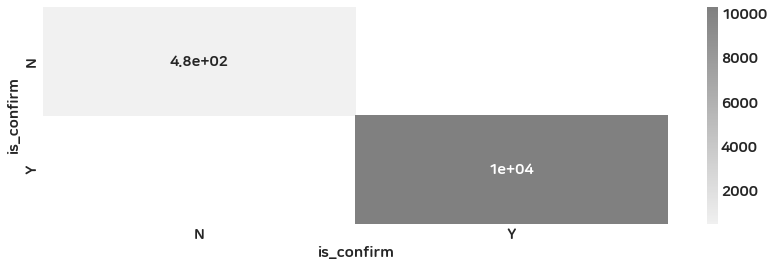

sign_up_completed      N       Y
is_confirm                      
N                  482.0     NaN
Y                  316.0  9960.0


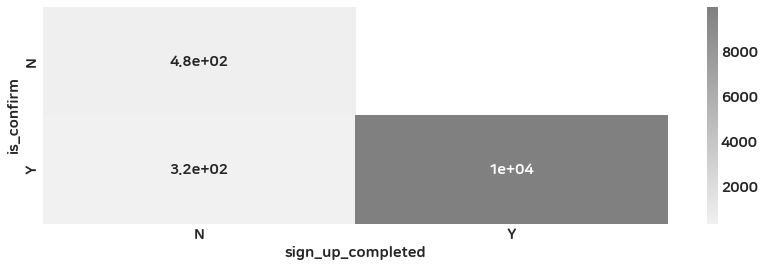

stage       Attraction  Interest  Review
is_confirm                              
N                  NaN       NaN   482.0
Y                  2.0       3.0   311.0


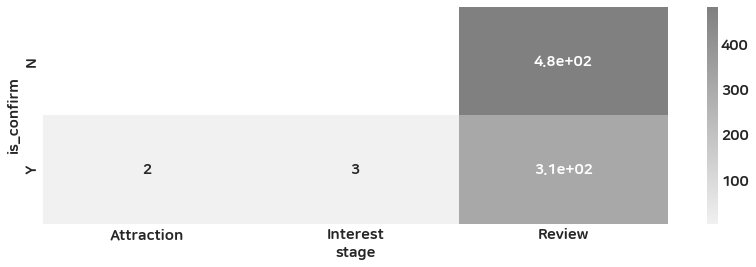

weekdays       0     1     2     3     4     5     6
is_confirm                                          
N             63    49    48    74    86    96    66
Y           1493  1315  1270  1313  1514  1574  1797


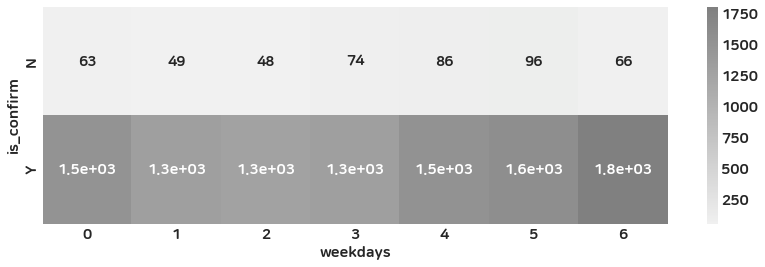

sign_hours     0      1      2      3      4      5      6      7      8   \
is_confirm                                                                  
N            13.0    9.0   13.0   20.0   12.0    7.0    6.0   34.0   47.0   
Y           334.0  356.0  404.0  417.0  464.0  471.0  437.0  444.0  403.0   

sign_hours     9   ...     14     15     16     17     18     19     20  \
is_confirm         ...                                                    
N            56.0  ...   20.0   22.0   21.0    1.0    5.0    NaN    4.0   
Y           406.0  ...  780.0  738.0  560.0  399.0  301.0  227.0  205.0   

sign_hours     21     22     23  
is_confirm                       
N             5.0    6.0    5.0  
Y           197.0  208.0  254.0  

[2 rows x 24 columns]


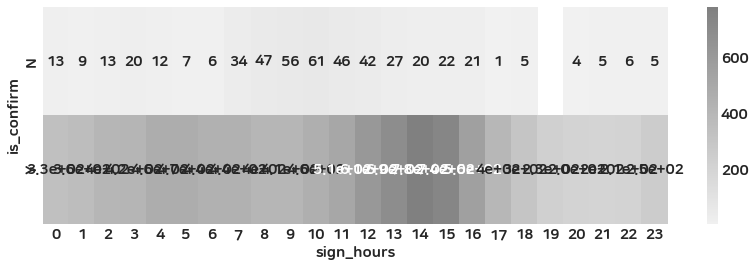

profile_tier       Bronze  Diamond  Gold  Silver
sign_up_completed                               
N                       4      128    99      84
Y                      14     6342  2829     775


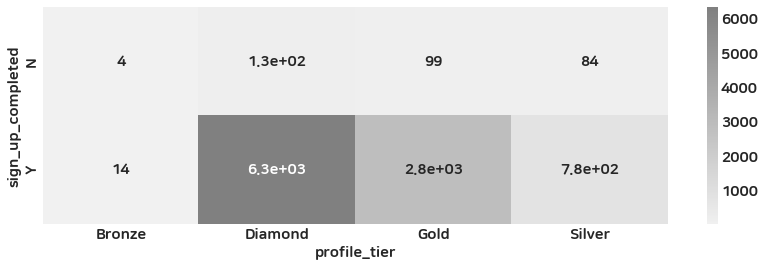

body_type           BF00    BF01    BF02   BF03   BF04    BF05  BM00  BM02  \
sign_up_completed                                                            
N                  233.0   419.0  1020.0  260.0  227.0   319.0   1.0   1.0   
Y                  533.0  1527.0  4477.0  918.0  782.0  1715.0   1.0   7.0   

body_type          BM04  
sign_up_completed        
N                   2.0  
Y                   NaN  


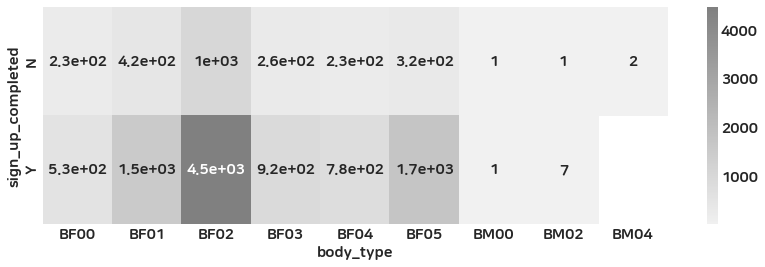

blood_type           A   AB    B    O
sign_up_completed                    
N                   62   19   39   47
Y                  855  317  694  905


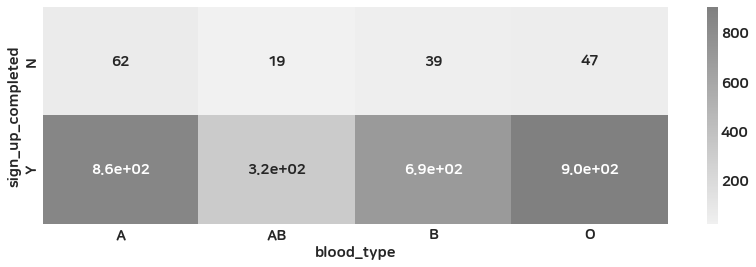

education          UE01  UE02  UE03  UE04  UE05  UE06
sign_up_completed                                    
N                   658   279  1087    94    14   296
Y                  1900  1656  5154   385    46   697


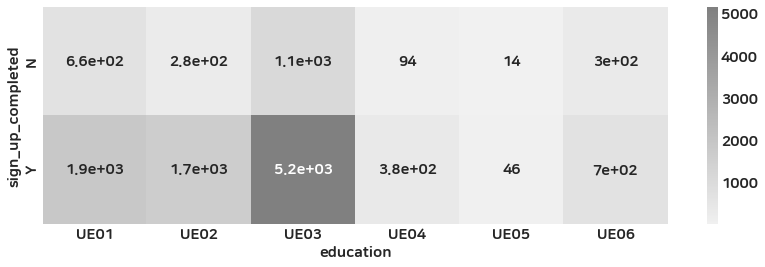

religion             UR00    UR01   UR02   UR03  UR04  UR05  UR06  UR07  UR08  \
sign_up_completed                                                               
N                  1371.0   556.0   84.0  221.0   3.0  31.0  18.0   5.0   2.0   
Y                  6419.0  2039.0  339.0  742.0   1.0  77.0  33.0   3.0   2.0   

religion           UR09  UR10  UR11   UR99  
sign_up_completed                           
N                   1.0   NaN   4.0  155.0  
Y                   1.0   2.0   3.0  299.0  


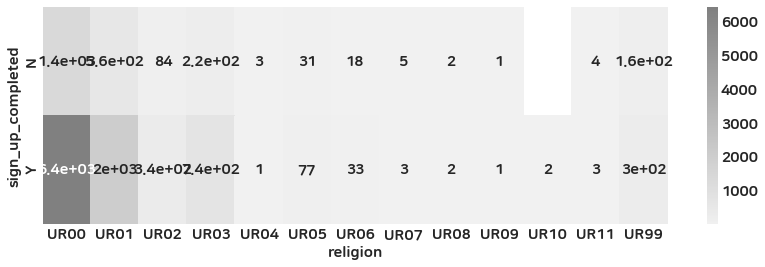

smoking            SM00  SM01  SM02
sign_up_completed                  
N                   194   392  1861
Y                   501  1193  8266


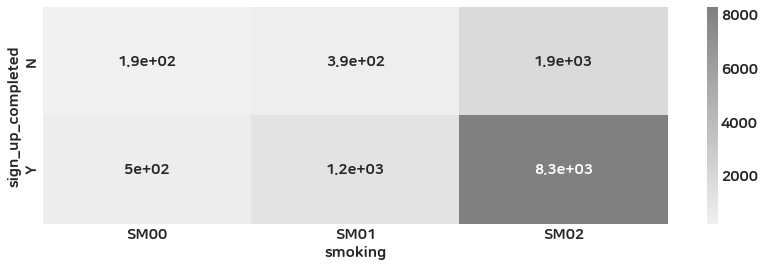

drinking           DR00  DR01  DR02
sign_up_completed                  
N                   261  1518   671
Y                   707  7523  1730


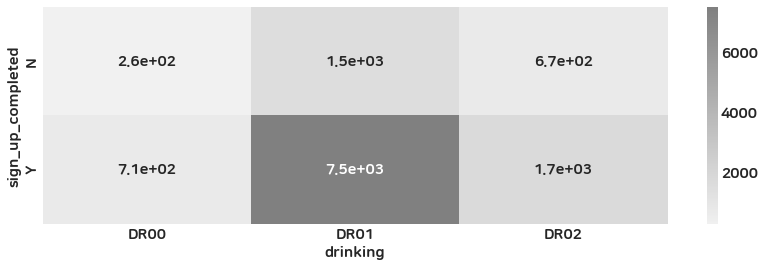

region              AE   AL   AR    AU   AZ   BE   BH   BO   BR   BY  ...  \
sign_up_completed                                                     ...   
N                  8.0  1.0  5.0   6.0  NaN  NaN  NaN  2.0  2.0  NaN  ...   
Y                  6.0  NaN  3.0  16.0  1.0  1.0  1.0  NaN  6.0  1.0  ...   

region              TH   TN   TR   TT   TW   TZ   UA      US   VN   ZA  
sign_up_completed                                                       
N                  5.0  NaN  4.0  1.0  NaN  NaN  3.0   813.0  6.0  3.0  
Y                  7.0  2.0  9.0  NaN  1.0  1.0  3.0  2190.0  4.0  8.0  

[2 rows x 67 columns]


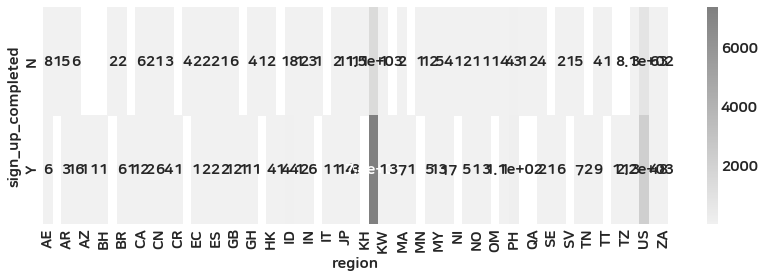

current_region       AE   AL    AR   AT    AU   AZ   BD   BE   BH   BJ  ...  \
sign_up_completed                                                       ...   
N                  10.0  1.0   7.0  NaN   9.0  1.0  1.0  NaN  NaN  1.0  ...   
Y                  10.0  NaN  10.0  1.0  17.0  1.0  2.0  1.0  1.0  2.0  ...   

current_region      TR   TT   TW   TZ   UA      US   VE    VN   ZA   ZW  
sign_up_completed                                                        
N                  4.0  1.0  2.0  1.0  3.0   776.0  NaN   7.0  1.0  1.0  
Y                  6.0  NaN  5.0  1.0  3.0  2037.0  1.0  13.0  8.0  NaN  

[2 rows x 83 columns]


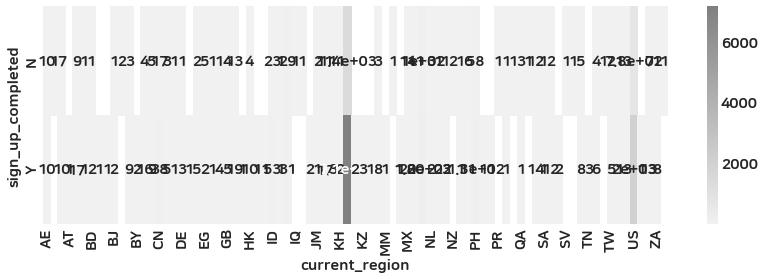

language            ar   de      en    es   fr    in   iw   ja      ko   nb  \
sign_up_completed                                                             
N                  1.0  NaN  1089.0  45.0  2.0  11.0  1.0  1.0  1438.0  NaN   
Y                  NaN  1.0  2754.0  64.0  9.0  23.0  1.0  NaN  7071.0  1.0   

language            pt    ru   sq   th   tr   uk   vi    zh  
sign_up_completed                                            
N                  4.0   8.0  1.0  3.0  3.0  2.0  1.0   6.0  
Y                  7.0  11.0  NaN  2.0  4.0  1.0  1.0  10.0  


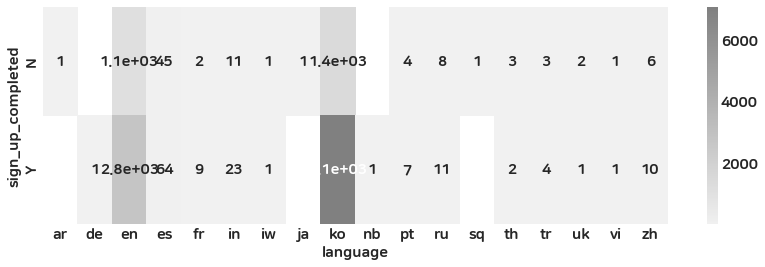

is_out                N     Y
sign_up_completed            
N                  2043   573
Y                  5595  4365


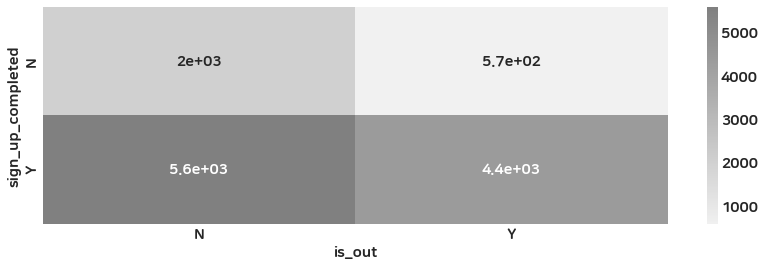

is_deactivated        N     Y
sign_up_completed            
N                   670  1946
Y                  5232  4728


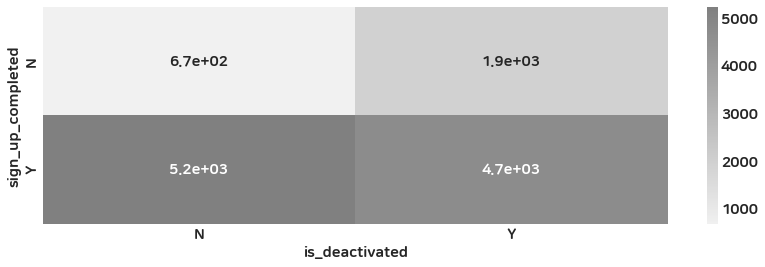

is_blocked           Y
sign_up_completed     
N                  289
Y                  277


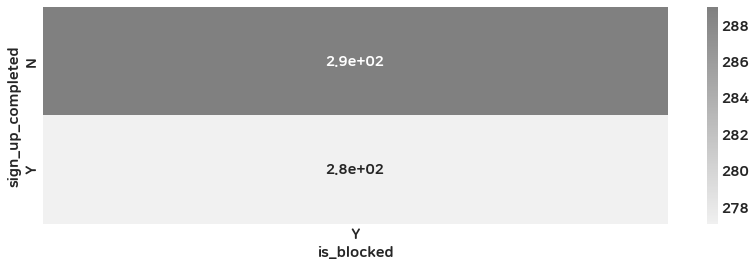

is_confirm             N       Y
sign_up_completed               
N                  482.0   316.0
Y                    NaN  9960.0


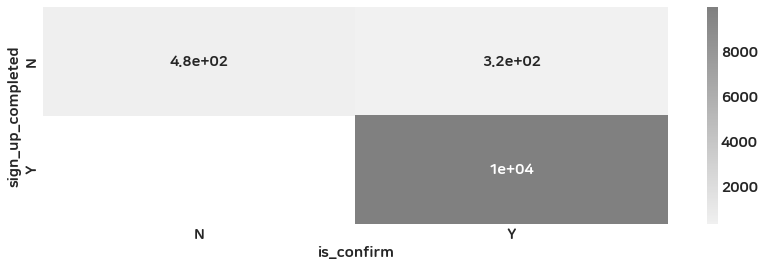

sign_up_completed       N       Y
sign_up_completed                
N                  2616.0     NaN
Y                     NaN  9960.0


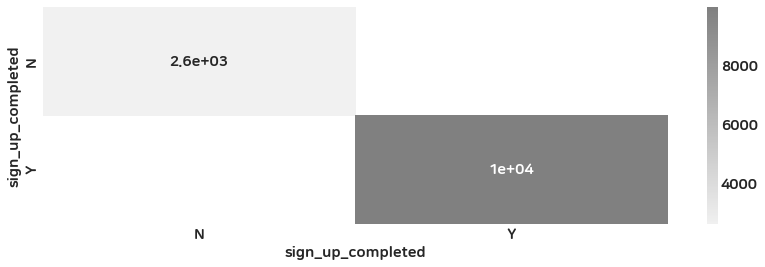

stage              Attraction  Birthday  Body  Drinking  Education  Height  \
sign_up_completed                                                            
N                           2         1    11         3          4      13   

stage              Interest  Job  Location  MatchSetting  Nickname  Picture  \
sign_up_completed                                                             
N                         3   26        37            35        74      479   

stage              ProfileEdit  Religion  Review  Smoking  
sign_up_completed                                          
N                          667         4    1255        2  


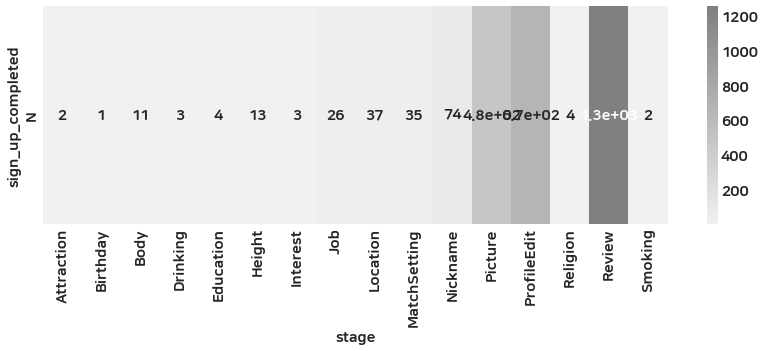

weekdays              0     1     2     3     4     5     6
sign_up_completed                                          
N                   382   332   323   353   407   470   349
Y                  1451  1266  1223  1261  1468  1526  1765


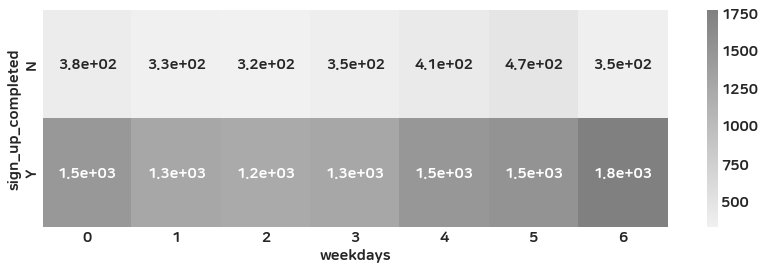

sign_hours          0    1    2    3    4    5    6    7    8    9   ...   14  \
sign_up_completed                                                    ...        
N                   88   85  107  114   91   69   93   93  129  116  ...  149   
Y                  321  337  386  399  444  459  420  434  387  395  ...  762   

sign_hours          15   16   17   18   19   20   21   22   23  
sign_up_completed                                               
N                  173  136   83  109   88   79   73   61   84  
Y                  718  547  391  287  217  193  185  197  242  

[2 rows x 24 columns]


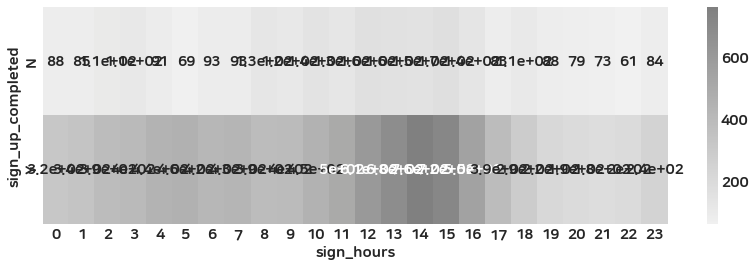

profile_tier  Bronze  Diamond  Gold  Silver
stage                                      
Attraction       NaN      NaN   1.0     1.0
Interest         NaN      NaN   1.0     2.0
Review           4.0    128.0  97.0    81.0


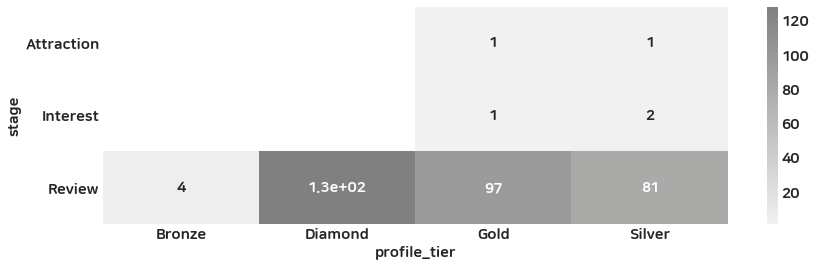

body_type      BF00   BF01   BF02   BF03   BF04   BF05  BM00  BM02  BM04
stage                                                                   
Attraction      NaN    1.0    NaN    NaN    1.0    NaN   NaN   NaN   NaN
Drinking        NaN    1.0    NaN    1.0    1.0    NaN   NaN   NaN   NaN
Education       NaN    NaN    2.0    NaN    2.0    NaN   NaN   NaN   NaN
Height          NaN    1.0    1.0    NaN    NaN    NaN   NaN   NaN   NaN
Interest        NaN    NaN    3.0    NaN    NaN    NaN   NaN   NaN   NaN
Job             NaN    2.0   15.0    1.0    2.0    6.0   NaN   NaN   NaN
MatchSetting    4.0    3.0   16.0    4.0    3.0    5.0   NaN   NaN   NaN
Picture        32.0   73.0  219.0   49.0   29.0   77.0   NaN   NaN   NaN
ProfileEdit    59.0  109.0  277.0   58.0   63.0   99.0   NaN   1.0   1.0
Religion        NaN    NaN    4.0    NaN    NaN    NaN   NaN   NaN   NaN
Review        138.0  229.0  481.0  147.0  126.0  132.0   1.0   NaN   1.0
Smoking         NaN    NaN    2.0    NaN    NaN    

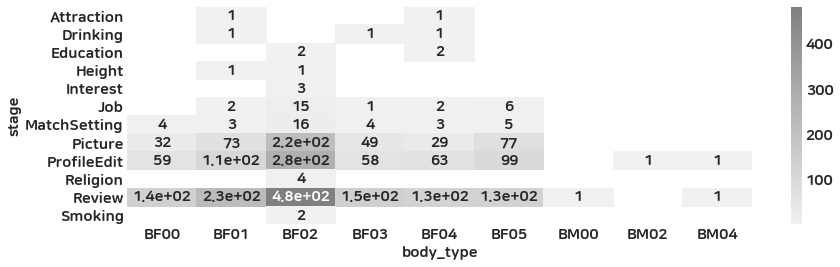

blood_type    A  AB   B   O
stage                      
ProfileEdit  14   6  10  10
Review       48  13  29  37


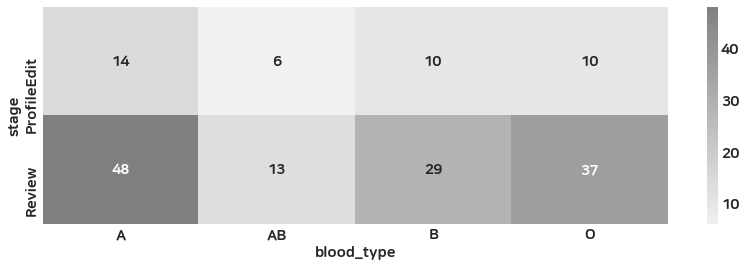

education      UE01   UE02   UE03  UE04  UE05   UE06
stage                                               
Attraction      1.0    NaN    1.0   NaN   NaN    NaN
Drinking        1.0    NaN    1.0   NaN   NaN    1.0
Height          NaN    NaN    1.0   1.0   NaN    NaN
Interest        2.0    NaN    1.0   NaN   NaN    NaN
Job             8.0    3.0   10.0   NaN   NaN    3.0
MatchSetting   14.0    6.0   10.0   1.0   NaN    4.0
Picture       100.0   81.0  225.0  23.0   3.0   35.0
ProfileEdit   204.0   57.0  277.0  25.0   3.0   87.0
Religion        NaN    1.0    1.0   NaN   NaN    1.0
Review        327.0  131.0  559.0  44.0   8.0  165.0
Smoking         1.0    NaN    1.0   NaN   NaN    NaN


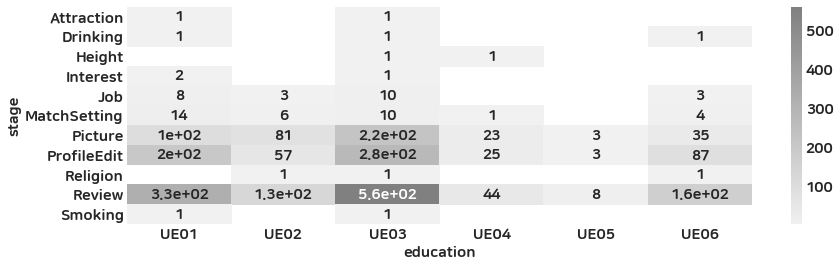

religion       UR00   UR01  UR02   UR03  UR04  UR05  UR06  UR07  UR08  UR09  \
stage                                                                         
Attraction      1.0    1.0   NaN    NaN   NaN   NaN   NaN   NaN   NaN   NaN   
Drinking        1.0    1.0   1.0    NaN   NaN   NaN   NaN   NaN   NaN   NaN   
Height          NaN    NaN   NaN    NaN   NaN   NaN   1.0   NaN   NaN   NaN   
Interest        2.0    1.0   NaN    NaN   NaN   NaN   NaN   NaN   NaN   NaN   
Job             2.0    NaN   NaN    NaN   NaN   NaN   NaN   NaN   NaN   NaN   
MatchSetting   16.0   10.0   1.0    6.0   NaN   NaN   NaN   NaN   NaN   NaN   
Picture       301.0   93.0  24.0   31.0   2.0   3.0   2.0   NaN   NaN   NaN   
ProfileEdit   363.0  162.0  20.0   62.0   1.0   8.0   8.0   NaN   NaN   NaN   
Religion        1.0    NaN   NaN    NaN   NaN   NaN   NaN   NaN   NaN   NaN   
Review        683.0  287.0  38.0  122.0   NaN  20.0   7.0   5.0   2.0   1.0   
Smoking         1.0    1.0   NaN    NaN   NaN   NaN 

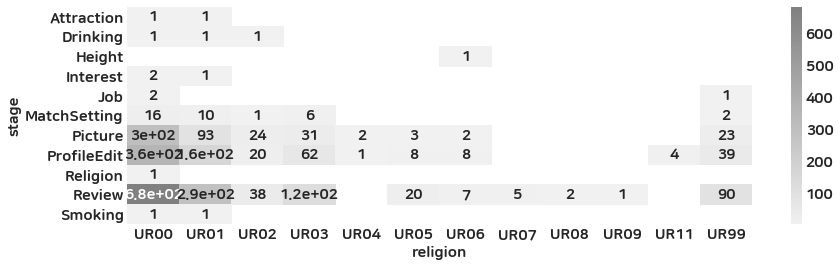

smoking       SM00   SM01   SM02
stage                           
Attraction     NaN    NaN    2.0
Drinking       1.0    NaN    NaN
Height         NaN    NaN    1.0
Interest       NaN    1.0    2.0
Job            NaN    NaN    3.0
MatchSetting   7.0    4.0   24.0
Picture       34.0   77.0  368.0
ProfileEdit   65.0  115.0  487.0
Religion       NaN    NaN    1.0
Review        87.0  195.0  973.0


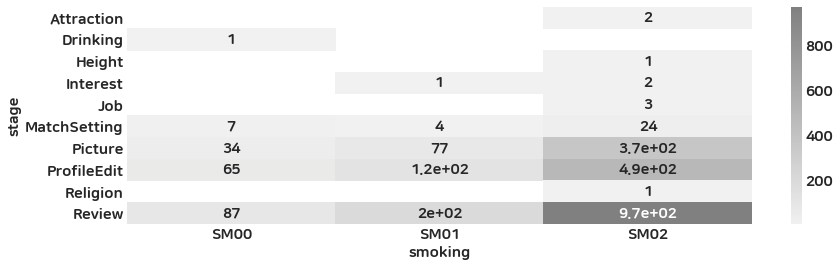

drinking       DR00   DR01   DR02
stage                            
Attraction      NaN    2.0    NaN
Drinking        NaN    NaN    2.0
Height          NaN    NaN    1.0
Interest        NaN    2.0    1.0
Job             NaN    2.0    1.0
MatchSetting    1.0   22.0   12.0
Picture        55.0  313.0  111.0
ProfileEdit    79.0  390.0  198.0
Religion        NaN    1.0    NaN
Review        126.0  785.0  344.0
Smoking         NaN    1.0    1.0


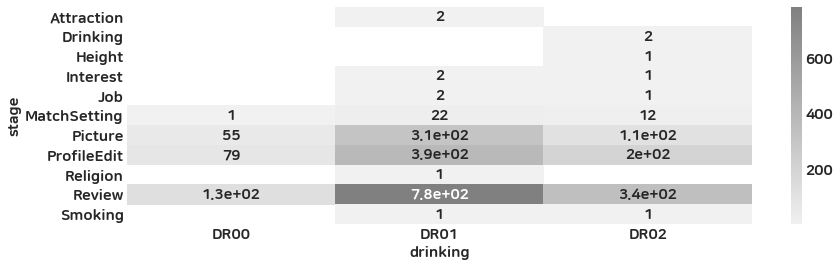

region         AE   AL   AR   AU   BO   BR   CA   CL   CN   CO  ...   RU   SG  \
stage                                                           ...             
Attraction    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
Body          NaN  NaN  2.0  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
Drinking      NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
Education     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
Height        NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
Interest      NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
Job           NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
Location      NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
MatchSetting  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
Picture       1.0  NaN  NaN  1.0  NaN  NaN  NaN  1.0  NaN  NaN  ...  NaN  1.0   
ProfileEdit   3.0  NaN  3.0 

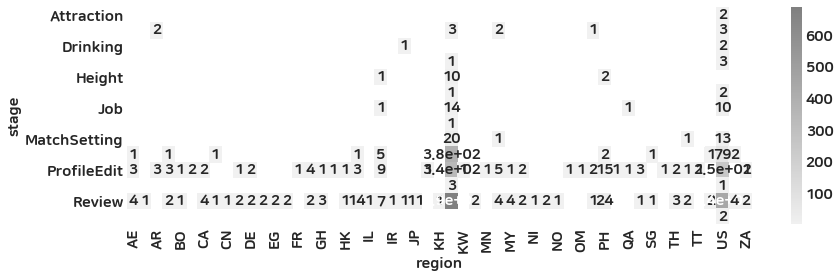

current_region   AE   AL   AR   AU   AZ   BD   BJ   BO   BR   CA  ...   TH  \
stage                                                             ...        
Attraction      NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
Birthday        NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
Body            NaN  NaN  2.0  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
Drinking        NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
Education       NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
Height          NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
Interest        NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
Job             NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
Location        NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  1.0  NaN  ...  NaN   
MatchSetting    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
Nickname        NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN

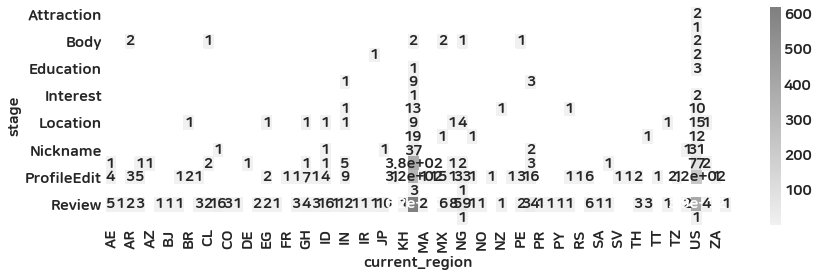

language       ar     en    es   fr   in   iw   ja     ko   pt   ru   sq   th  \
stage                                                                           
Attraction    NaN    2.0   NaN  NaN  NaN  NaN  NaN    NaN  NaN  NaN  NaN  NaN   
Birthday      NaN    1.0   NaN  NaN  NaN  NaN  NaN    NaN  NaN  NaN  NaN  NaN   
Body          NaN    2.0   6.0  NaN  NaN  NaN  NaN    3.0  NaN  NaN  NaN  NaN   
Drinking      NaN    3.0   NaN  NaN  NaN  NaN  NaN    NaN  NaN  NaN  NaN  NaN   
Education     NaN    3.0   NaN  NaN  NaN  NaN  NaN    1.0  NaN  NaN  NaN  NaN   
Height        NaN    4.0   NaN  NaN  NaN  NaN  NaN    9.0  NaN  NaN  NaN  NaN   
Interest      NaN    2.0   NaN  NaN  NaN  NaN  NaN    1.0  NaN  NaN  NaN  NaN   
Job           NaN   13.0   NaN  NaN  NaN  NaN  NaN   13.0  NaN  NaN  NaN  NaN   
Location      NaN   24.0   1.0  NaN  NaN  NaN  NaN   12.0  NaN  NaN  NaN  NaN   
MatchSetting  NaN   15.0   1.0  NaN  NaN  NaN  NaN   19.0  NaN  NaN  NaN  NaN   
Nickname      NaN   36.0   N

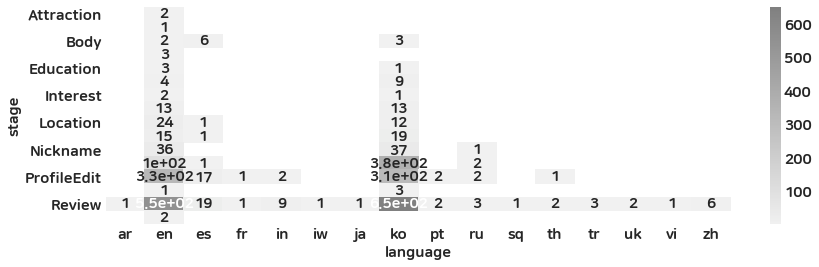

is_out            N      Y
stage                     
Attraction      2.0    NaN
Birthday        1.0    NaN
Body           11.0    NaN
Drinking        3.0    NaN
Education       4.0    NaN
Height         13.0    NaN
Interest        3.0    NaN
Job            26.0    NaN
Location       37.0    NaN
MatchSetting   34.0    1.0
Nickname       74.0    NaN
Picture       477.0    2.0
ProfileEdit   664.0    3.0
Religion        4.0    NaN
Review        688.0  567.0
Smoking         2.0    NaN


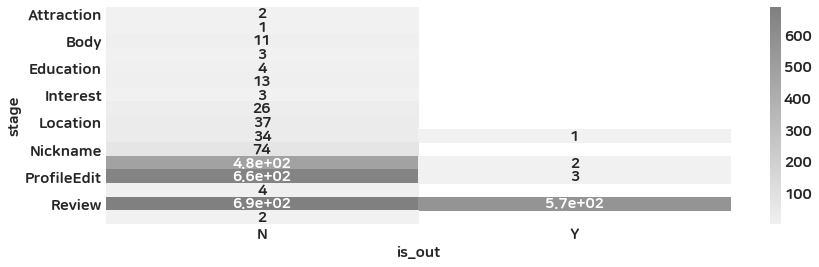

is_deactivated      N      Y
stage                       
Attraction        NaN    2.0
Birthday          NaN    1.0
Body              6.0    5.0
Drinking          2.0    1.0
Education         2.0    2.0
Height            1.0   12.0
Interest          1.0    2.0
Job               8.0   18.0
Location          9.0   28.0
MatchSetting     10.0   25.0
Nickname         23.0   51.0
Picture         125.0  354.0
ProfileEdit     182.0  485.0
Religion          NaN    4.0
Review          301.0  954.0
Smoking           NaN    2.0


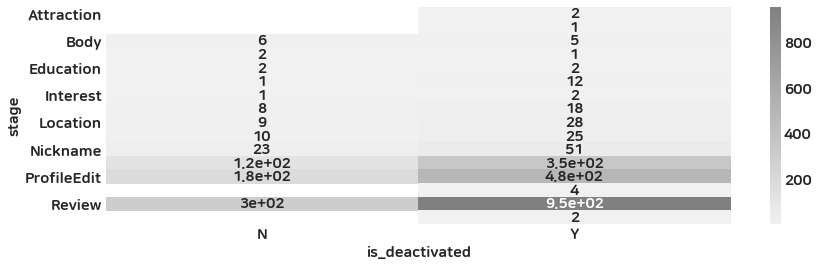

is_blocked    Y
stage          
Review      289


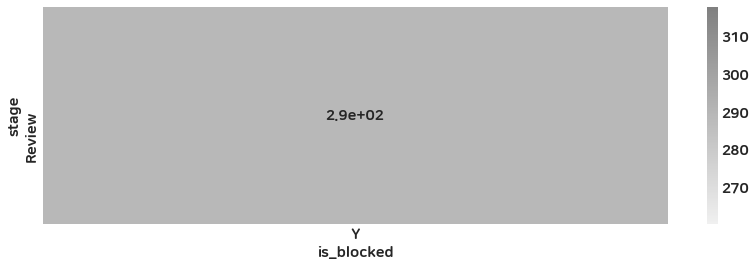

is_confirm      N      Y
stage                   
Attraction    NaN    2.0
Interest      NaN    3.0
Review      482.0  311.0


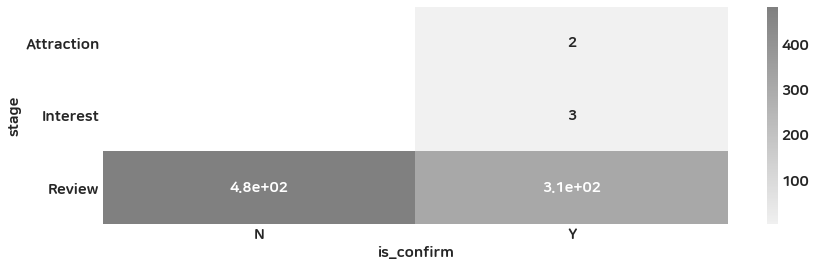

sign_up_completed     N
stage                  
Attraction            2
Birthday              1
Body                 11
Drinking              3
Education             4
Height               13
Interest              3
Job                  26
Location             37
MatchSetting         35
Nickname             74
Picture             479
ProfileEdit         667
Religion              4
Review             1255
Smoking               2


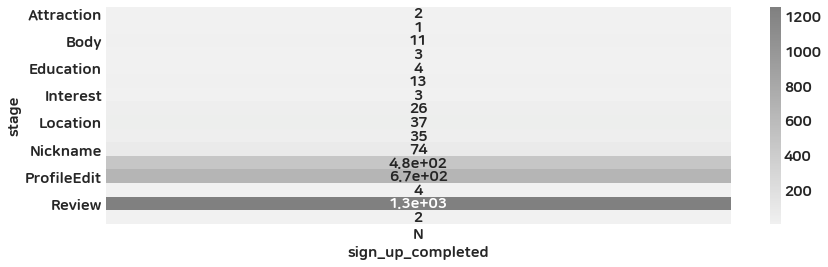

stage         Attraction  Birthday  Body  Drinking  Education  Height  \
stage                                                                   
Attraction           2.0       NaN   NaN       NaN        NaN     NaN   
Birthday             NaN       1.0   NaN       NaN        NaN     NaN   
Body                 NaN       NaN  11.0       NaN        NaN     NaN   
Drinking             NaN       NaN   NaN       3.0        NaN     NaN   
Education            NaN       NaN   NaN       NaN        4.0     NaN   
Height               NaN       NaN   NaN       NaN        NaN    13.0   
Interest             NaN       NaN   NaN       NaN        NaN     NaN   
Job                  NaN       NaN   NaN       NaN        NaN     NaN   
Location             NaN       NaN   NaN       NaN        NaN     NaN   
MatchSetting         NaN       NaN   NaN       NaN        NaN     NaN   
Nickname             NaN       NaN   NaN       NaN        NaN     NaN   
Picture              NaN       NaN   NaN       NaN 

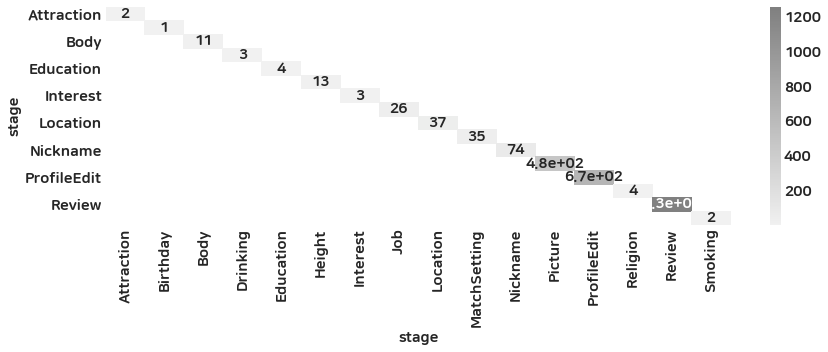

weekdays          0      1      2      3      4      5      6
stage                                                        
Attraction      NaN    1.0    1.0    NaN    NaN    NaN    NaN
Birthday        NaN    NaN    NaN    NaN    NaN    1.0    NaN
Body            1.0    1.0    4.0    1.0    NaN    1.0    3.0
Drinking        1.0    NaN    NaN    1.0    1.0    NaN    NaN
Education       1.0    NaN    NaN    1.0    NaN    NaN    2.0
Height          4.0    2.0    3.0    NaN    2.0    NaN    2.0
Interest        NaN    2.0    NaN    1.0    NaN    NaN    NaN
Job             5.0    2.0    3.0    5.0    3.0    3.0    5.0
Location        5.0   11.0    1.0    3.0    8.0    6.0    3.0
MatchSetting    4.0    6.0    2.0    3.0    7.0    5.0    8.0
Nickname       10.0   12.0    8.0   11.0   13.0   10.0   10.0
Picture        71.0   59.0   62.0   72.0   70.0   79.0   66.0
ProfileEdit   102.0   89.0   90.0   77.0   93.0  140.0   76.0
Religion        1.0    NaN    NaN    1.0    NaN    2.0    NaN
Review  

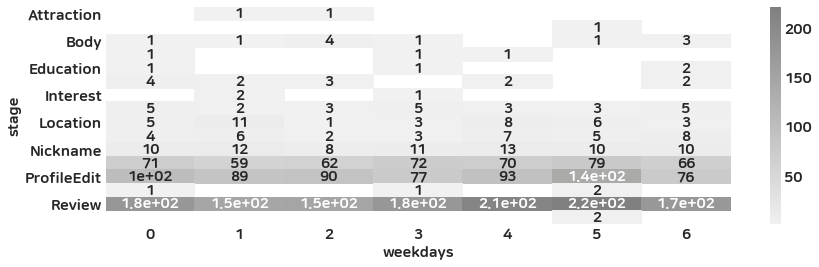

sign_hours      0     1     2     3     4     5     6     7     8     9   ...  \
stage                                                                     ...   
Attraction     NaN   NaN   NaN   1.0   NaN   NaN   NaN   NaN   NaN   NaN  ...   
Birthday       NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN  ...   
Body           NaN   2.0   1.0   NaN   NaN   NaN   2.0   NaN   NaN   1.0  ...   
Drinking       NaN   1.0   NaN   NaN   NaN   NaN   NaN   1.0   NaN   NaN  ...   
Education      NaN   1.0   NaN   NaN   NaN   NaN   NaN   1.0   NaN   NaN  ...   
Height         NaN   NaN   1.0   1.0   NaN   1.0   NaN   2.0   NaN   2.0  ...   
Interest       NaN   NaN   NaN   2.0   NaN   NaN   NaN   NaN   NaN   NaN  ...   
Job            2.0   NaN   NaN   1.0   NaN   1.0   2.0   1.0   1.0   NaN  ...   
Location       1.0   1.0   4.0   NaN   2.0   NaN   1.0   1.0   NaN   2.0  ...   
MatchSetting   NaN   2.0   3.0   2.0   2.0   2.0   1.0   2.0   1.0   2.0  ...   
Nickname       NaN   2.0   1

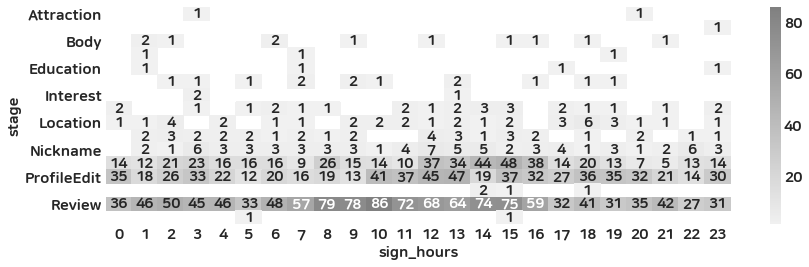

profile_tier  Bronze  Diamond  Gold  Silver
weekdays                                   
0                  2      924   426     141
1                  1      838   355     121
2                  2      778   363     127
3                  4      803   377     129
4                  1      989   424      99
5                  4      987   464     119
6                  4     1151   519     123


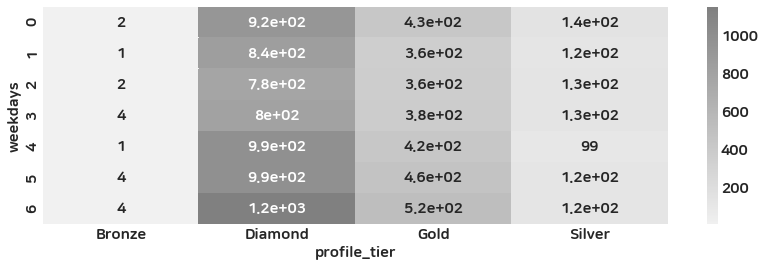

body_type   BF00   BF01   BF02   BF03   BF04   BF05  BM00  BM02  BM04
weekdays                                                             
0          131.0  260.0  764.0  187.0  154.0  315.0   NaN   1.0   2.0
1           90.0  257.0  687.0  133.0  138.0  266.0   NaN   1.0   NaN
2          102.0  232.0  661.0  145.0  138.0  250.0   1.0   2.0   NaN
3           86.0  217.0  757.0  144.0  125.0  269.0   1.0   NaN   NaN
4          113.0  333.0  799.0  177.0  145.0  284.0   NaN   1.0   NaN
5          130.0  301.0  851.0  209.0  159.0  327.0   NaN   1.0   NaN
6          114.0  346.0  978.0  183.0  150.0  323.0   NaN   2.0   NaN


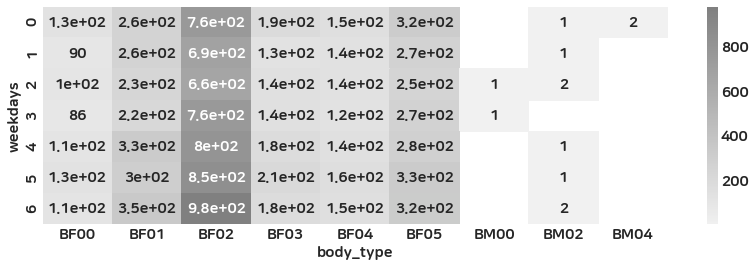

blood_type    A  AB    B    O
weekdays                     
0           136  57  101  137
1           103  49  106  123
2           109  39   93  136
3           119  42   86  121
4           127  39   95  135
5           145  46  117  142
6           178  64  135  158


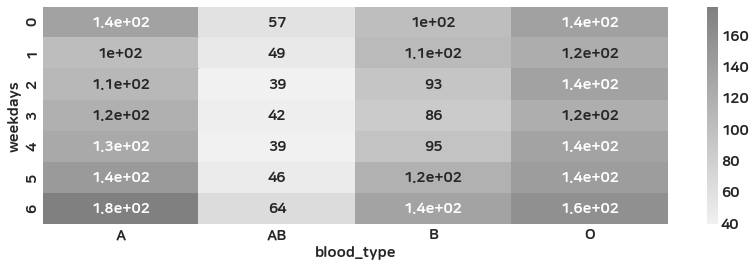

education  UE01  UE02  UE03  UE04  UE05  UE06
weekdays                                     
0           385   291   897    64     4   154
1           354   246   763    59     8   122
2           320   241   744    55     6   143
3           340   218   804    63     9   138
4           364   311   935    69    10   138
5           388   288  1043    85    12   134
6           407   340  1055    84    11   164


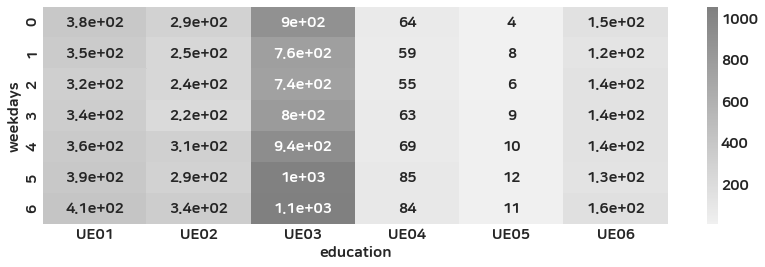

religion    UR00   UR01  UR02   UR03  UR04  UR05  UR06  UR07  UR08  UR09  \
weekdays                                                                   
0         1118.0  398.0  70.0  126.0   NaN  20.0   4.0   2.0   1.0   NaN   
1          970.0  324.0  63.0  129.0   1.0  12.0   8.0   3.0   NaN   NaN   
2          917.0  346.0  51.0  125.0   NaN  12.0   9.0   1.0   NaN   NaN   
3          981.0  334.0  49.0  152.0   1.0   8.0   9.0   NaN   NaN   NaN   
4         1196.0  362.0  64.0  139.0   NaN  17.0   7.0   NaN   2.0   1.0   
5         1255.0  407.0  66.0  143.0   2.0  15.0   5.0   2.0   1.0   NaN   
6         1353.0  424.0  60.0  149.0   NaN  24.0   9.0   NaN   NaN   1.0   

religion  UR10  UR11  UR99  
weekdays                    
0          1.0   NaN  68.0  
1          NaN   2.0  59.0  
2          1.0   1.0  64.0  
3          NaN   NaN  59.0  
4          NaN   1.0  60.0  
5          NaN   3.0  75.0  
6          NaN   NaN  69.0  


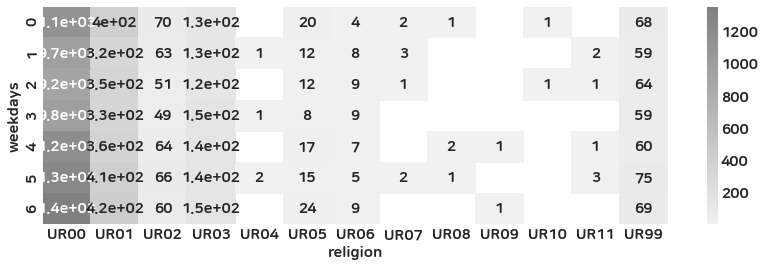

smoking   SM00  SM01  SM02
weekdays                  
0          111   221  1475
1          108   222  1241
2           86   213  1228
3           93   198  1301
4          102   225  1522
5          101   237  1634
6           94   269  1726


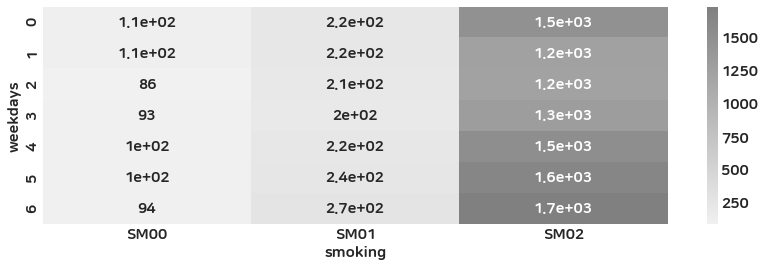

drinking  DR00  DR01  DR02
weekdays                  
0          139  1336   332
1          127  1123   321
2          109  1114   304
3          129  1150   314
4          161  1342   346
5          154  1422   398
6          149  1554   386


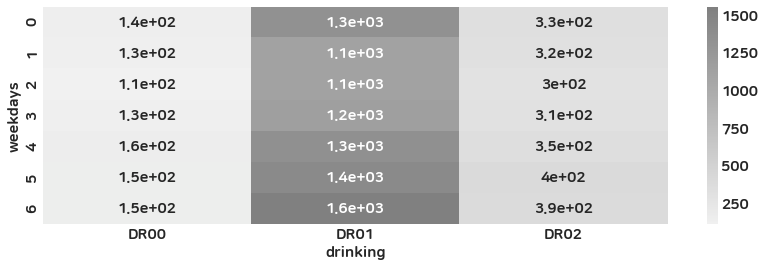

region     AE   AL   AR   AU   AZ   BE   BH   BO   BR   BY  ...   TH   TN  \
weekdays                                                    ...             
0         2.0  NaN  2.0  3.0  NaN  NaN  1.0  1.0  1.0  NaN  ...  3.0  NaN   
1         NaN  NaN  NaN  3.0  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
2         NaN  NaN  NaN  5.0  NaN  NaN  NaN  NaN  2.0  NaN  ...  2.0  NaN   
3         3.0  NaN  2.0  3.0  NaN  1.0  NaN  NaN  NaN  NaN  ...  1.0  NaN   
4         3.0  NaN  2.0  2.0  NaN  NaN  NaN  NaN  2.0  1.0  ...  1.0  1.0   
5         4.0  NaN  1.0  3.0  NaN  NaN  NaN  1.0  3.0  NaN  ...  2.0  NaN   
6         2.0  1.0  1.0  3.0  1.0  NaN  NaN  NaN  NaN  NaN  ...  3.0  1.0   

region     TR   TT   TW   TZ   UA     US   VN   ZA  
weekdays                                            
0         2.0  NaN  NaN  NaN  NaN  472.0  3.0  2.0  
1         NaN  1.0  NaN  NaN  1.0  415.0  NaN  4.0  
2         NaN  NaN  NaN  NaN  1.0  439.0  1.0  1.0  
3         3.0  NaN  1.0  1.0  1.0  438.0 

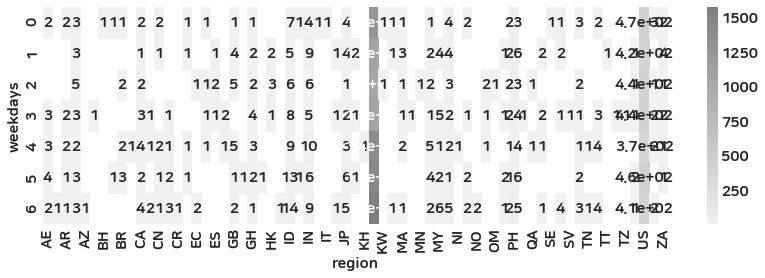

current_region   AE   AL   AR   AT   AU   AZ   BD   BE   BH   BJ  ...   TR  \
weekdays                                                          ...        
0               2.0  NaN  3.0  NaN  4.0  NaN  1.0  NaN  1.0  NaN  ...  3.0   
1               1.0  NaN  2.0  NaN  4.0  NaN  NaN  NaN  NaN  1.0  ...  1.0   
2               1.0  NaN  1.0  NaN  6.0  1.0  2.0  NaN  NaN  NaN  ...  NaN   
3               3.0  NaN  5.0  1.0  3.0  NaN  NaN  1.0  NaN  NaN  ...  1.0   
4               5.0  NaN  4.0  NaN  2.0  NaN  NaN  NaN  NaN  NaN  ...  1.0   
5               6.0  NaN  1.0  NaN  3.0  NaN  NaN  NaN  NaN  2.0  ...  1.0   
6               2.0  1.0  1.0  NaN  4.0  1.0  NaN  NaN  NaN  NaN  ...  3.0   

current_region   TT   TW   TZ   UA     US   VE   VN   ZA   ZW  
weekdays                                                       
0               NaN  1.0  NaN  1.0  450.0  NaN  3.0  2.0  NaN  
1               1.0  1.0  NaN  1.0  388.0  NaN  2.0  3.0  1.0  
2               NaN  NaN  NaN  1.0  411.0

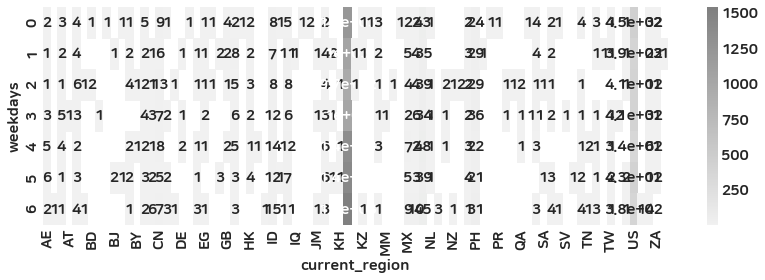

language   ar   de     en    es   fr   in   iw   ja      ko   nb   pt   ru  \
weekdays                                                                     
0         NaN  NaN  614.0  14.0  3.0  5.0  1.0  1.0  1186.0  NaN  1.0  2.0   
1         NaN  NaN  533.0   9.0  3.0  4.0  NaN  NaN  1038.0  NaN  2.0  4.0   
2         1.0  NaN  556.0   8.0  NaN  4.0  NaN  NaN   969.0  NaN  3.0  2.0   
3         NaN  NaN  556.0  17.0  2.0  3.0  NaN  NaN  1028.0  NaN  1.0  3.0   
4         NaN  1.0  487.0  16.0  2.0  7.0  NaN  NaN  1352.0  NaN  2.0  2.0   
5         NaN  NaN  551.0  21.0  1.0  5.0  1.0  NaN  1409.0  NaN  1.0  2.0   
6         NaN  NaN  546.0  24.0  NaN  6.0  NaN  NaN  1527.0  1.0  1.0  4.0   

language   sq   th   tr   uk   vi   zh  
weekdays                                
0         NaN  2.0  2.0  NaN  NaN  2.0  
1         NaN  NaN  1.0  1.0  NaN  3.0  
2         NaN  NaN  NaN  NaN  NaN  3.0  
3         NaN  NaN  1.0  NaN  NaN  3.0  
4         NaN  2.0  1.0  NaN  2.0  1.0  
5         

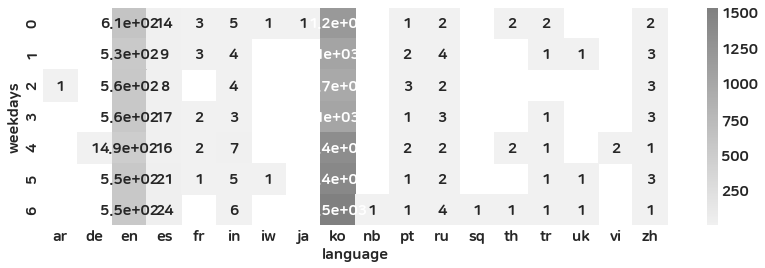

is_out       N    Y
weekdays           
0         1140  693
1         1029  569
2          993  553
3          988  626
4         1109  766
5         1162  834
6         1217  897


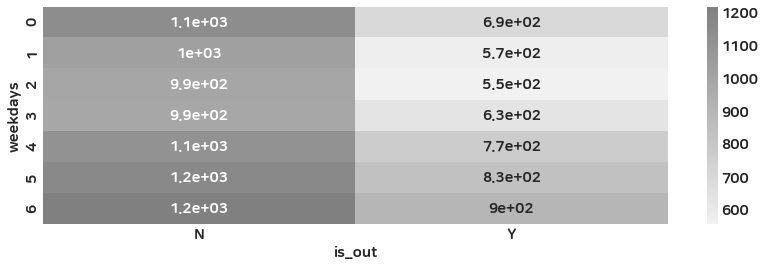

is_deactivated     N     Y
weekdays                  
0                986   847
1                856   742
2                775   771
3                698   916
4                561  1314
5                858  1138
6               1168   946


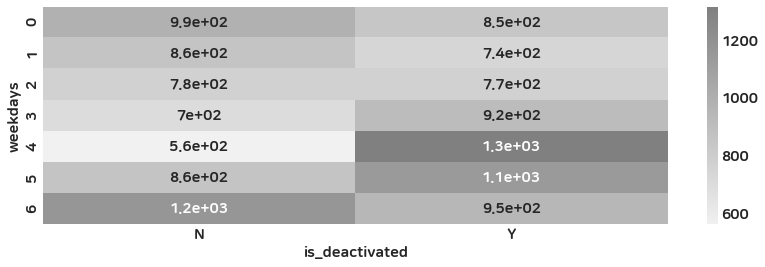

is_blocked    Y
weekdays       
0            81
1            66
2            55
3            91
4           115
5            96
6            62


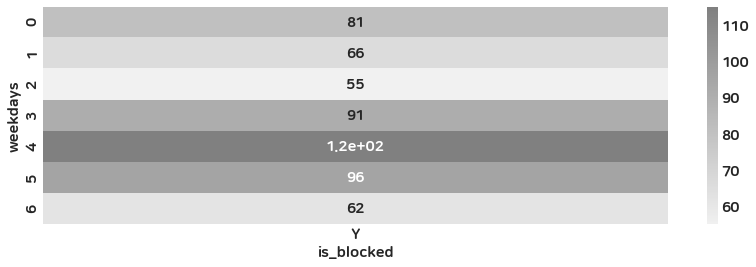

is_confirm   N     Y
weekdays            
0           63  1493
1           49  1315
2           48  1270
3           74  1313
4           86  1514
5           96  1574
6           66  1797


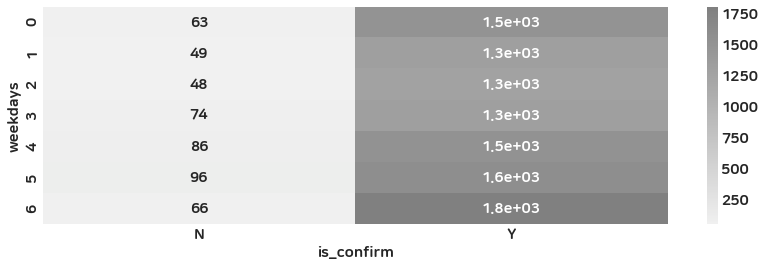

sign_up_completed    N     Y
weekdays                    
0                  382  1451
1                  332  1266
2                  323  1223
3                  353  1261
4                  407  1468
5                  470  1526
6                  349  1765


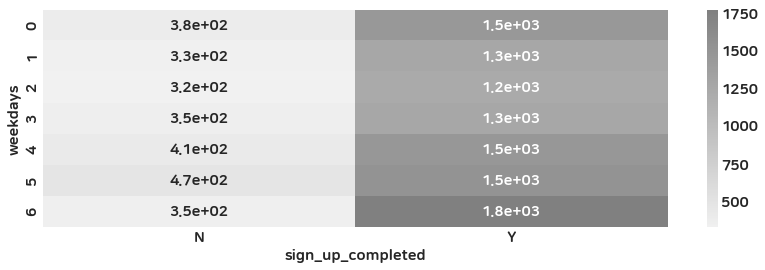

stage     Attraction  Birthday  Body  Drinking  Education  Height  Interest  \
weekdays                                                                      
0                NaN       NaN   1.0       1.0        1.0     4.0       NaN   
1                1.0       NaN   1.0       NaN        NaN     2.0       2.0   
2                1.0       NaN   4.0       NaN        NaN     3.0       NaN   
3                NaN       NaN   1.0       1.0        1.0     NaN       1.0   
4                NaN       NaN   NaN       1.0        NaN     2.0       NaN   
5                NaN       1.0   1.0       NaN        NaN     NaN       NaN   
6                NaN       NaN   3.0       NaN        2.0     2.0       NaN   

stage     Job  Location  MatchSetting  Nickname  Picture  ProfileEdit  \
weekdays                                                                
0         5.0       5.0           4.0      10.0     71.0        102.0   
1         2.0      11.0           6.0      12.0     59.0         89.0

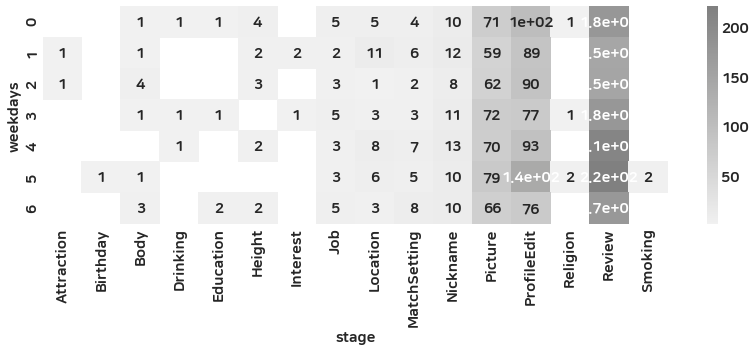

weekdays       0       1       2       3       4       5       6
weekdays                                                        
0         1833.0     NaN     NaN     NaN     NaN     NaN     NaN
1            NaN  1598.0     NaN     NaN     NaN     NaN     NaN
2            NaN     NaN  1546.0     NaN     NaN     NaN     NaN
3            NaN     NaN     NaN  1614.0     NaN     NaN     NaN
4            NaN     NaN     NaN     NaN  1875.0     NaN     NaN
5            NaN     NaN     NaN     NaN     NaN  1996.0     NaN
6            NaN     NaN     NaN     NaN     NaN     NaN  2114.0


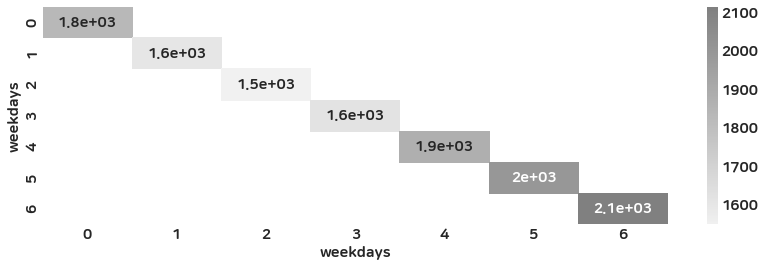

sign_hours  0   1   2   3   4   5   6   7   8    9   ...   14   15   16  17  \
weekdays                                             ...                      
0           66  64  91  84  82  74  71  60  67   82  ...  128  120   85  63   
1           56  65  61  71  74  76  53  73  75   53  ...  102  102   77  69   
2           52  61  62  63  66  78  75  77  65   54  ...  147  111   59  46   
3           44  48  58  59  63  61  69  59  62   62  ...  133  120  103  65   
4           60  52  79  67  85  74  76  79  74   68  ...  123  139  108  75   
5           75  62  72  85  80  69  75  85  89   80  ...  144  151  123  83   
6           56  70  70  84  85  96  94  94  84  112  ...  134  148  128  73   

sign_hours  18  19  20  21  22  23  
weekdays                            
0           49  56  43  39  42  58  
1           50  28  41  36  25  42  
2           29  40  31  28  28  35  
3           48  46  31  40  51  42  
4           78  42  38  41  37  47  
5           89  55  44  41  3

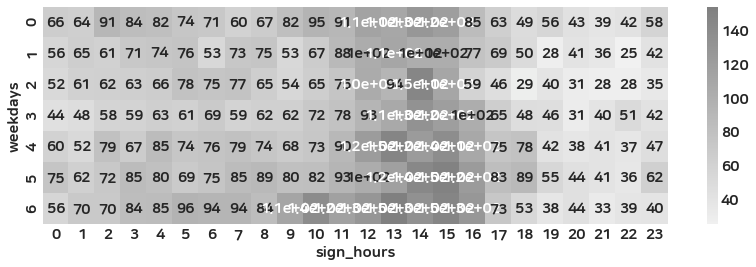

profile_tier  Bronze  Diamond   Gold  Silver
sign_hours                                  
0                1.0    163.0  116.0    54.0
1                1.0    215.0  109.0    31.0
2                1.0    224.0  133.0    46.0
3                NaN    266.0  106.0    45.0
4                NaN    251.0  156.0    57.0
5                NaN    297.0  133.0    41.0
6                2.0    255.0  138.0    42.0
7                5.0    290.0  109.0    40.0
8                2.0    262.0  108.0    30.0
9                NaN    286.0  101.0    19.0
10               NaN    314.0  119.0    24.0
11               NaN    363.0  129.0    19.0
12               NaN    426.0  159.0    28.0
13               2.0    452.0  207.0    29.0
14               NaN    542.0  204.0    34.0
15               NaN    504.0  194.0    40.0
16               NaN    365.0  163.0    32.0
17               1.0    247.0  119.0    32.0
18               NaN    189.0   86.0    26.0
19               1.0    129.0   65.0    32.0
20        

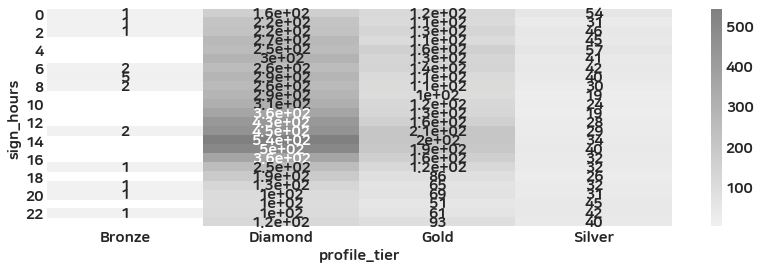

body_type   BF00   BF01   BF02  BF03  BF04   BF05  BM00  BM02  BM04
sign_hours                                                         
0           37.0   56.0  156.0  33.0  51.0   75.0   NaN   NaN   NaN
1           17.0   69.0  180.0  49.0  39.0   63.0   NaN   NaN   NaN
2           31.0   55.0  209.0  51.0  59.0   82.0   NaN   NaN   NaN
3           35.0   78.0  226.0  52.0  45.0   70.0   NaN   NaN   NaN
4           38.0   92.0  215.0  45.0  48.0   91.0   NaN   NaN   1.0
5           36.0   88.0  228.0  39.0  52.0   81.0   NaN   NaN   NaN
6           25.0   79.0  207.0  52.0  48.0   96.0   NaN   NaN   NaN
7           34.0   79.0  218.0  53.0  60.0   76.0   NaN   1.0   NaN
8           30.0   84.0  221.0  53.0  49.0   76.0   NaN   NaN   NaN
9           35.0   75.0  229.0  53.0  39.0   72.0   NaN   NaN   NaN
10          33.0   92.0  288.0  51.0  35.0   90.0   NaN   1.0   NaN
11          47.0  110.0  273.0  56.0  41.0   98.0   NaN   NaN   NaN
12          37.0  119.0  361.0  58.0  39.0  146.

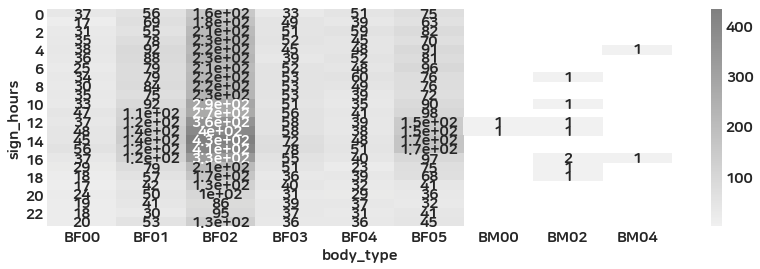

blood_type   A  AB   B   O
sign_hours                
0           30  10  27  39
1           28  14  32  30
2           31  11  26  36
3           40   9  28  45
4           45  17  30  47
5           37  16  32  45
6           47  13  26  43
7           29  17  40  45
8           32  15  29  35
9           38  11  19  32
10          42  12  35  33
11          33  16  37  47
12          61  14  45  60
13          73  29  52  46
14          67  22  65  72
15          56  17  48  59
16          59  19  41  52
17          39  13  35  41
18          21   7  25  32
19          24  11  17  31
20          18   8  11  22
21          24   8  11  20
22          18  15   9  19
23          25  12  13  21


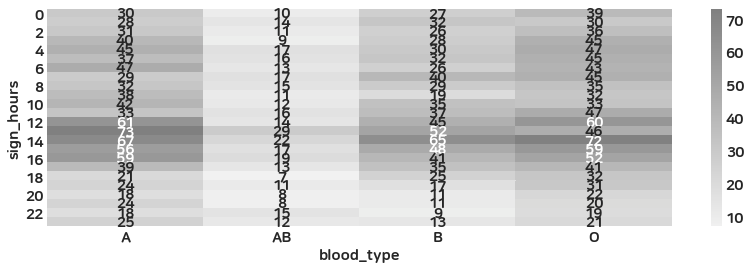

education    UE01   UE02   UE03  UE04  UE05  UE06
sign_hours                                       
0           122.0   46.0  178.0  15.0   2.0  40.0
1           110.0   59.0  196.0  14.0   3.0  28.0
2           130.0   64.0  220.0  26.0   2.0  39.0
3           126.0   72.0  243.0  23.0   2.0  37.0
4           111.0   83.0  277.0  12.0   1.0  40.0
5            99.0   66.0  285.0  20.0   1.0  48.0
6           120.0   72.0  262.0  15.0   2.0  33.0
7            85.0   76.0  261.0  24.0   4.0  58.0
8            82.0   70.0  274.0  13.0   2.0  65.0
9            78.0   89.0  261.0  20.0   3.0  42.0
10           91.0   97.0  306.0  26.0   3.0  57.0
11          101.0  128.0  318.0  22.0   1.0  41.0
12          118.0  164.0  389.0  29.0   4.0  50.0
13          136.0  166.0  418.0  30.0   4.0  61.0
14          169.0  165.0  465.0  43.0   NaN  49.0
15          153.0  157.0  464.0  38.0   5.0  57.0
16          111.0  109.0  374.0  19.0   1.0  57.0
17          106.0   58.0  247.0  15.0   4.0  32.0


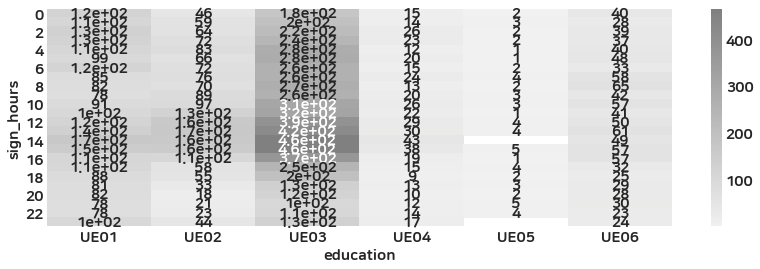

religion     UR00   UR01  UR02  UR03  UR04  UR05  UR06  UR07  UR08  UR09  \
sign_hours                                                                 
0           197.0  110.0  13.0  53.0   NaN   2.0   NaN   1.0   NaN   NaN   
1           239.0  118.0  15.0  23.0   NaN   1.0   2.0   NaN   NaN   NaN   
2           277.0  115.0  15.0  49.0   NaN   3.0   2.0   NaN   1.0   NaN   
3           295.0   98.0  19.0  54.0   NaN   7.0   3.0   NaN   NaN   NaN   
4           304.0  135.0  18.0  41.0   NaN   4.0   3.0   1.0   NaN   NaN   
5           335.0  106.0  15.0  43.0   NaN   4.0   3.0   NaN   NaN   NaN   
6           314.0   99.0  21.0  43.0   NaN   3.0   2.0   NaN   NaN   NaN   
7           341.0  102.0  14.0  39.0   NaN   6.0   1.0   NaN   NaN   NaN   
8           314.0  110.0  17.0  44.0   1.0   7.0   1.0   1.0   1.0   NaN   
9           356.0   78.0  18.0  29.0   NaN   2.0   4.0   1.0   NaN   NaN   
10          412.0  108.0  12.0  41.0   1.0   3.0   2.0   NaN   NaN   NaN   
11          

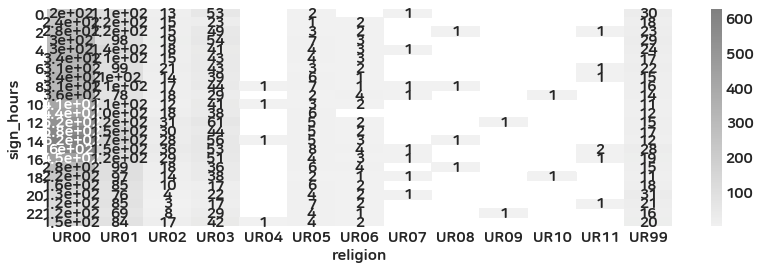

smoking     SM00  SM01  SM02
sign_hours                  
0             25    58   323
1             28    56   331
2             32    68   386
3             34    67   404
4             26    83   421
5             20    70   432
6             34    68   403
7             27    51   441
8             25    56   431
9             25    56   422
10            37    57   496
11            22    67   535
12            41    92   628
13            34    78   717
14            33    94   774
15            46   116   720
16            44    76   559
17            42    63   359
18            24    64   297
19            25    53   218
20            19    51   200
21            18    54   181
22            14    44   194
23            20    43   255


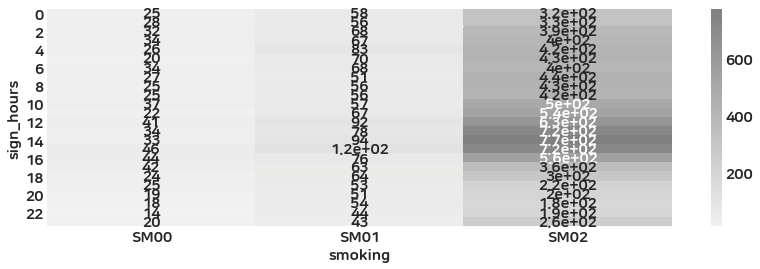

drinking    DR00  DR01  DR02
sign_hours                  
0             29   265   112
1             20   290   106
2             39   345   102
3             45   348   112
4             43   387   100
5             41   376   106
6             38   386    81
7             50   383    86
8             41   367   104
9             46   371    86
10            49   435   106
11            37   467   120
12            56   588   117
13            71   622   136
14            57   696   148
15            85   665   133
16            63   506   110
17            31   341    92
18            38   262    85
19            23   191    82
20            21   176    73
21            10   181    62
22            15   175    62
23            20   218    80


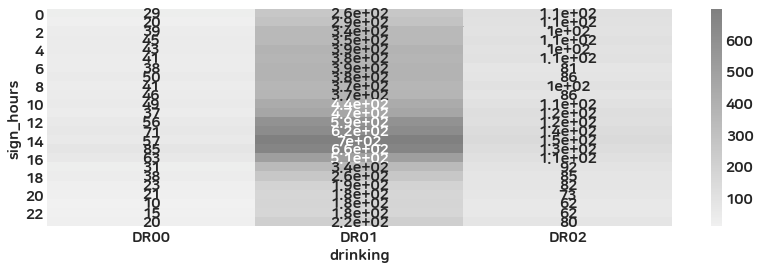

region       AE   AL   AR   AU   AZ   BE   BH   BO   BR   BY  ...   TH   TN  \
sign_hours                                                    ...             
0           NaN  NaN  NaN  1.0  NaN  NaN  NaN  NaN  NaN  NaN  ...  1.0  NaN   
1           NaN  NaN  NaN  1.0  NaN  NaN  NaN  NaN  NaN  NaN  ...  1.0  NaN   
2           NaN  NaN  2.0  1.0  NaN  NaN  NaN  1.0  NaN  NaN  ...  NaN  NaN   
3           NaN  NaN  1.0  3.0  NaN  NaN  NaN  1.0  NaN  NaN  ...  NaN  NaN   
4           1.0  NaN  1.0  1.0  NaN  NaN  NaN  NaN  1.0  NaN  ...  NaN  NaN   
5           1.0  NaN  NaN  1.0  NaN  NaN  NaN  NaN  1.0  NaN  ...  NaN  NaN   
6           1.0  NaN  1.0  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
7           NaN  NaN  NaN  3.0  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
8           1.0  NaN  NaN  1.0  NaN  NaN  NaN  NaN  1.0  NaN  ...  1.0  NaN   
9           NaN  NaN  NaN  2.0  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN  NaN   
10          1.0  NaN  NaN  NaN  NaN  NaN  NaN  NaN  

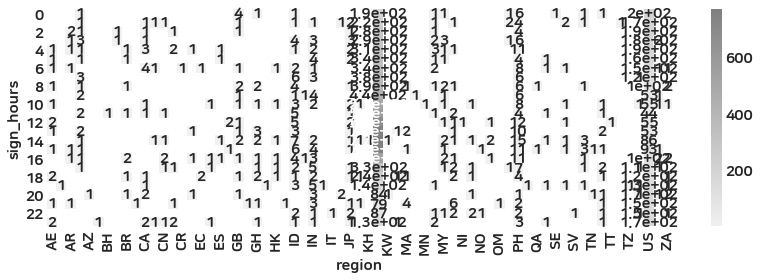

current_region   AE   AL   AR   AT   AU   AZ   BD   BE   BH   BJ  ...   TR  \
sign_hours                                                        ...        
0               1.0  NaN  2.0  NaN  1.0  NaN  NaN  NaN  NaN  NaN  ...  NaN   
1               NaN  NaN  2.0  1.0  2.0  NaN  1.0  NaN  NaN  NaN  ...  NaN   
2               NaN  NaN  2.0  NaN  2.0  NaN  NaN  NaN  NaN  NaN  ...  NaN   
3               NaN  NaN  1.0  NaN  3.0  NaN  NaN  NaN  NaN  NaN  ...  NaN   
4               1.0  NaN  1.0  NaN  NaN  NaN  1.0  NaN  NaN  NaN  ...  1.0   
5               1.0  NaN  NaN  NaN  1.0  NaN  NaN  NaN  NaN  NaN  ...  NaN   
6               1.0  NaN  2.0  NaN  1.0  NaN  NaN  NaN  NaN  NaN  ...  NaN   
7               NaN  NaN  NaN  NaN  2.0  NaN  NaN  NaN  NaN  1.0  ...  NaN   
8               1.0  NaN  1.0  NaN  1.0  NaN  NaN  NaN  NaN  NaN  ...  NaN   
9               NaN  NaN  NaN  NaN  2.0  NaN  NaN  NaN  NaN  NaN  ...  NaN   
10              1.0  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN

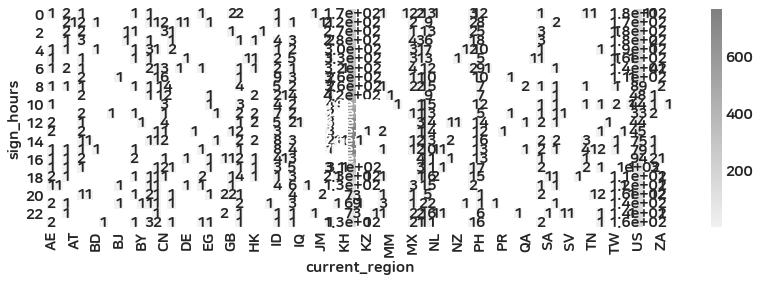

language     ar   de     en    es   fr   in   iw   ja     ko   nb   pt   ru  \
sign_hours                                                                    
0           NaN  NaN  225.0  12.0  2.0  1.0  NaN  NaN  169.0  NaN  NaN  NaN   
1           NaN  NaN  197.0   6.0  NaN  1.0  NaN  NaN  217.0  NaN  NaN  NaN   
2           NaN  1.0  210.0   8.0  NaN  NaN  NaN  NaN  272.0  NaN  1.0  NaN   
3           NaN  NaN  213.0   8.0  NaN  2.0  NaN  NaN  289.0  NaN  NaN  NaN   
4           NaN  NaN  227.0   9.0  NaN  1.0  NaN  NaN  297.0  NaN  1.0  NaN   
5           NaN  NaN  191.0   4.0  NaN  1.0  NaN  NaN  330.0  NaN  NaN  2.0   
6           NaN  NaN  176.0   8.0  NaN  1.0  NaN  NaN  327.0  NaN  NaN  1.0   
7           NaN  NaN  150.0   2.0  NaN  6.0  NaN  NaN  367.0  NaN  NaN  1.0   
8           NaN  NaN  136.0   3.0  NaN  2.0  NaN  NaN  372.0  NaN  2.0  1.0   
9           NaN  NaN   89.0   NaN  NaN  NaN  1.0  NaN  420.0  NaN  NaN  NaN   
10          NaN  NaN  110.0   NaN  NaN  1.0  NaN  Na

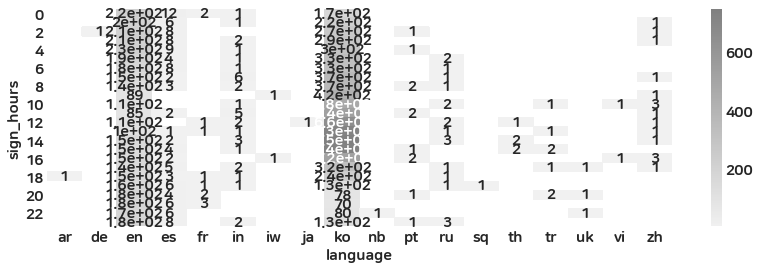

is_out        N    Y
sign_hours          
0           278  131
1           286  136
2           330  163
3           330  183
4           330  205
5           309  219
6           309  204
7           328  199
8           356  160
9           330  181
10          357  237
11          371  260
12          454  317
13          445  394
14          488  423
15          500  391
16          390  293
17          271  203
18          221  175
19          197  108
20          177   95
21          165   93
22          176   82
23          240   86


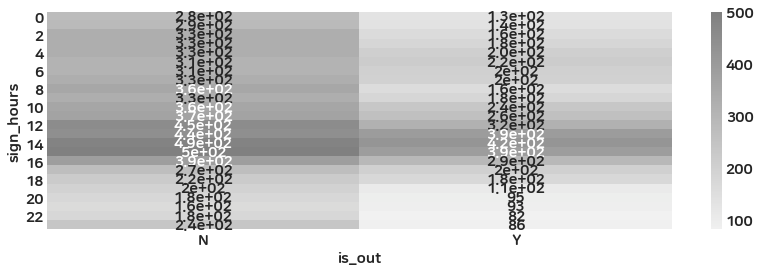

is_deactivated    N    Y
sign_hours              
0               179  230
1               216  206
2               229  264
3               244  269
4               242  293
5               251  277
6               248  265
7               264  263
8               250  266
9               221  290
10              289  305
11              293  338
12              384  387
13              411  428
14              454  457
15              429  462
16              306  377
17              216  258
18              153  243
19              129  176
20              124  148
21              114  144
22              103  155
23              153  173


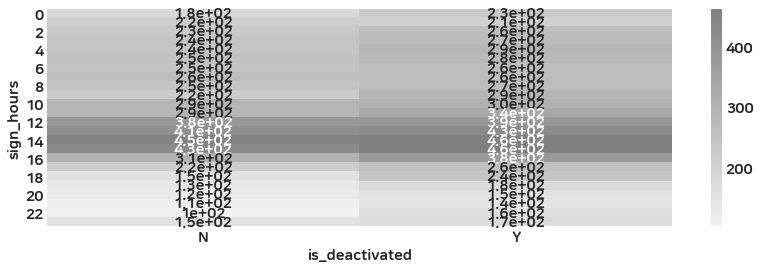

is_blocked   Y
sign_hours    
0            9
1            9
2           18
3           24
4           16
5           14
6           21
7           59
8           73
9           92
10          65
11          51
12          34
13          13
14          16
15          13
16           8
17           3
18           6
19           4
20           3
21           3
22           8
23           4


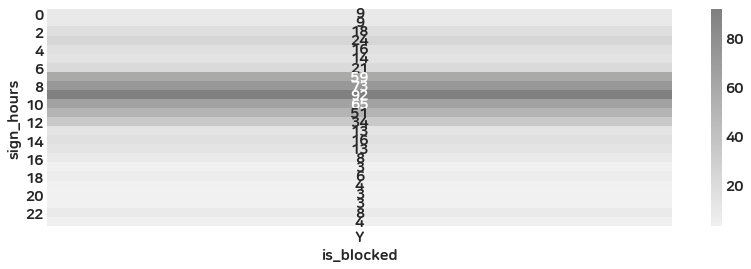

is_confirm     N      Y
sign_hours             
0           13.0  334.0
1            9.0  356.0
2           13.0  404.0
3           20.0  417.0
4           12.0  464.0
5            7.0  471.0
6            6.0  437.0
7           34.0  444.0
8           47.0  403.0
9           56.0  406.0
10          61.0  457.0
11          46.0  511.0
12          42.0  613.0
13          27.0  690.0
14          20.0  780.0
15          22.0  738.0
16          21.0  560.0
17           1.0  399.0
18           5.0  301.0
19           NaN  227.0
20           4.0  205.0
21           5.0  197.0
22           6.0  208.0
23           5.0  254.0


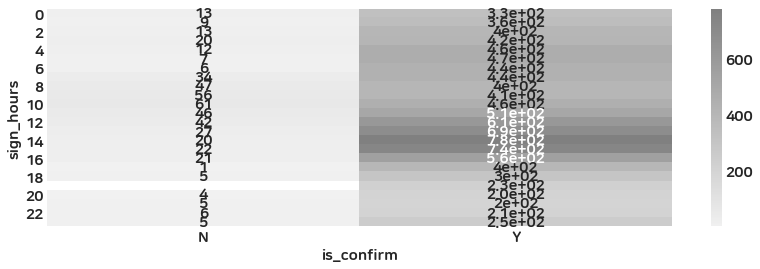

sign_up_completed    N    Y
sign_hours                 
0                   88  321
1                   85  337
2                  107  386
3                  114  399
4                   91  444
5                   69  459
6                   93  420
7                   93  434
8                  129  387
9                  116  395
10                 145  449
11                 127  504
12                 164  607
13                 160  679
14                 149  762
15                 173  718
16                 136  547
17                  83  391
18                 109  287
19                  88  217
20                  79  193
21                  73  185
22                  61  197
23                  84  242


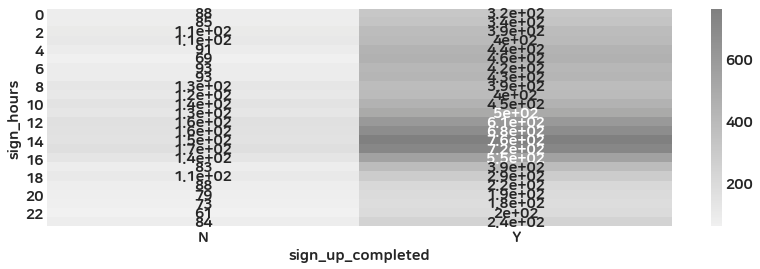

stage       Attraction  Birthday  Body  Drinking  Education  Height  Interest  \
sign_hours                                                                      
0                  NaN       NaN   NaN       NaN        NaN     NaN       NaN   
1                  NaN       NaN   2.0       1.0        1.0     NaN       NaN   
2                  NaN       NaN   1.0       NaN        NaN     1.0       NaN   
3                  1.0       NaN   NaN       NaN        NaN     1.0       2.0   
4                  NaN       NaN   NaN       NaN        NaN     NaN       NaN   
5                  NaN       NaN   NaN       NaN        NaN     1.0       NaN   
6                  NaN       NaN   2.0       NaN        NaN     NaN       NaN   
7                  NaN       NaN   NaN       1.0        1.0     2.0       NaN   
8                  NaN       NaN   NaN       NaN        NaN     NaN       NaN   
9                  NaN       NaN   1.0       NaN        NaN     2.0       NaN   
10                 NaN      

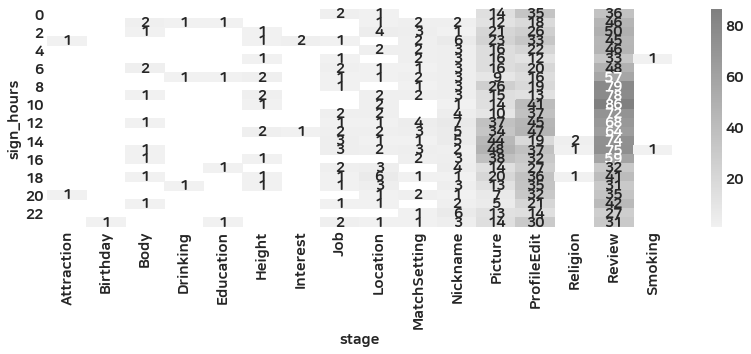

weekdays      0    1    2    3    4    5    6
sign_hours                                   
0            66   56   52   44   60   75   56
1            64   65   61   48   52   62   70
2            91   61   62   58   79   72   70
3            84   71   63   59   67   85   84
4            82   74   66   63   85   80   85
5            74   76   78   61   74   69   96
6            71   53   75   69   76   75   94
7            60   73   77   59   79   85   94
8            67   75   65   62   74   89   84
9            82   53   54   62   68   80  112
10           95   67   65   72   73   82  140
11           91   88   75   78   90   93  116
12          114  104  105   93  122  104  129
13          109  110   94  107  148  117  154
14          128  102  147  133  123  144  134
15          120  102  111  120  139  151  148
16           85   77   59  103  108  123  128
17           63   69   46   65   75   83   73
18           49   50   29   48   78   89   53
19           56   28   40   46   4

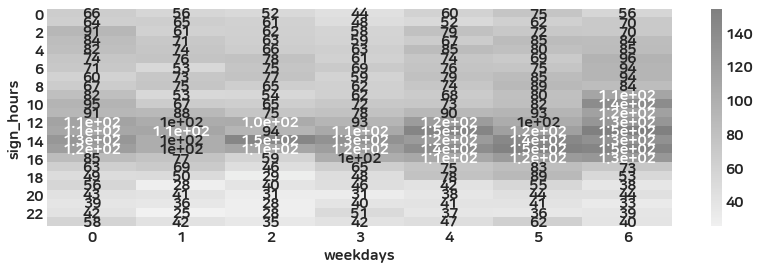

sign_hours     0      1      2      3      4      5      6      7      8   \
sign_hours                                                                  
0           409.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
1             NaN  422.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
2             NaN    NaN  493.0    NaN    NaN    NaN    NaN    NaN    NaN   
3             NaN    NaN    NaN  513.0    NaN    NaN    NaN    NaN    NaN   
4             NaN    NaN    NaN    NaN  535.0    NaN    NaN    NaN    NaN   
5             NaN    NaN    NaN    NaN    NaN  528.0    NaN    NaN    NaN   
6             NaN    NaN    NaN    NaN    NaN    NaN  513.0    NaN    NaN   
7             NaN    NaN    NaN    NaN    NaN    NaN    NaN  527.0    NaN   
8             NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN  516.0   
9             NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
10            NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   

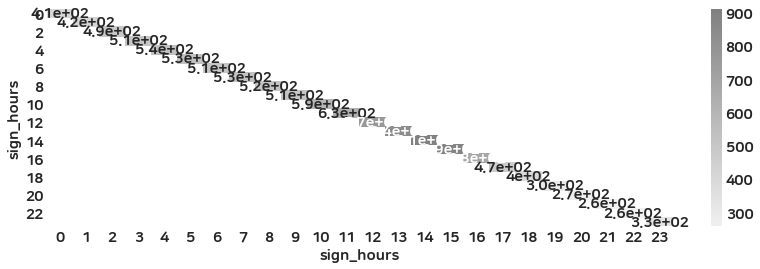

In [72]:
for i in category_col:
    for j in category_col:
        ind = data.pivot_table(index=f"{i}", columns=f"{j}", aggfunc="size")
        print(ind)
        sns.heatmap(data.pivot_table(index=f"{i}", columns=f"{j}", aggfunc="size"),
                cmap=sns.light_palette("gray", as_cmap=True), annot=True)
        plt.show()

# conti x conti

In [73]:
continuous_col = ['photo_count',
       'profile_score', 'height',
       'account_created_at', 'stage_updated_at', 'last_activity_at',
       'age', 'StandardScaler_age', 'rating_p', 'activate_p', 'active_p',
       'character_response']

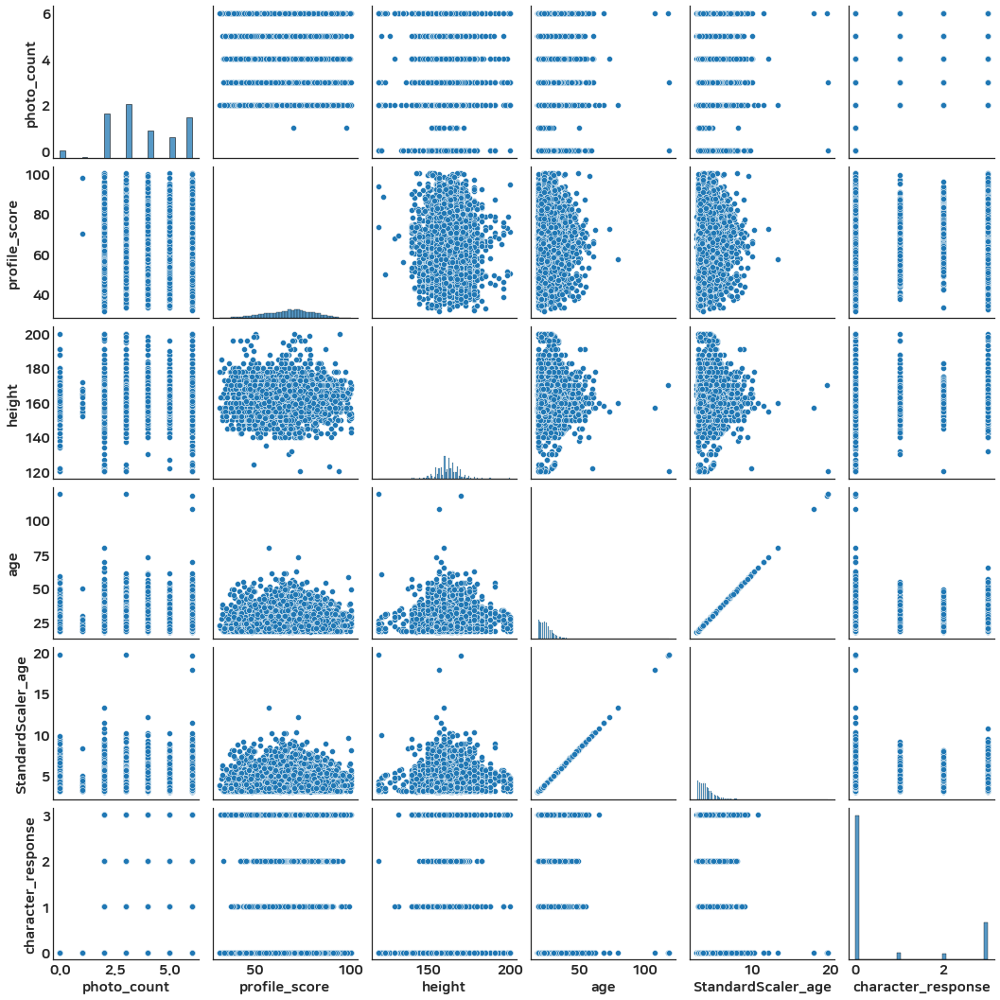

In [74]:
# data[continuous_col]
sns.pairplot(data[continuous_col])

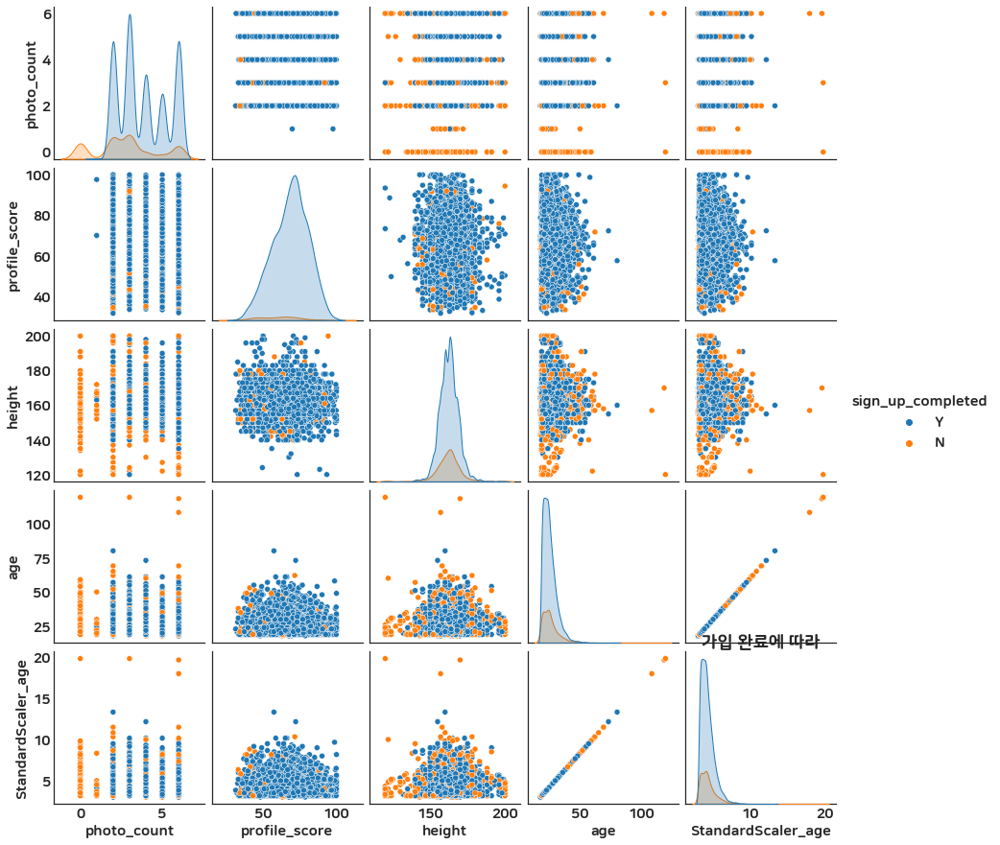

In [75]:
continuous_col_select1 = ['photo_count',
       'profile_score', 'height',
       'age', 'StandardScaler_age', 'sign_up_completed']


sns.pairplot(data[continuous_col_select1], hue="sign_up_completed")
plt.title("가입 완료에 따라")
plt.show()

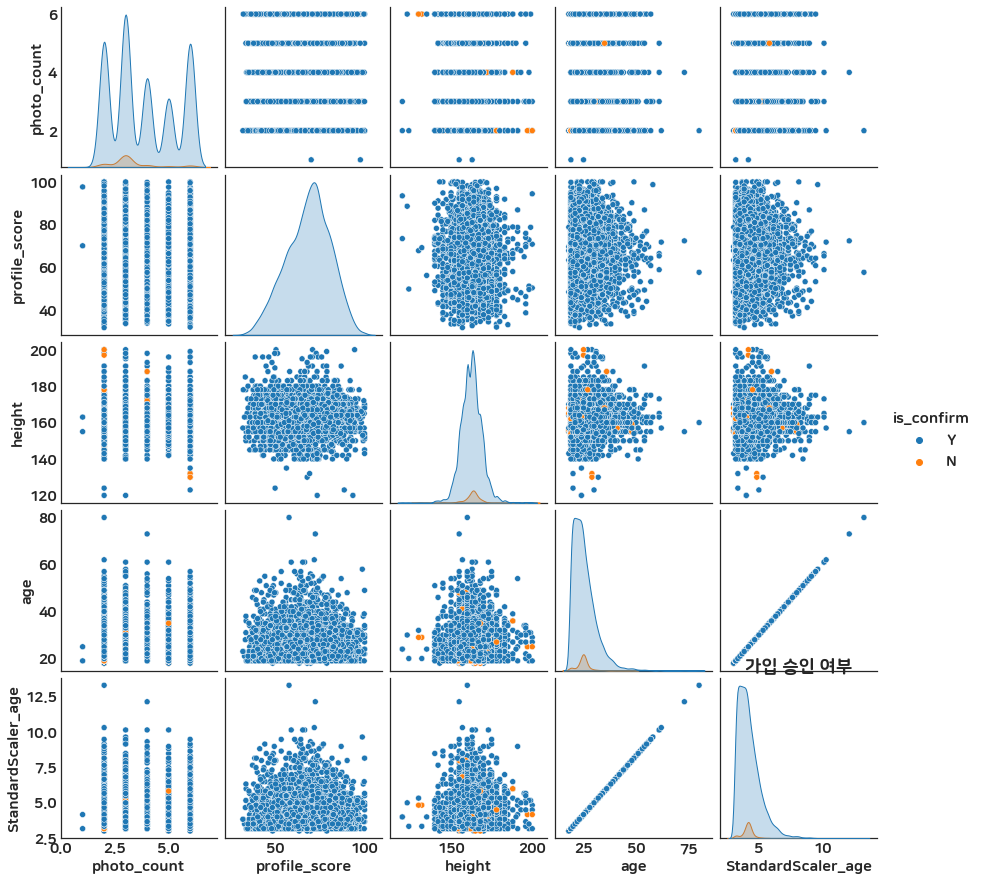

In [76]:
continuous_col_hue1 = ['photo_count',
       'profile_score', 'height',
       'age', 'StandardScaler_age', 'is_confirm']


sns.pairplot(data[continuous_col_hue1], hue="is_confirm")
plt.title("가입 승인 여부")
plt.show()

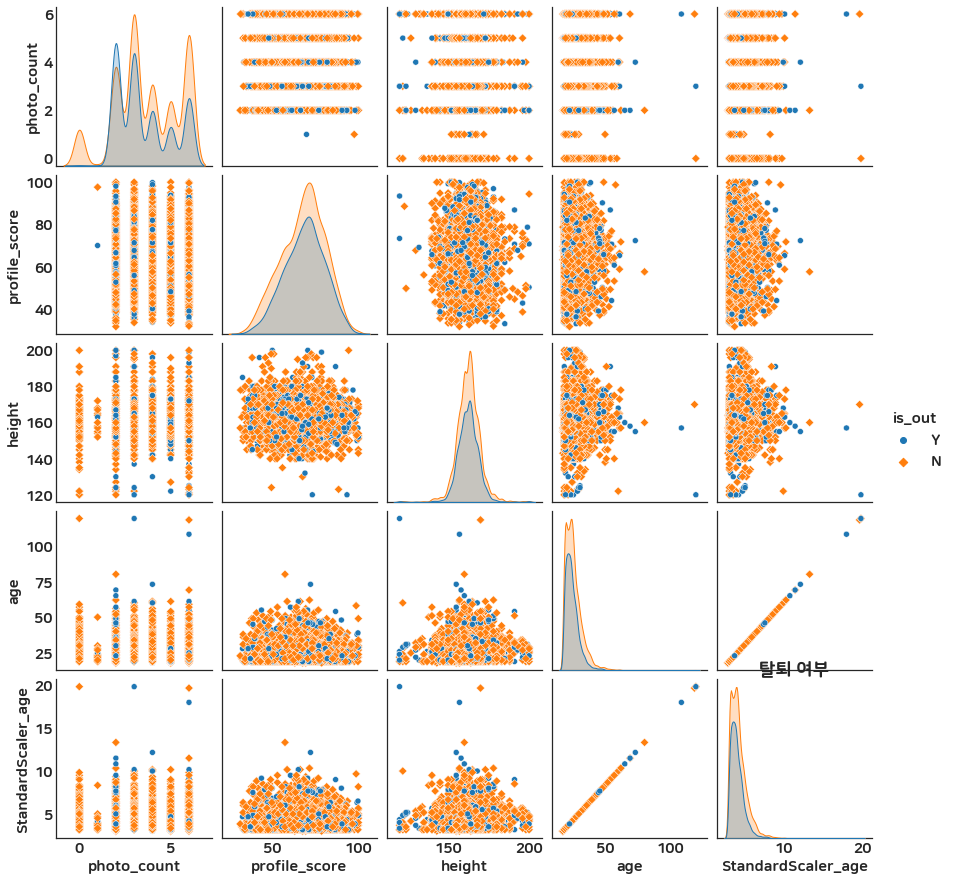

In [77]:
continuous_col_hue2 = ['photo_count',
       'profile_score', 'height',
       'age', 'StandardScaler_age', 'is_out']

sns.pairplot(data[continuous_col_hue2], hue="is_out", markers = ["o", "D"])
plt.title("탈퇴 여부")
plt.show()

<AxesSubplot:title={'center':'Person Correlation of Features'}>

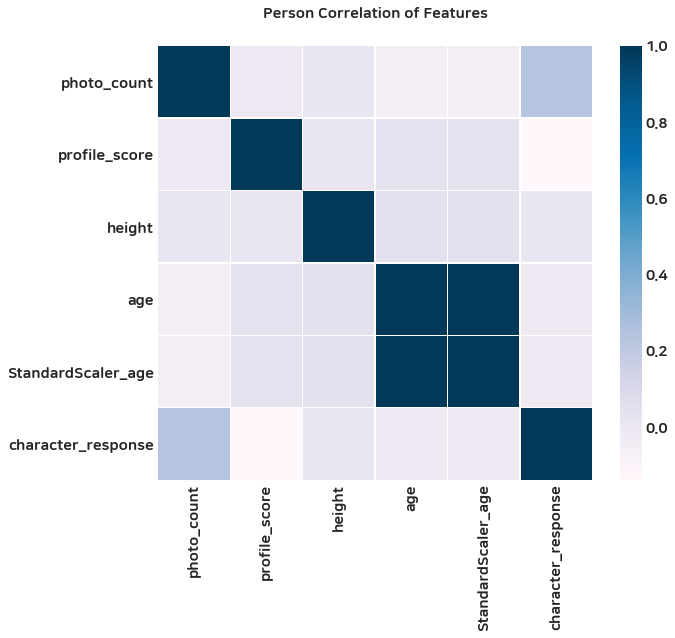

In [78]:
colormap = plt.cm.PuBu 
plt.figure(figsize=(10, 8)) 
plt.title("Person Correlation of Features", y = 1.05, size = 15) 
sns.heatmap(data[continuous_col].corr(), 
            linewidths = 0.1, vmax = 1.0, square = True, 
            cmap = colormap, linecolor = "white", annot = False, 
            annot_kws = {"size" : 16})

## 결과

각 그룹에서 딱히 두드러지는 결과를 발견하지 못함.
추가 분석 중요도가 떨어짐

# Conti x category

In [79]:
category_col_by = ['profile_tier', 'body_type', 'blood_type', 'education', 
       'smoking', 'drinking', 'is_out', 'is_deactivated', 'is_blocked', 'is_confirm',
       'sign_up_completed', 'stage', 'weekdays', 'sign_hours']
continuous_col_by = ['photo_count', 'profile_score', 'height',
       'age', 'StandardScaler_age', 'character_response']

times_col_by = ['rating_p', 'activate_p', 'active_p']

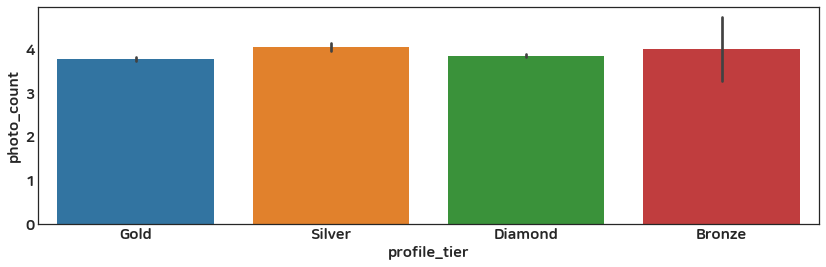

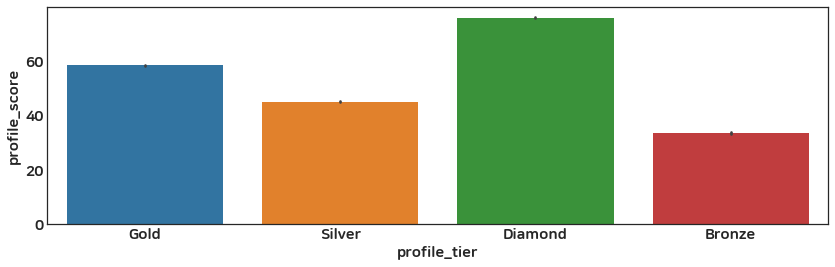

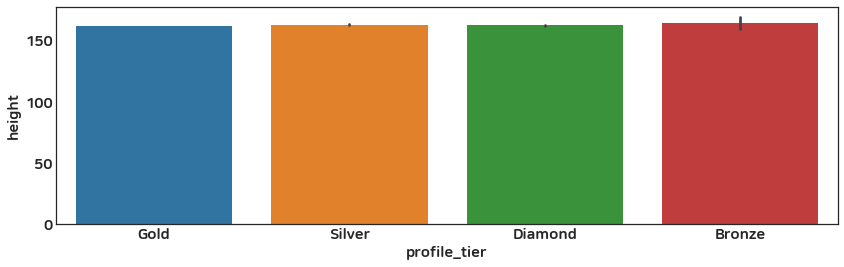

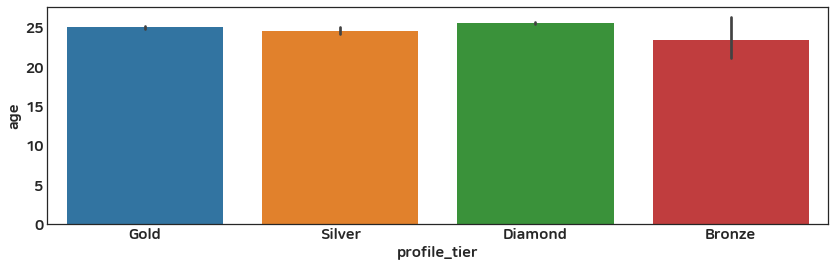

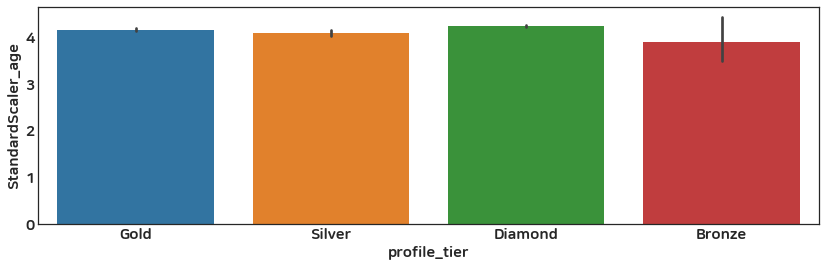

...

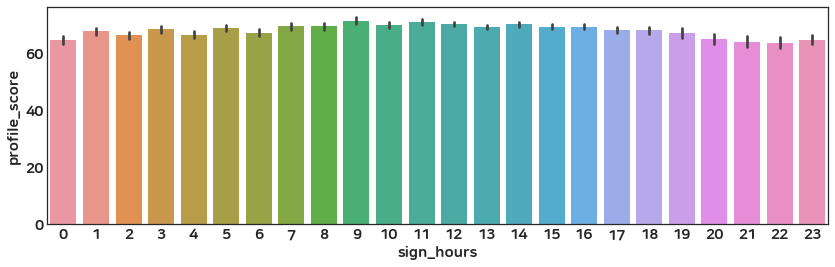

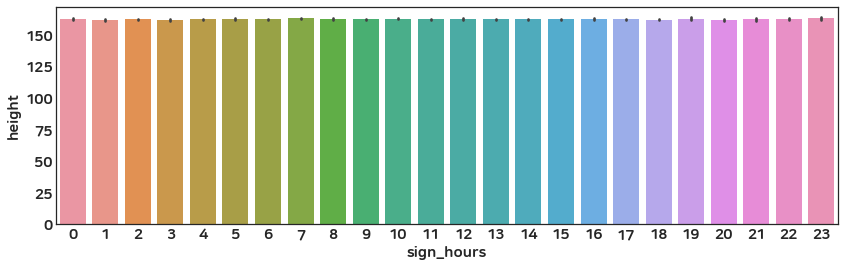

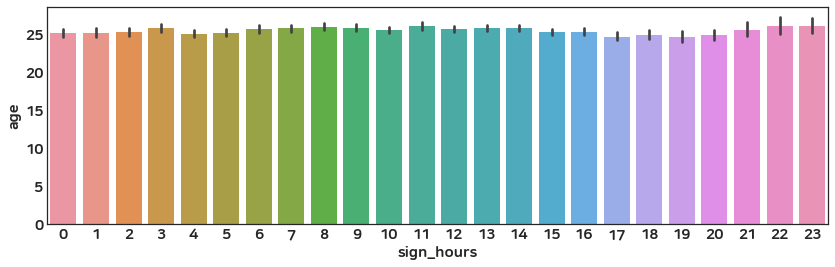

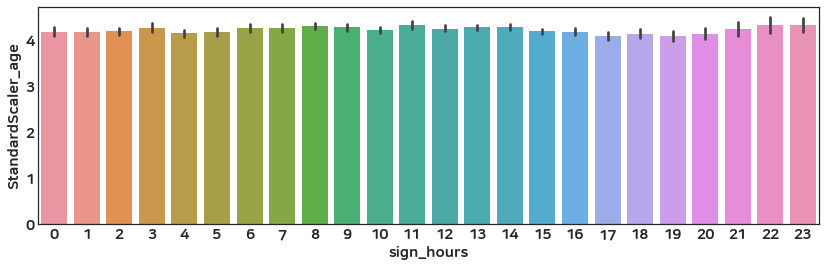

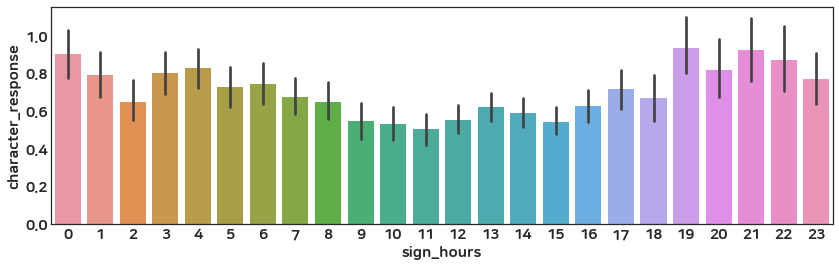

In [80]:
for i in data[category_col_by]:
    for j in data[continuous_col_by]:
        try:
            sns.barplot(x=i, y=j, data=data)
            plt.show()
        except:
            pass

In [82]:
path = os.getcwd()
print(path)
data.to_csv(path + "\\data\\out2.csv")

C:\Users\seong\WorkSpace\testfornothing\DA
